In [1]:
#Load necessary packages
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as sps
import statsmodels.api as sm 
from statsmodels.formula.api import ols
import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from statsmodels.tools.tools import add_constant
from sklearn.linear_model import Lasso, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')
import numpy as np


pd.set_option("display.max_columns", None)

# Helper Functions

In [101]:
def drop_column_using_vif_(df, list_var_not_to_remove=None, thresh=5):
    '''
    Calculates VIF each feature in a pandas dataframe, and repeatedly drop the columns with the highest VIF
    A constant must be added to variance_inflation_factor or the results will be incorrect

    :param df: the pandas dataframe containing only the predictor features, not the response variable
    :param list_var_not_to_remove: the list of variables that should not be removed even though it has a high VIF.
     For example, dummy (or indicator) variables represent a categorical variable with three or more categories.
    :param thresh: the max VIF value before the feature is removed from the dataframe
    :return: dataframe with multicollinear features removed
    '''
    while True:
        # adding a constatnt item to the data
        df_with_const = add_constant(df)

        vif_df = pd.Series([variance_inflation_factor(df_with_const.values, i) 
               for i in range(df_with_const.shape[1])], name= "VIF",
              index=df_with_const.columns).to_frame()

        # drop the const as const should not be removed
        vif_df = vif_df.drop('const')
        
        # drop the variables that should not be removed
        if list_var_not_to_remove is not None:
            vif_df = vif_df.drop(list_var_not_to_remove)
            
        print('Max VIF:', vif_df.VIF.max())
        
        # if the largest VIF is above the thresh, remove a variable with the largest VIF
        if vif_df.VIF.max() > thresh:
            # If there are multiple variables with the maximum VIF, choose the first one
            index_to_drop = vif_df.index[vif_df.VIF == vif_df.VIF.max()].tolist()[0]
            print('Dropping: {}'.format(index_to_drop))
            df = df.drop(columns = index_to_drop)
        else:
            # No VIF is above threshold. Exit the loop
            break

    return df, vif_df

## Processing and Loading Fire and Household Data

In [3]:
# Loading Fire data 
fire_file = "LFB_Incident_data_from_2018_onwards.csv"
fire_df = pd.read_csv(fire_file , low_memory=False, encoding = "ISO-8859-1")
fire_df['DateOfCall'] = pd.to_datetime(fire_df['DateOfCall']) 
fire_df['weekday'] = fire_df['DateOfCall'].apply(lambda x: 1 if x.weekday() < 5 else 0)
lock_down_start_date = pd.to_datetime('01-01-2021', dayfirst = True)
lock_down_end_date = pd.to_datetime('12-04-2021', dayfirst = True)
fire_df['lockdown'] = fire_df['DateOfCall'].apply(lambda x: 1 if (x < lock_down_end_date)
                                              and (x >= lock_down_start_date) else 0)

fire_df.head()

,IncidentNumber,DateOfCall,CalYear,TimeOfCall,HourOfCall,IncidentGroup,StopCodeDescription,SpecialServiceType,PropertyCategory,PropertyType,AddressQualifier,Postcode_full,Postcode_district,UPRN,USRN,IncGeo_BoroughCode,IncGeo_BoroughName,ProperCase,IncGeo_WardCode,IncGeo_WardName,IncGeo_WardNameNew,Easting_m,Northing_m,Easting_rounded,Northing_rounded,Latitude,Longitude,FRS,IncidentStationGround,FirstPumpArriving_AttendanceTime,FirstPumpArriving_DeployedFromStation,SecondPumpArriving_AttendanceTime,SecondPumpArriving_DeployedFromStation,NumStationsWithPumpsAttending,NumPumpsAttending,PumpCount,PumpMinutesRounded,Notional Cost (£),NumCalls,weekday,lockdown
0,000008-01012018,2018-01-01,2018,00:04:25,0,False Alarm,AFA,NaN,Non Residential,Mosque,Within same building,N2 8AY,N2,2.002201e+08,20013420,E09000003,BARNET,Barnet,E05013636,East Finchley,East Finchley,527184.0,189488.0,527150,189450,51.589900,-0.165453,London,Finchley,348.0,Finchley,NaN,NaN,1.0,1.0,1,60,328,1.0,1,0
1,000009-01012018,2018-01-01,2018,00:04:30,0,False Alarm,AFA,NaN,Non Residential,Pub/wine bar/bar,Correct incident location,BR3 1ED,BR3,1.000000e+11,20301747,E09000006,BROMLEY,Bromley,E05013987,Beckenham Town & Copers Cope,Beckenham Town & Copers Cope,537430.0,169565.0,537450,169550,51.408463,-0.025394,London,Beckenham,144.0,Beckenham,NaN,NaN,1.0,1.0,1,60,328,1.0,1,0
2,000010-01012018,2018-01-01,2018,00:04:34,0,Fire,Secondary Fire,NaN,Outdoor Structure,Common external bin storage area,On land associated with building,N13 5SX,N13,2.070869e+08,20704500,E09000010,ENFIELD,Enfield,E05013683,Highfield,Highfield,531901.0,193161.0,531950,193150,51.621823,-0.096022,London,Edmonton,232.0,Southgate,NaN,NaN,1.0,1.0,1,60,328,1.0,1,0
3,000011-01012018,2018-01-01,2018,00:04:58,0,Special Service,Special Service,RTC,Road Vehicle,Multiple Vehicles,In street outside gazetteer location,EN1 4LD,EN1,2.071540e+08,20702569,E09000010,ENFIELD,Enfield,E05013677,Carterhatch,Carterhatch,534799.0,197474.0,534750,197450,51.659894,-0.052524,London,Enfield,22.0,Enfield,NaN,NaN,1.0,1.0,1,60,328,1.0,1,0
4,000014-01012018,2018-01-01,2018,00:07:47,0,Fire,Primary Fire,NaN,Road Vehicle,Car,In street outside gazetteer location,E15 1QY,E15,1.002400e+10,22200068,E09000025,NEWHAM,Newham,E05013917,Maryland,Maryland,539451.0,185362.0,539450,185350,51.549924,0.009877,London,Stratford,241.0,Stratford,NaN,NaN,1.0,1.0,1,60,328,6.0,1,0


In [4]:
# Filtering on property category
fire_df= fire_df[(fire_df["PropertyCategory"]=="Dwelling") & (fire_df["IncidentGroup"]!="Special Service")]
# dropping unnecessary columns
fire_df= fire_df.drop(columns= ["DateOfCall", "TimeOfCall", "HourOfCall", "StopCodeDescription", "SpecialServiceType",
                                "AddressQualifier", "PropertyType", "Postcode_full", "Postcode_district", "USRN",
                                "UPRN", "IncGeo_BoroughName", "Easting_m", "Northing_m",
                                "Easting_rounded", "Northing_rounded", "Latitude", "Longitude","FRS", 
                                "IncidentStationGround", "FirstPumpArriving_DeployedFromStation", "SecondPumpArriving_AttendanceTime",
                                "SecondPumpArriving_DeployedFromStation", "NumStationsWithPumpsAttending", "NumPumpsAttending",
                                "PumpCount", "PumpMinutesRounded", "NumCalls"])
print(fire_df.shape)
fire_df.head()

(237221, 13)


,IncidentNumber,CalYear,IncidentGroup,PropertyCategory,IncGeo_BoroughCode,ProperCase,IncGeo_WardCode,IncGeo_WardName,IncGeo_WardNameNew,FirstPumpArriving_AttendanceTime,Notional Cost (£),weekday,lockdown
13,000036-01012018,2018,False Alarm,Dwelling,E09000006,Bromley,E05014007,St. Paul's Cray,St. Paul's Cray,463.0,328,1,0
15,000038-01012018,2018,False Alarm,Dwelling,E09000005,Brent,E05013508,Queensbury,Queensbury,NaN,328,1,0
19,000048-01012018,2018,Fire,Dwelling,E09000007,Camden,E05013663,Kentish Town North,Kentish Town North,197.0,1886,1,0
31,000067-01012018,2018,False Alarm,Dwelling,E09000025,Newham,E05013906,Canning Town North,Canning Town North,241.0,328,1,0
34,000071-01012018,2018,False Alarm,Dwelling,E09000024,Merton,E05013813,Cricket Green,Cricket Green,294.0,328,1,0


In [5]:
# Aggregating city of London wards
fire_df['IncGeo_WardCode'], fire_df['IncGeo_WardName'] = zip(*fire_df.apply(lambda x: ('E09000001', 'City Of london')
         if x['IncGeo_BoroughCode'] == 'E09000001' else (x['IncGeo_WardCode'], x['IncGeo_WardName']), axis = 1))
fire_df

,IncidentNumber,CalYear,IncidentGroup,PropertyCategory,IncGeo_BoroughCode,ProperCase,IncGeo_WardCode,IncGeo_WardName,IncGeo_WardNameNew,FirstPumpArriving_AttendanceTime,Notional Cost (£),weekday,lockdown
13,000036-01012018,2018,False Alarm,Dwelling,E09000006,Bromley,E05014007,St. Paul's Cray,St. Paul's Cray,463.0,328,1,0
15,000038-01012018,2018,False Alarm,Dwelling,E09000005,Brent,E05013508,Queensbury,Queensbury,NaN,328,1,0
19,000048-01012018,2018,Fire,Dwelling,E09000007,Camden,E05013663,Kentish Town North,Kentish Town North,197.0,1886,1,0
31,000067-01012018,2018,False Alarm,Dwelling,E09000025,Newham,E05013906,Canning Town North,Canning Town North,241.0,328,1,0
34,000071-01012018,2018,False Alarm,Dwelling,E09000024,Merton,E05013813,Cricket Green,Cricket Green,294.0,328,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
783124,185038-31102024,2024,False Alarm,Dwelling,E09000007,Camden,E05013665,KILBURN,KILBURN,269.0,473,1,0
783128,185042-31102024,2024,Fire,Dwelling,E09000028,Southwark,E05011100,DULWICH VILLAGE,DULWICH VILLAGE,329.0,502,1,0
783129,185044-31102024,2024,False Alarm,Dwelling,E09000003,Barnet,E05013641,GARDEN SUBURB,GARDEN SUBURB,328.0,430,1,0
783131,185047-31102024,2024,False Alarm,Dwelling,E09000001,City Of london,E09000001,City Of london,COLEMAN STREET,328.0,430,1,0


In [6]:
#Preparing data to calculate fire rate
#fire_rate= fire_df.groupby(["CalYear", "IncGeo_WardCode", "IncGeo_WardName", "weekday", "lockdown", "IncidentGroup"]).count()[["IncidentNumber"]].unstack("IncidentGroup").reset_index().fillna(0)
#fire_rate.columns=["CalYear","IncGeo_WardCode", "IncGeo_WardName", "weekday", "lockdown", "false_alarm_count", "fire_count"]
fire_rate= fire_df.groupby(["CalYear", "IncGeo_WardCode", "IncGeo_WardName", "lockdown", "IncidentGroup"]).count()[["IncidentNumber"]].unstack("IncidentGroup").reset_index().fillna(0)
fire_rate.columns=["CalYear","IncGeo_WardCode", "IncGeo_WardName", "lockdown", "false_alarm_count", "fire_count"]
fire_rate

,CalYear,IncGeo_WardCode,IncGeo_WardName,lockdown,false_alarm_count,fire_count
0,2018,E05000367,BUNHILL,0,1.0,0.0
1,2018,E05009317,Bethnal Green,0,50.0,12.0
2,2018,E05009318,Blackwall & Cubitt Town,0,39.0,14.0
3,2018,E05009319,Bow East,0,57.0,14.0
4,2018,E05009320,Bow West,0,42.0,13.0
...,...,...,...,...,...,...
6081,2024,E05014116,STREATHAM WELLS,0,42.0,7.0
6082,2024,E05014117,VAUXHALL,0,66.0,3.0
6083,2024,E05014118,WATERLOO & SOUTH BANK,0,35.0,1.0
6084,2024,E05014119,WEST DULWICH,0,40.0,4.0


In [7]:
# Filtering on property category
fire_rate= fire_rate[(fire_rate["CalYear"]==2021)]
print(fire_rate.shape)
fire_rate

(1358, 6)


,CalYear,IncGeo_WardCode,IncGeo_WardName,lockdown,false_alarm_count,fire_count
2139,2021,E05000380,ST. PETER'S,1,1.0,0.0
2140,2021,E05009317,Bethnal Green,0,44.0,10.0
2141,2021,E05009317,Bethnal Green,1,16.0,3.0
2142,2021,E05009318,Blackwall & Cubitt Town,0,68.0,12.0
2143,2021,E05009318,Blackwall & Cubitt Town,1,9.0,3.0
...,...,...,...,...,...,...
3492,2021,E05014118,Waterloo & South Bank,1,19.0,1.0
3493,2021,E05014119,West Dulwich,0,22.0,3.0
3494,2021,E05014119,West Dulwich,1,14.0,4.0
3495,2021,E09000001,City Of london,0,64.0,2.0


In [8]:
# Loading Fire data 2011
fire_file_11 = "data/LFB Incident data from 2009 - 2017.csv"
fire_df_11 = pd.read_csv(fire_file_11 , low_memory=False)
fire_df_11['DateOfCall'] = pd.to_datetime(fire_df_11['DateOfCall']) 
fire_df_11['weekday'] = fire_df_11['DateOfCall'].apply(lambda x: 1 if x.weekday() < 5 else 0)
fire_df_11.head()

,IncidentNumber,DateOfCall,CalYear,TimeOfCall,HourOfCall,IncidentGroup,StopCodeDescription,SpecialServiceType,PropertyCategory,PropertyType,AddressQualifier,Postcode_full,Postcode_district,UPRN,USRN,IncGeo_BoroughCode,IncGeo_BoroughName,ProperCase,IncGeo_WardCode,IncGeo_WardName,IncGeo_WardNameNew,Easting_m,Northing_m,Easting_rounded,Northing_rounded,Latitude,Longitude,FRS,IncidentStationGround,FirstPumpArriving_AttendanceTime,FirstPumpArriving_DeployedFromStation,SecondPumpArriving_AttendanceTime,SecondPumpArriving_DeployedFromStation,NumStationsWithPumpsAttending,NumPumpsAttending,PumpCount,PumpMinutesRounded,Notional Cost (£),NumCalls,weekday
0,235138081.00,2009-01-01,2009,00:00:37,0,Special Service,Special Service,RTC,Road Vehicle,Car,In street close to gazetteer location,SW11 4LB,SW11,NaN,NaN,E09000032,WANDSWORTH,Wandsworth,E05014010,Battersea Park,Battersea Park,528652.0,176830.0,528650,176850,51.475812,-0.148894,London,Battersea,319.0,Battersea,342.0,Clapham,2.0,2.0,2,60,255,1.0,1
1,1091.00,2009-01-01,2009,00:00:46,0,Special Service,Special Service,Assist other agencies,Outdoor,Lake/pond/reservoir,Open land/water - nearest gazetteer location,SE1 7SG,SE1,NaN,NaN,E09000022,LAMBETH,Lambeth,E05014118,Waterloo & South Bank,Waterloo & South Bank,530485.0,179007.0,530450,179050,51.494957,-0.121712,London,Lambeth,NaN,NaN,NaN,NaN,NaN,NaN,1,60,255,1.0,1
2,2091.00,2009-01-01,2009,00:03:00,0,Fire,Secondary Fire,NaN,Outdoor,Road surface/pavement,In street outside gazetteer location,N9 9EL,N9,NaN,NaN,E09000010,ENFIELD,Enfield,E05013682,Haselbury,Haselbury,533773.0,194492.0,533750,194450,51.633342,-0.068488,London,Edmonton,308.0,Edmonton,NaN,NaN,1.0,1.0,1,60,255,2.0,1
3,3091.00,2009-01-01,2009,00:04:27,0,Fire,Secondary Fire,NaN,Outdoor,Domestic garden (vegetation not equipment),On land associated with building,UB10 0DG,UB10,1.000215e+11,21401491.0,E09000017,HILLINGDON,Hillingdon,E05013571,Hillingdon East,Hillingdon East,507738.0,182805.0,507750,182850,51.533882,-0.448089,London,Hillingdon,210.0,Hillingdon,NaN,NaN,1.0,1.0,1,60,255,2.0,1
4,5091.00,2009-01-01,2009,00:05:39,0,Fire,Secondary Fire,NaN,Outdoor,Cycle path/public footpath/bridleway,In street outside gazetteer location,N7 8HG,N7,NaN,NaN,E09000019,ISLINGTON,Islington,E05013708,Laycock,Laycock,531058.0,185307.0,531050,185350,51.551441,-0.111120,London,Holloway,233.0,Holloway,250.0,Holloway,1.0,2.0,2,60,255,1.0,1


In [9]:
# Filtering on property category
fire_df_11= fire_df_11[(fire_df_11["PropertyCategory"]=="Dwelling") & (fire_df_11["IncidentGroup"]!="Special Service")]
# dropping unnecessary columns
fire_df_11= fire_df_11.drop(columns= ["DateOfCall", "TimeOfCall", "HourOfCall", "StopCodeDescription", "SpecialServiceType",
                                "AddressQualifier", "PropertyType", "Postcode_full", "Postcode_district", "USRN",
                                "UPRN", "IncGeo_BoroughName", "Easting_m", "Northing_m",
                                "Easting_rounded", "Northing_rounded", "Latitude", "Longitude","FRS", 
                                "IncidentStationGround", "FirstPumpArriving_DeployedFromStation", "SecondPumpArriving_AttendanceTime",
                                "SecondPumpArriving_DeployedFromStation", "NumStationsWithPumpsAttending", "NumPumpsAttending",
                                "PumpCount", "PumpMinutesRounded", "NumCalls"])
print(fire_df_11.shape)
fire_df_11.head()

(253126, 12)


,IncidentNumber,CalYear,IncidentGroup,PropertyCategory,IncGeo_BoroughCode,ProperCase,IncGeo_WardCode,IncGeo_WardName,IncGeo_WardNameNew,FirstPumpArriving_AttendanceTime,Notional Cost (£),weekday
5,6091.00,2009,False Alarm,Dwelling,E09000007,Camden,E05013663,Kentish Town North,Kentish Town North,172.0,255,1
10,12091.00,2009,Fire,Dwelling,E09000010,Enfield,E05013681,Grange Park,Grange Park,NaN,506,1
23,38091.00,2009,Fire,Dwelling,E09000011,Greenwich,E05014089,Shooters Hill,Shooters Hill,369.0,391,1
25,41091.00,2009,False Alarm,Dwelling,E09000025,Newham,E05013905,Boleyn,Boleyn,190.0,255,1
26,43091.00,2009,False Alarm,Dwelling,E09000028,Southwark,E05011102,Faraday,Faraday,652.0,255,1


In [10]:
# Aggregating city of London wards 
fire_df_11['IncGeo_WardCode'], fire_df_11['IncGeo_WardName'] = zip(*fire_df_11.apply(lambda x: ('E09000001', 'City Of london')
         if x['IncGeo_BoroughCode'] == 'E09000001' else (x['IncGeo_WardCode'], x['IncGeo_WardName']), axis = 1))
fire_df_11

,IncidentNumber,CalYear,IncidentGroup,PropertyCategory,IncGeo_BoroughCode,ProperCase,IncGeo_WardCode,IncGeo_WardName,IncGeo_WardNameNew,FirstPumpArriving_AttendanceTime,Notional Cost (£),weekday
5,6091.00,2009,False Alarm,Dwelling,E09000007,Camden,E05013663,Kentish Town North,Kentish Town North,172.0,255,1
10,12091.00,2009,Fire,Dwelling,E09000010,Enfield,E05013681,Grange Park,Grange Park,NaN,506,1
23,38091.00,2009,Fire,Dwelling,E09000011,Greenwich,E05014089,Shooters Hill,Shooters Hill,369.0,391,1
25,41091.00,2009,False Alarm,Dwelling,E09000025,Newham,E05013905,Boleyn,Boleyn,190.0,255,1
26,43091.00,2009,False Alarm,Dwelling,E09000028,Southwark,E05011102,Faraday,Faraday,652.0,255,1
...,...,...,...,...,...,...,...,...,...,...,...,...
988263,175172-31122017,2017,False Alarm,Dwelling,E09000008,Croydon,E05011472,Norbury & Pollards Hill,Norbury & Pollards Hill,171.0,328,0
988265,175176-31122017,2017,False Alarm,Dwelling,E09000011,Greenwich,E05014091,West Thamesmead,West Thamesmead,272.0,328,0
988270,175185-31122017,2017,False Alarm,Dwelling,E09000001,City Of london,E09000001,City Of london,TOWER,292.0,328,0
988274,175190-31122017,2017,Fire,Dwelling,E09000018,Hounslow,E05013621,Hounslow East,Hounslow East,120.0,328,0


In [11]:
#Preparing data to calculate fire rate
#fire_rate_11= fire_df_11.groupby(["CalYear", "IncGeo_WardCode", "IncGeo_WardName", "weekday", "IncidentGroup"]).count()[["IncidentNumber"]].unstack("IncidentGroup").reset_index().fillna(0)
#fire_rate_11.columns=["CalYear","IncGeo_WardCode", "IncGeo_WardName", "weekday", "false_alarm_count", "fire_count"]
fire_rate_11= fire_df_11.groupby(["CalYear", "IncGeo_WardCode", "IncGeo_WardName", "IncidentGroup"]).count()[["IncidentNumber"]].unstack("IncidentGroup").reset_index().fillna(0)
fire_rate_11.columns=["CalYear","IncGeo_WardCode", "IncGeo_WardName", "false_alarm_count", "fire_count"]
fire_rate_11

,CalYear,IncGeo_WardCode,IncGeo_WardName,false_alarm_count,fire_count
0,2009,E05000064,Barnehurst,1.0,0.0
1,2009,E05000065,Belvedere,1.0,0.0
2,2009,E05000066,Blackfen and Lamorbey,1.0,0.0
3,2009,E05000070,Colyers,3.0,2.0
4,2009,E05000072,Cray Meadows,3.0,1.0
...,...,...,...,...,...
6556,2017,E05014116,Streatham Wells,26.0,11.0
6557,2017,E05014117,Vauxhall,33.0,6.0
6558,2017,E05014118,Waterloo & South Bank,19.0,8.0
6559,2017,E05014119,West Dulwich,38.0,5.0


In [12]:
# Filtering on property category
fire_rate_11= fire_rate_11[(fire_rate_11["CalYear"]==2011)]
print(fire_rate_11.shape)
fire_rate_11

(743, 5)


,CalYear,IncGeo_WardCode,IncGeo_WardName,false_alarm_count,fire_count
1502,2011,E05000065,Belvedere,1.0,0.0
1503,2011,E05000070,Colyers,1.0,1.0
1504,2011,E05000071,Crayford,1.0,1.0
1505,2011,E05000072,Cray Meadows,2.0,0.0
1506,2011,E05000073,Danson Park,0.0,1.0
...,...,...,...,...,...
2240,2011,E05014116,Streatham Wells,25.0,9.0
2241,2011,E05014117,Vauxhall,43.0,3.0
2242,2011,E05014118,Waterloo & South Bank,24.0,12.0
2243,2011,E05014119,West Dulwich,49.0,8.0


In [13]:
# Importing Household data 
household_file_11= "socioeconomic data/ward/Household composition.xlsx"
household_2011= pd.read_excel(household_file_11 , sheet_name= "2011")
household_2011= household_2011.drop(columns= household_2011.columns[5:])
household_2011.head()

,ward code,ward name,local authority code,local authority name,All households
0,E09000001,City of London (aggregated),E09000001,City of London,4385
1,E05014053,Abbey,E09000002,Barking and Dagenham,1289
2,E05014054,Alibon,E09000002,Barking and Dagenham,3336
3,E05014055,Barking Riverside,E09000002,Barking and Dagenham,2090
4,E05014056,Beam,E09000002,Barking and Dagenham,2757


In [14]:
# Importing Household data 
household_file_21= "socioeconomic data/ward/Household composition.xlsx"
household_2021= pd.read_excel(household_file_21 , sheet_name= "2021")
household_2021= household_2021.drop(columns= household_2021.columns[5:])
household_2021.head()

,ward code,ward name,local authority code,local authority name,All households
0,E09000001,City of London (aggregated),E09000001,City of London,4933
1,E05014053,Abbey,E09000002,Barking and Dagenham,1460
2,E05014054,Alibon,E09000002,Barking and Dagenham,3340
3,E05014055,Barking Riverside,E09000002,Barking and Dagenham,3391
4,E05014056,Beam,E09000002,Barking and Dagenham,2716


In [15]:
#Joining Household data with fire incident data for year 2021
#to calculate fire rate in London Boroughs
incident_rate_2021= fire_rate.merge(household_2021, how="inner", left_on=["IncGeo_WardCode"], right_on=["ward code"])
incident_rate_2021["fire_rate"]=(incident_rate_2021["fire_count"]/incident_rate_2021["All households"]).round(4)
incident_rate_2021["false_alarm_rate"]=(incident_rate_2021["false_alarm_count"]/incident_rate_2021["All households"]).round(4)
incident_rate_2021

,CalYear,IncGeo_WardCode,IncGeo_WardName,lockdown,false_alarm_count,fire_count,ward code,ward name,local authority code,local authority name,All households,fire_rate,false_alarm_rate
0,2021,E05009317,Bethnal Green,0,44.0,10.0,E05009317,Bethnal Green,E09000030,Tower Hamlets,7366,0.0014,0.0060
1,2021,E05009317,Bethnal Green,1,16.0,3.0,E05009317,Bethnal Green,E09000030,Tower Hamlets,7366,0.0004,0.0022
2,2021,E05009318,Blackwall & Cubitt Town,0,68.0,12.0,E05009318,Blackwall & Cubitt Town,E09000030,Tower Hamlets,9714,0.0012,0.0070
3,2021,E05009318,Blackwall & Cubitt Town,1,9.0,3.0,E05009318,Blackwall & Cubitt Town,E09000030,Tower Hamlets,9714,0.0003,0.0009
4,2021,E05009319,Bow East,0,55.0,13.0,E05009319,Bow East,E09000030,Tower Hamlets,8397,0.0015,0.0065
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1352,2021,E05014118,Waterloo & South Bank,1,19.0,1.0,E05014118,Waterloo & South Bank,E09000022,Lambeth,3869,0.0003,0.0049
1353,2021,E05014119,West Dulwich,0,22.0,3.0,E05014119,West Dulwich,E09000022,Lambeth,4762,0.0006,0.0046
1354,2021,E05014119,West Dulwich,1,14.0,4.0,E05014119,West Dulwich,E09000022,Lambeth,4762,0.0008,0.0029
1355,2021,E09000001,City Of london,0,64.0,2.0,E09000001,City of London (aggregated),E09000001,City of London,4933,0.0004,0.0130


In [131]:
print(fire_rate['fire_count'].sum() / household_2021['All households'].sum()* 100)
print(fire_rate['false_alarm_count'].sum() / household_2021['All households'].sum()* 100)
print(fire_rate_11['fire_count'].sum() / household_2021['All households'].sum() * 100)
print(fire_rate_11['false_alarm_count'].sum() / household_2021['All households'].sum() * 100)

0.14347491335008666
0.8374625436753227
0.19658457297235116
0.6148924857860857


In [16]:
incident_rate_2021[['fire_rate','false_alarm_rate']].describe()

,fire_rate,false_alarm_rate
count,1357.000000,1357.000000
mean,0.000712,0.004202
std,0.000567,0.003955
min,0.000000,0.000000
25%,0.000300,0.001600
50%,0.000600,0.003000
75%,0.001000,0.005500
max,0.004200,0.035500


In [17]:
#Joining Household data with fire incident data for year 2011
#to calculate fire rate in London Boroughs
incident_rate_2011= fire_rate_11.merge(household_2011, how="inner", left_on=["IncGeo_WardCode"], right_on=["ward code"])
incident_rate_2011["fire_rate"]=(incident_rate_2011["fire_count"]/incident_rate_2011["All households"]).round(4)
incident_rate_2011["false_alarm_rate"]=(incident_rate_2011["false_alarm_count"]/incident_rate_2011["All households"]).round(4)
incident_rate_2011

,CalYear,IncGeo_WardCode,IncGeo_WardName,false_alarm_count,fire_count,ward code,ward name,local authority code,local authority name,All households,fire_rate,false_alarm_rate
0,2011,E05009317,Bethnal Green,55.0,23.0,E05009317,Bethnal Green,E09000030,Tower Hamlets,7124,0.0032,0.0077
1,2011,E05009318,Blackwall & Cubitt Town,24.0,16.0,E05009318,Blackwall & Cubitt Town,E09000030,Tower Hamlets,6418,0.0025,0.0037
2,2011,E05009319,Bow East,57.0,20.0,E05009319,Bow East,E09000030,Tower Hamlets,6595,0.0030,0.0086
3,2011,E05009320,Bow West,37.0,20.0,E05009320,Bow West,E09000030,Tower Hamlets,5009,0.0040,0.0074
4,2011,E05009321,Bromley North,29.0,13.0,E05009321,Bromley North,E09000030,Tower Hamlets,3507,0.0037,0.0083
...,...,...,...,...,...,...,...,...,...,...,...,...
674,2011,E05014116,Streatham Wells,25.0,9.0,E05014116,Streatham Wells,E09000022,Lambeth,4044,0.0022,0.0062
675,2011,E05014117,Vauxhall,43.0,3.0,E05014117,Vauxhall,E09000022,Lambeth,3386,0.0009,0.0127
676,2011,E05014118,Waterloo & South Bank,24.0,12.0,E05014118,Waterloo & South Bank,E09000022,Lambeth,4016,0.0030,0.0060
677,2011,E05014119,West Dulwich,49.0,8.0,E05014119,West Dulwich,E09000022,Lambeth,4770,0.0017,0.0103


In [18]:
incident_rate_2011[['fire_rate','false_alarm_rate']].describe()

,fire_rate,false_alarm_rate
count,679.000000,679.000000
mean,0.002044,0.006381
std,0.000974,0.004373
min,0.000000,0.000400
25%,0.001300,0.003400
50%,0.001900,0.005100
75%,0.002600,0.008100
max,0.005500,0.032500


## Processing and Loading Socio-economic Data

In [19]:
central_heating_file = "socioeconomic data/ward/central heating.xlsx"
central_heating_df_2011= pd.read_excel(central_heating_file, sheet_name="2011")
central_heating_df_2011

,ward code,ward name,local authority code,local authority name,All households,No central heating,Gas,Electric,Oil,Solid fuel,Other including communal and renewable,Two or more types
0,E09000001,City of London,E09000001,City of London,4385,189,1338,2104,56,0,610,88
1,E05014053,Abbey,E09000002,Barking and Dagenham,1290,73,614,443,1,3,91,65
2,E05014054,Alibon,E09000002,Barking and Dagenham,3336,80,2875,129,0,8,81,163
3,E05014055,Barking Riverside,E09000002,Barking and Dagenham,2089,53,1499,340,0,1,48,148
4,E05014056,Beam,E09000002,Barking and Dagenham,2757,108,2258,181,0,4,86,120
...,...,...,...,...,...,...,...,...,...,...,...,...
675,E05013805,Regent's Park,E09000033,Westminster,6756,246,4290,1026,222,2,659,311
676,E05013806,St James's,E09000033,Westminster,5056,352,2869,1260,130,1,266,178
677,E05013807,Vincent Square,E09000033,Westminster,5368,256,3236,1393,63,4,205,211
678,E05013808,West End,E09000033,Westminster,7148,471,4257,1331,175,3,616,295


In [20]:
# Importing central heat dataset 
central_heating_file = "socioeconomic data/ward/central heating.xlsx"
central_heating_df_2011= pd.read_excel(central_heating_file, sheet_name="2011")
# Calculating the percentage of central heated households per ward and dropping all the unnecessary columns
central_heating_df_2011["central_heat"] = (central_heating_df_2011["All households "]-central_heating_df_2011["No central heating"])/central_heating_df_2011["All households "]
central_heating_df_2011["no_central_heat"] = central_heating_df_2011["No central heating"]/central_heating_df_2011["All households "]
central_heating_df_2011 = central_heating_df_2011 [["ward code", "central_heat", "no_central_heat"]]
central_heating_df_2011

,ward code,central_heat,no_central_heat
0,E09000001,0.956899,0.043101
1,E05014053,0.943411,0.056589
2,E05014054,0.976019,0.023981
3,E05014055,0.974629,0.025371
4,E05014056,0.960827,0.039173
...,...,...,...
675,E05013805,0.963588,0.036412
676,E05013806,0.930380,0.069620
677,E05013807,0.952310,0.047690
678,E05013808,0.934107,0.065893


In [21]:
# Importing central heat dataset 
central_heating_file = "socioeconomic data/ward/central heating.xlsx"
central_heating_df_2021= pd.read_excel(central_heating_file, sheet_name="2021")
# Calculating the percentage of central heated households per ward and dropping all the unnecessary columns
central_heating_df_2021["central_heat"] = (central_heating_df_2021["All households "]-central_heating_df_2021["No central heating"])/central_heating_df_2021["All households "]
central_heating_df_2021["no_central_heat"] = central_heating_df_2021["No central heating"]/central_heating_df_2021["All households "]
central_heating_df_2021 = central_heating_df_2021 [["ward code", "central_heat", "no_central_heat"]]
central_heating_df_2021

,ward code,central_heat,no_central_heat
0,E09000001,0.961781,0.038219
1,E05014053,0.972337,0.027663
2,E05014054,0.982319,0.017681
3,E05014055,0.970423,0.029577
4,E05014056,0.971503,0.028497
...,...,...,...
675,E05013805,0.959739,0.040261
676,E05013806,0.956261,0.043739
677,E05013807,0.961092,0.038908
678,E05013808,0.947932,0.052068


In [22]:
#Importing accomodation dataset
accomodation_type_file = "socioeconomic data/ward/accommodation type.xlsx"
accomodation_type_2011 = pd.read_excel(accomodation_type_file, sheet_name= "2011")
#Grouping household types into flats, not detached and detached then calculating the percentage 
accomodation_type_2011["not_detached"] = (accomodation_type_2011["Semi-detached"]+accomodation_type_2011["Terraced"])/accomodation_type_2011["All households "]
accomodation_type_2011["detached"] = accomodation_type_2011["Detached"]/accomodation_type_2011["All households "]
accomodation_type_2011["flat"] = (accomodation_type_2011["Purpose built flat"]+accomodation_type_2011["Flat in a converted/shared house (includes all households in shared dwellings)"]+accomodation_type_2011["Flat in a commercial building"] )/accomodation_type_2011["All households "]
accomodation_type_2011 = accomodation_type_2011 [["ward code", "not_detached", "detached", "flat"]]
accomodation_type_2011

,ward code,not_detached,detached,flat
0,E09000001,0.018928,0.003421,0.977651
1,E05014053,0.230411,0.029480,0.740109
2,E05014054,0.791729,0.036859,0.171411
3,E05014055,0.548804,0.041627,0.409569
4,E05014056,0.780638,0.044598,0.173314
...,...,...,...,...
675,E05013805,0.080829,0.013768,0.905107
676,E05013806,0.038948,0.005931,0.954725
677,E05013807,0.026463,0.003168,0.970369
678,E05013808,0.039737,0.005317,0.954666


In [23]:
#Importing accomodation dataset
accomodation_type_file = "socioeconomic data/ward/accommodation type.xlsx"
accomodation_type_2021 = pd.read_excel(accomodation_type_file, sheet_name= "2021")
#Grouping household types into flats, not detached and detached then calculating the percentage 
accomodation_type_2021["not_detached"] = (accomodation_type_2021["Semi-detached"]+accomodation_type_2021["Terraced"])/accomodation_type_2021["All households "]
accomodation_type_2021["detached"] = accomodation_type_2021["Detached"]/accomodation_type_2021["All households "]
accomodation_type_2021["flat"] = (accomodation_type_2021["Purpose built flat"]+accomodation_type_2021["Flat in a converted/shared house"]+accomodation_type_2021["In a commercial building or other converted, non-residential "] )/accomodation_type_2021["All households "]
accomodation_type_2021 = accomodation_type_2021 [["ward code", "not_detached", "detached", "flat"]]
accomodation_type_2021

,ward code,not_detached,detached,flat
0,E09000001,0.019329,0.001424,0.979247
1,E05014053,0.220770,0.025447,0.751032
2,E05014054,0.772958,0.059527,0.167215
3,E05014055,0.418783,0.042823,0.538098
4,E05014056,0.764749,0.071534,0.163348
...,...,...,...,...
675,E05013805,0.089621,0.012398,0.897272
676,E05013806,0.040643,0.006193,0.952003
677,E05013807,0.028128,0.001940,0.969350
678,E05013808,0.048246,0.005599,0.945661


In [24]:
#Importing deprivation dimension dataset
deprivation_file = "socioeconomic data/ward/Household deprivation.xlsx"
deprivation_2011 = pd.read_excel(deprivation_file, sheet_name= "2011")
#Grouping deprivation dimensions into not deprived, deprived and sever deprived then calculating the percentage 
deprivation_2011["deprived"] = (deprivation_2011["1 dimension"]+deprivation_2011["2 dimensions"])/deprivation_2011["All Households"]
deprivation_2011["not_deprived"] = deprivation_2011["deprived in: no dimensions"]/deprivation_2011["All Households"]
deprivation_2011["sever_deprived"] = (deprivation_2011["3 dimensions"]+deprivation_2011["4 dimensions"])/deprivation_2011["All Households"]
#deprivation_2011["deprived"] = (deprivation_2011["1 dimension"]+deprivation_2011["2 dimensions"]+deprivation_2011["3 dimensions"]+deprivation_2011["4 dimensions"])/deprivation_2011["All Households"]
deprivation_2011 = deprivation_2011 [["ward code", "not_deprived", "deprived", "sever_deprived"]]
deprivation_2011

,ward code,not_deprived,deprived,sever_deprived
0,E09000001,0.449943,0.517902,0.032155
1,E05014053,0.204034,0.718386,0.078355
2,E05014054,0.284472,0.637290,0.078237
3,E05014055,0.328230,0.589952,0.082297
4,E05014056,0.294886,0.609721,0.095031
...,...,...,...,...
675,E05013805,0.453738,0.482605,0.063657
676,E05013806,0.416568,0.522539,0.060696
677,E05013807,0.412971,0.507268,0.079948
678,E05013808,0.399608,0.532251,0.068140


In [25]:
#Importing deprivation dimension dataset
deprivation_file = "socioeconomic data/ward/Household deprivation.xlsx"
deprivation_2021 = pd.read_excel(deprivation_file, sheet_name= "2021")
#Grouping deprivation dimensions into not deprived, deprived and sever deprived then calculating the percentage 
deprivation_2021["deprived"] = (deprivation_2021["1 dimension"]+deprivation_2021["2 dimensions"])/deprivation_2021["All Households"]
deprivation_2021["not_deprived"] = deprivation_2021["deprived in: no dimensions"]/deprivation_2021["All Households"]
deprivation_2021["sever_deprived"] = (deprivation_2021["3 dimensions"]+deprivation_2021["4 dimensions"])/deprivation_2021["All Households"]
#deprivation_2021["deprived"] = (deprivation_2021["1 dimension"]+deprivation_2021["2 dimensions"]+deprivation_2021["3 dimensions"]+deprivation_2021["4 dimensions"])/deprivation_2021["All Households"]
deprivation_2021 = deprivation_2021 [["ward code", "not_deprived", "deprived", "sever_deprived"]]
deprivation_2021

,ward code,not_deprived,deprived,sever_deprived
0,E09000001,0.598289,0.385007,0.016704
1,E05014053,0.413699,0.540411,0.045890
2,E05014054,0.389354,0.555622,0.055024
3,E05014055,0.470432,0.479007,0.050562
4,E05014056,0.391128,0.559704,0.049168
...,...,...,...,...
675,E05013805,0.577079,0.390782,0.032138
676,E05013806,0.565487,0.395047,0.039466
677,E05013807,0.492936,0.447649,0.059416
678,E05013808,0.536866,0.423634,0.039500


In [26]:
#Importing economic activity dataset
economic_activity_file = "socioeconomic data/ward/Economic Activity.xlsx"
economic_activity_2011 = pd.read_excel(economic_activity_file, sheet_name= "2011")
#Grouping economic activity into economiclly_active, unemployed and economiclly_inactive then calculating the percentage 
economic_activity_2011["economiclly_active"] = (economic_activity_2011["Economically active Total"]-economic_activity_2011["Unemployed"])/economic_activity_2011["All usual residents aged 16-74 "]
economic_activity_2011["unemployed"] = economic_activity_2011["Unemployed"]/economic_activity_2011["All usual residents aged 16-74 "]
economic_activity_2011["economiclly_inactive"] = (economic_activity_2011["Economically inactive Total"])/economic_activity_2011["All usual residents aged 16-74 "]
economic_activity_2011 = economic_activity_2011 [["ward code", "economiclly_active", "unemployed", "economiclly_inactive"]]
economic_activity_2011


,ward code,economiclly_active,unemployed,economiclly_inactive
0,E09000001,0.758681,0.029650,0.211670
1,E05014053,0.629452,0.065626,0.304922
2,E05014054,0.620045,0.067089,0.312865
3,E05014055,0.637913,0.079182,0.282905
4,E05014056,0.619330,0.068517,0.312153
...,...,...,...,...
675,E05013805,0.623460,0.031715,0.344824
676,E05013806,0.656989,0.042314,0.300698
677,E05013807,0.672438,0.046371,0.281191
678,E05013808,0.678086,0.035661,0.286253


In [27]:
#Importing economic activity dataset
economic_activity_file = "socioeconomic data/ward/Economic Activity.xlsx"
economic_activity_2021 = pd.read_excel(economic_activity_file, sheet_name= "2021")
#Grouping economic activity into economiclly_active, unemployed and economiclly_inactive then calculating the percentage 
economic_activity_2021["economiclly_active"] = (economic_activity_2021["Economically active Total"]-economic_activity_2021["Unemployed"])/economic_activity_2021["All usual residents aged 16+"]
economic_activity_2021["unemployed"] = economic_activity_2021["Unemployed"]/economic_activity_2021["All usual residents aged 16+"]
economic_activity_2021["economiclly_inactive"] = (economic_activity_2021["Economically inactive Total"])/economic_activity_2021["All usual residents aged 16+"]
economic_activity_2021 = economic_activity_2021 [["ward code", "economiclly_active", "unemployed", "economiclly_inactive"]]
economic_activity_2021

,ward code,economiclly_active,unemployed,economiclly_inactive
0,E09000001,0.673072,0.035313,0.291615
1,E05014053,0.644309,0.048442,0.307249
2,E05014054,0.607133,0.045455,0.347412
3,E05014055,0.667681,0.052296,0.280023
4,E05014056,0.592928,0.048684,0.358388
...,...,...,...,...
675,E05013805,0.571290,0.031050,0.397659
676,E05013806,0.594642,0.032828,0.372530
677,E05013807,0.582562,0.042842,0.374596
678,E05013808,0.580623,0.029133,0.390244


In [28]:
#Importing English language dataset
english_language_file = "socioeconomic data/ward/English Proficiency.xlsx"
english_language_2011 = pd.read_excel(english_language_file, sheet_name= "2011")
#Grouping English Proficiency into speak english, and doesn't speak English then calculating the percentage 
english_language_2011["speak_english"] = (english_language_2011["Main language is English"]+english_language_2011["Language not English: Speak English very well"]+english_language_2011["Language not English: Speak English well"])/english_language_2011["Usual residents aged 3+"]
english_language_2011["doesnt_speak_english"] = (english_language_2011["Language not English: Cannot speak English well"]+english_language_2011["Language not English: Cannot speak English"])/english_language_2011["Usual residents aged 3+"]
english_language_2011 = english_language_2011 [["ward code", "speak_english", "doesnt_speak_english"]]
english_language_2011

,ward code,speak_english,doesnt_speak_english
0,E09000001,0.985996,0.014004
1,E05014053,0.934410,0.065913
2,E05014054,0.973575,0.026306
3,E05014055,0.962479,0.037711
4,E05014056,0.964480,0.035381
...,...,...,...
675,E05013805,0.963456,0.036544
676,E05013806,0.965129,0.034971
677,E05013807,0.968035,0.031867
678,E05013808,0.968258,0.031742


In [29]:
#Importing English language dataset
english_language_file = "socioeconomic data/ward/English Proficiency.xlsx"
english_language_2021 = pd.read_excel(english_language_file, sheet_name= "2021")
#Grouping English Proficiency into speak english, and doesn't speak English then calculating the percentage 
english_language_2021["speak_english"] = (english_language_2021["Main language is English"]+english_language_2021["Language not English: Speak English very well"]+english_language_2021["Language not English: Speak English well"])/english_language_2021["Usual residents aged 3+"]
english_language_2021["doesnt_speak_english"] = (english_language_2021["Language not English: Cannot speak English well"]+english_language_2021["Language not English: Cannot speak English"])/english_language_2021["Usual residents aged 3+"]
english_language_2021 = english_language_2021 [["ward code", "speak_english", "doesnt_speak_english"]]
english_language_2021

,ward code,speak_english,doesnt_speak_english
0,E09000001,0.983657,0.016343
1,E05014053,0.921321,0.078679
2,E05014054,0.950406,0.049594
3,E05014055,0.963611,0.036389
4,E05014056,0.948897,0.051103
...,...,...,...
675,E05013805,0.975004,0.024996
676,E05013806,0.969151,0.030849
677,E05013807,0.967235,0.032765
678,E05013808,0.969947,0.030053


In [30]:
#Importing ethnicity dataset
ethnicity_file = "socioeconomic data/ward/Ethnic group.xlsx"
ethnicity_2011 = pd.read_excel(ethnicity_file, sheet_name= "2011")
#Grouping ethnicities into White, Mixed, Asian, Black and others then calculating the percentage 
ethnicity_2011["white"] = (ethnicity_2011["White British"]+ethnicity_2011["White Irish"]+ethnicity_2011["White Gypsy/Irish Traveller"]+ethnicity_2011["White Other"])/ethnicity_2011["All usual residents"]
ethnicity_2011["mixed"] = (ethnicity_2011["Mixed White and Asian"]+ethnicity_2011["Mixed White and Black African"]+ethnicity_2011["Mixed White and Black Caribbean"]+ethnicity_2011["Mixed Other"])/ethnicity_2011["All usual residents"]
ethnicity_2011["asian"] = (ethnicity_2011["Asian Bangladeshi"]+ethnicity_2011["Asian Chinese"]+ethnicity_2011["Asian Indian"]+ethnicity_2011["Asian Pakistani"]+ethnicity_2011["Asian Other"])/ethnicity_2011["All usual residents"]
ethnicity_2011["black"] = (ethnicity_2011["Black African"]+ethnicity_2011["Black Caribbean"]+ethnicity_2011["Black Other"])/ethnicity_2011["All usual residents"]
ethnicity_2011["other_ethnicity"] = (ethnicity_2011["Other Arab"]+ethnicity_2011["Other Any other"])/ethnicity_2011["All usual residents"]
ethnicity_2011 = ethnicity_2011 [["ward code", "white", "mixed", "asian", "black", "other_ethnicity"]]
ethnicity_2011

,ward code,white,mixed,asian,black,other_ethnicity
0,E09000001,0.786305,0.039186,0.127458,0.026169,0.020881
1,E05014053,0.306466,0.043910,0.428571,0.187669,0.033684
2,E05014054,0.665248,0.033162,0.095339,0.196617,0.009635
3,E05014055,0.419299,0.052477,0.146729,0.361471,0.020369
4,E05014056,0.580481,0.038673,0.090541,0.269140,0.021035
...,...,...,...,...,...,...
675,E05013805,0.586561,0.044964,0.215987,0.041489,0.110998
676,E05013806,0.711037,0.042549,0.153020,0.049185,0.044306
677,E05013807,0.708109,0.045510,0.123001,0.071719,0.051566
678,E05013808,0.664015,0.048960,0.160343,0.045441,0.081166


In [31]:
#Importing ethnicity dataset
ethnicity_file = "socioeconomic data/ward/Ethnic group.xlsx"
ethnicity_2021 = pd.read_excel(ethnicity_file, sheet_name= "2021")
#Grouping ethnicities into White, Mixed, Asian, Black and others then calculating the percentage 
ethnicity_2021["white"] = (ethnicity_2021["White British"]+ethnicity_2021["White Irish"]+ethnicity_2021["White Gypsy/Irish Traveller"]+ethnicity_2021["White Other"])/ethnicity_2021["All usual residents"]
ethnicity_2021["mixed"] = (ethnicity_2021["Mixed White and Asian"]+ethnicity_2021["Mixed White and Black African"]+ethnicity_2021["Mixed White and Black Caribbean"]+ethnicity_2021["Mixed Other"])/ethnicity_2021["All usual residents"]
ethnicity_2021["asian"] = (ethnicity_2021["Asian Bangladeshi"]+ethnicity_2021["Asian Chinese"]+ethnicity_2021["Asian Indian"]+ethnicity_2021["Asian Pakistani"]+ethnicity_2021["Asian Other"])/ethnicity_2021["All usual residents"]
ethnicity_2021["black"] = (ethnicity_2021["Black African"]+ethnicity_2021["Black Caribbean"]+ethnicity_2021["Black Other"])/ethnicity_2021["All usual residents"]
ethnicity_2021["other_ethnicity"] = (ethnicity_2021["Other Arab"]+ethnicity_2021["Other Any other"])/ethnicity_2021["All usual residents"]
ethnicity_2021 = ethnicity_2021 [["ward code", "white", "mixed", "asian", "black", "other_ethnicity"]]
ethnicity_2021

,ward code,white,mixed,asian,black,other_ethnicity
0,E09000001,0.687675,0.054404,0.167754,0.026794,0.056151
1,E05014053,0.292203,0.031037,0.476911,0.149129,0.042140
2,E05014054,0.554758,0.033168,0.177065,0.200222,0.030033
3,E05014055,0.311487,0.057086,0.221581,0.374341,0.033715
4,E05014056,0.452153,0.041029,0.186005,0.282536,0.035287
...,...,...,...,...,...,...
675,E05013805,0.556705,0.052676,0.221817,0.045890,0.118246
676,E05013806,0.600934,0.061991,0.203358,0.050765,0.075800
677,E05013807,0.594832,0.065925,0.166557,0.076865,0.088183
678,E05013808,0.590853,0.064387,0.184014,0.051155,0.101776


In [32]:
#Importing education dataset
education_file = "socioeconomic data/ward/qualifications.xlsx"
education_2011 = pd.read_excel(education_file, sheet_name= "2011")
#Grouping education levels into low education, medium education, high education, other education level and then calculating the percentage 
education_2011["low_education"] = (education_2011["none"]+education_2011["Level 1"])/education_2011["Usual residents aged 16+"]
education_2011["medium_education"] = (education_2011["Level 2"]+education_2011["Level 3"]+education_2011["Apprentice-ship"])/education_2011["Usual residents aged 16+"]
education_2011["high_education"] = education_2011["Level 4+"]/education_2011["Usual residents aged 16+"]
education_2011["other_education"] = education_2011["Other"]/education_2011["Usual residents aged 16+"]
education_2011 = education_2011 [["ward code", "low_education", "medium_education", "high_education",
                                  "other_education"]]
education_2011

,ward code,low_education,medium_education,high_education,other_education
0,E09000001,0.110289,0.144486,0.683642,0.061584
1,E05014053,0.212898,0.180264,0.435897,0.170940
2,E05014054,0.460805,0.272094,0.183414,0.083686
3,E05014055,0.353699,0.244635,0.291088,0.110578
4,E05014056,0.443949,0.269292,0.202816,0.083942
...,...,...,...,...,...
675,E05013805,0.158305,0.155369,0.553356,0.132970
676,E05013806,0.178427,0.202622,0.494777,0.124174
677,E05013807,0.184816,0.176959,0.533754,0.104471
678,E05013808,0.150672,0.172505,0.540013,0.136809


In [33]:
#Importing education dataset
education_file = "socioeconomic data/ward/qualifications.xlsx"
education_2021 = pd.read_excel(education_file, sheet_name= "2021")
#Grouping education levels into low education, medium education, high education, other education level and then calculating the percentage 
education_2021["low_education"] = (education_2021["none"]+education_2021["Level 1"])/education_2021["Usual residents aged 16+"]
education_2021["medium_education"] = (education_2021["Level 2"]+education_2021["Level 3"]+education_2021["Apprentice-ship"])/education_2021["Usual residents aged 16+"]
education_2021["high_education"] = education_2021["Level 4+"]/education_2021["Usual residents aged 16+"]
education_2021["other_education"] = education_2021["Other"]/education_2021["Usual residents aged 16+"]
education_2021 = education_2021 [["ward code", "low_education", "medium_education", "high_education",
                                  "other_education"]]
education_2021

,ward code,low_education,medium_education,high_education,other_education
0,E09000001,0.094019,0.148083,0.741166,0.016731
1,E05014053,0.247552,0.219183,0.488011,0.045255
2,E05014054,0.351279,0.298112,0.311772,0.038838
3,E05014055,0.244845,0.286959,0.437264,0.030932
4,E05014056,0.351502,0.297324,0.313249,0.037925
...,...,...,...,...,...
675,E05013805,0.133578,0.169675,0.661905,0.034842
676,E05013806,0.146785,0.224997,0.593165,0.035053
677,E05013807,0.160901,0.217265,0.589611,0.032223
678,E05013808,0.142264,0.207026,0.613068,0.037641


In [34]:
#Importing house ownership dataset
tenure_file = "socioeconomic data/ward/tenure - households.xlsx"
tenure_2011 = pd.read_excel(tenure_file, sheet_name= "2011")
#Grouping house ownership into owned, social rent, privet rent, and other then calculating the percentage 
tenure_2011["owned"] = (tenure_2011["Owned outright"]+tenure_2011["Owned with a mortgage or loan"])/tenure_2011["All Households"]
tenure_2011["social_rented"] = (tenure_2011["Rented from Local Authority"]+tenure_2011["Other social rented"])/tenure_2011["All Households"]
tenure_2011["private_rented"] = (tenure_2011["Private landlord or letting agency"] + tenure_2011["Other private rented"])/tenure_2011["All Households"]
tenure_2011["other_tenure"] = (tenure_2011["Shared ownership "] + tenure_2011['Rent free'])/tenure_2011["All Households"]
tenure_2011 = tenure_2011 [["ward code", "owned", "social_rented", "private_rented",
                                  "other_tenure"]]
tenure_2011

,ward code,owned,social_rented,private_rented,other_tenure
0,E09000001,0.423033,0.165336,0.358723,0.052908
1,E05014053,0.274631,0.237393,0.456168,0.031808
2,E05014054,0.506147,0.289955,0.177811,0.026087
3,E05014055,0.382114,0.369201,0.215686,0.032999
4,E05014056,0.557811,0.190286,0.231968,0.019935
...,...,...,...,...,...
675,E05013805,0.381495,0.131902,0.439082,0.047520
676,E05013806,0.253855,0.283511,0.407276,0.055358
677,E05013807,0.322400,0.337868,0.294447,0.045285
678,E05013808,0.240487,0.231253,0.472440,0.055820


In [35]:
#Importing house ownership dataset
tenure_file = "socioeconomic data/ward/tenure - households.xlsx"
tenure_2021 = pd.read_excel(tenure_file, sheet_name= "2021")
#Grouping house ownership into owned, social rent, privet rent, and other then calculating the percentage 
tenure_2021["owned"] = (tenure_2021["Owned outright"]+tenure_2021["Owned with a mortgage or loan"])/tenure_2021["All Households"]
tenure_2021["social_rented"] = (tenure_2021["Rented from Local Authority"]+tenure_2021["Other social rented"])/tenure_2021["All Households"]
tenure_2021["private_rented"] = (tenure_2021["Private landlord or letting agency"] + tenure_2021["Other private rented"])/tenure_2021["All Households"]
tenure_2021["other_tenure"] = (tenure_2021["Shared ownership "] + tenure_2021['Rent free'])/tenure_2021["All Households"]
tenure_2021 = tenure_2021 [["ward code", "owned", "social_rented", "private_rented",
                                  "other_tenure"]]
tenure_2021

,ward code,owned,social_rented,private_rented,other_tenure
0,E09000001,0.364006,0.148893,0.484258,0.002844
1,E05014053,0.222527,0.201236,0.535027,0.041209
2,E05014054,0.469217,0.271967,0.245069,0.013748
3,E05014055,0.359610,0.389725,0.208739,0.041925
4,E05014056,0.480236,0.213151,0.297008,0.009605
...,...,...,...,...,...
675,E05013805,0.355842,0.121442,0.514584,0.008132
676,E05013806,0.223794,0.283278,0.487309,0.005619
677,E05013807,0.273255,0.366854,0.346161,0.013730
678,E05013808,0.227618,0.242319,0.520482,0.009580


In [36]:
#Importing house ownership dataset
health_file = "socioeconomic data/ward/General health.xlsx"
health_2011 = pd.read_excel(health_file, sheet_name= "2011")
#Grouping house ownership into owned, social rent, privet rent, and other then calculating the percentage 
health_2011["good_health"] = (health_2011["Very good health"]+health_2011["Good health"])/health_2011["All Usual residents "]
health_2011["fair_health"] = (health_2011["Fair health"])/health_2011["All Usual residents "]
health_2011["bad_health"] = (health_2011["Bad health"] + health_2011['Very bad health'])/health_2011["All Usual residents "]
health_2011 = health_2011 [["ward code", "good_health", "fair_health", "bad_health"]]
health_2011

,ward code,good_health,fair_health,bad_health
0,E09000001,0.879458,0.087186,0.033356
1,E05014053,0.867709,0.089597,0.042694
2,E05014054,0.821757,0.121219,0.057024
3,E05014055,0.863974,0.095287,0.040739
4,E05014056,0.816567,0.129867,0.053567
...,...,...,...,...
675,E05013805,0.863287,0.091021,0.045692
676,E05013806,0.851747,0.098868,0.049385
677,E05013807,0.839546,0.105014,0.055440
678,E05013808,0.864443,0.089810,0.045747


In [37]:
#Importing house ownership dataset
health_file = "socioeconomic data/ward/General health.xlsx"
health_2021 = pd.read_excel(health_file, sheet_name= "2021")
#Grouping house ownership into owned, social rent, privet rent, and other then calculating the percentage 
health_2021["good_health"] = (health_2021["Very good health"]+health_2021["Good health"])/health_2021["All Usual residents "]
health_2021["fair_health"] = (health_2021["Fair health"])/health_2021["All Usual residents "]
health_2021["bad_health"] = (health_2021["Bad health"] + health_2021['Very bad health'])/health_2021["All Usual residents "]
health_2021 = health_2021 [["ward code", "good_health", "fair_health", "bad_health"]]
health_2021

,ward code,good_health,fair_health,bad_health
0,E09000001,0.893490,0.079678,0.026832
1,E05014053,0.876135,0.089304,0.034561
2,E05014054,0.837583,0.111010,0.051407
3,E05014055,0.880716,0.086083,0.033201
4,E05014056,0.849384,0.108267,0.042350
...,...,...,...,...
675,E05013805,0.889501,0.078637,0.031862
676,E05013806,0.869957,0.089206,0.040837
677,E05013807,0.847235,0.100679,0.052085
678,E05013808,0.862695,0.095687,0.041618


In [38]:
#Importing house ownership dataset
occupancy_rate_file = "socioeconomic data/ward/occupancy rating - bedrooms.xlsx"
occupancy_rate_2011 = pd.read_excel(occupancy_rate_file, sheet_name= "2011")
#Grouping house ownership into owned, social rent, privet rent, and other then calculating the percentage 
occupancy_rate_2011["occupancy_good_fit"] = (occupancy_rate_2011["Occupancy rating: +2 or more"]+occupancy_rate_2011["+1"])/occupancy_rate_2011["All Households"]
occupancy_rate_2011["occupancy_fit"] = (occupancy_rate_2011["0"])/occupancy_rate_2011["All Households"]
occupancy_rate_2011["occupancy_bad_fit"] = (occupancy_rate_2011["-1"] + occupancy_rate_2011['-2 or less'])/occupancy_rate_2011["All Households"]
occupancy_rate_2011 = occupancy_rate_2011[["ward code", "occupancy_good_fit", "occupancy_fit", "occupancy_bad_fit"]]
occupancy_rate_2011

,ward code,occupancy_good_fit,occupancy_fit,occupancy_bad_fit
0,E05009317,0.322476,0.488699,0.188825
1,E05009318,0.370832,0.510128,0.119040
2,E05009319,0.341168,0.547233,0.111600
3,E05009320,0.404073,0.450389,0.145538
4,E05009321,0.258911,0.537211,0.203878
...,...,...,...,...
675,E05014116,0.456973,0.419139,0.123887
676,E05014117,0.347210,0.537053,0.115737
677,E05014118,0.395418,0.501992,0.102590
678,E05014119,0.553249,0.362683,0.084067


In [39]:
#Importing house ownership dataset
occupancy_rate_file = "socioeconomic data/ward/occupancy rating - bedrooms.xlsx"
occupancy_rate_2021 = pd.read_excel(occupancy_rate_file, sheet_name= "2021")
#Grouping house ownership into owned, social rent, privet rent, and other then calculating the percentage 
occupancy_rate_2021["occupancy_good_fit"] = (occupancy_rate_2021["Occupancy rating: +2 or more"]+occupancy_rate_2021["+1"])/occupancy_rate_2021["All Households"]
occupancy_rate_2021["occupancy_fit"] = (occupancy_rate_2021["0"])/occupancy_rate_2021["All Households"]
occupancy_rate_2021["occupancy_bad_fit"] = (occupancy_rate_2021["-1"] + occupancy_rate_2021['-2 or less'])/occupancy_rate_2021["All Households"]
occupancy_rate_2021 = occupancy_rate_2021[["ward code", "occupancy_good_fit", "occupancy_fit", "occupancy_bad_fit"]]
occupancy_rate_2021

,ward code,occupancy_good_fit,occupancy_fit,occupancy_bad_fit
0,E05009317,0.320548,0.484684,0.194768
1,E05009318,0.317491,0.577126,0.105383
2,E05009319,0.343010,0.540274,0.116716
3,E05009320,0.416982,0.444402,0.138616
4,E05009321,0.272584,0.532069,0.195348
...,...,...,...,...
675,E05014116,0.482484,0.424015,0.093501
676,E05014117,0.348258,0.562408,0.089335
677,E05014118,0.368543,0.547262,0.084194
678,E05014119,0.556558,0.368940,0.074502


In [40]:
#Importing house ownership dataset
cars_file = "socioeconomic data/ward/cars or vans.xlsx"
cars_2011 = pd.read_excel(cars_file, sheet_name= "2011")
#Grouping house ownership into owned, social rent, privet rent, and other then calculating the percentage 
cars_2011["no_cars"] = (cars_2011["none"])/cars_2011["All households "]
cars_2011["one_car"] = (cars_2011["one"])/cars_2011["All households "]
cars_2011["two_cars_more"] = (cars_2011["two"] + cars_2011['three or more'])/cars_2011["All households "]
cars_2011 = cars_2011[["ward code", "no_cars", "one_car", "two_cars_more"]]
cars_2011

,ward code,no_cars,one_car,two_cars_more
0,E09000001,0.693957,0.250855,0.055188
1,E05014053,0.671063,0.276959,0.051978
2,E05014054,0.363500,0.463590,0.172910
3,E05014055,0.383732,0.463636,0.152632
4,E05014056,0.372144,0.444324,0.183533
...,...,...,...,...
675,E05013805,0.578979,0.325241,0.095781
676,E05013806,0.687760,0.245402,0.066838
677,E05013807,0.634619,0.306503,0.058878
678,E05013808,0.713026,0.215615,0.071359


In [41]:
#Importing house ownership dataset
cars_file = "socioeconomic data/ward/cars or vans.xlsx"
cars_2021 = pd.read_excel(cars_file, sheet_name= "2021")
#Grouping house ownership into owned, social rent, privet rent, and other then calculating the percentage 
cars_2021["no_cars"] = (cars_2021["none"])/cars_2021["All households "]
cars_2021["one_car"] = (cars_2021["one"])/cars_2021["All households "]
cars_2021["two_cars_more"] = (cars_2021["two"] + cars_2021['three or more'])/cars_2021["All households "]
cars_2021 = cars_2021[["ward code", "no_cars", "one_car", "two_cars_more"]]
cars_2021

,ward code,no_cars,one_car,two_cars_more
0,E09000001,0.772635,0.192904,0.034462
1,E05014053,0.653820,0.283551,0.062629
2,E05014054,0.324858,0.454083,0.221059
3,E05014055,0.312592,0.524034,0.163374
4,E05014056,0.333457,0.458318,0.208225
...,...,...,...,...
675,E05013805,0.626525,0.298143,0.075332
676,E05013806,0.758674,0.192867,0.048459
677,E05013807,0.687088,0.267352,0.045560
678,E05013808,0.737813,0.205698,0.056489


In [42]:
#Importing house ownership dataset
unpaid_care_file = "socioeconomic data/ward/Unpaid care.xlsx"
unpaid_care_2011 = pd.read_excel(unpaid_care_file, sheet_name= "2011")
#Grouping house ownership into owned, social rent, privet rent, and other then calculating the percentage 
unpaid_care_2011["no_care_hours"] = (unpaid_care_2011["Provides no care"])/unpaid_care_2011["All Usual residents aged 5 and over"]
unpaid_care_2011["few_care_hours"] = (unpaid_care_2011["1 to 19 hours "])/unpaid_care_2011["All Usual residents aged 5 and over"]
unpaid_care_2011["lots_care_hours"] = (unpaid_care_2011["20 to 49 hours "] + unpaid_care_2011['50 or more hours '])/unpaid_care_2011["All Usual residents aged 5 and over"]
unpaid_care_2011 = unpaid_care_2011[["ward code", "no_care_hours", "few_care_hours", "lots_care_hours"]]
unpaid_care_2011

,ward code,no_care_hours,few_care_hours,lots_care_hours
0,E09000001,0.919316,0.063734,0.016949
1,E05014053,0.933086,0.035485,0.031430
2,E05014054,0.906223,0.046951,0.046826
3,E05014055,0.927174,0.038935,0.033891
4,E05014056,0.903994,0.050109,0.045897
...,...,...,...,...
675,E05013805,0.926173,0.048145,0.025682
676,E05013806,0.931939,0.048055,0.020006
677,E05013807,0.919423,0.055322,0.025256
678,E05013808,0.938420,0.042267,0.019313


In [43]:
#Importing house ownership dataset
unpaid_care_file = "socioeconomic data/ward/Unpaid care.xlsx"
unpaid_care_2021 = pd.read_excel(unpaid_care_file, sheet_name= "2021")
#Grouping house ownership into owned, social rent, privet rent, and other then calculating the percentage 
unpaid_care_2021["no_care_hours"] = (unpaid_care_2021["Provides no care"])/unpaid_care_2021["All Usual residents aged 5 and over"]
unpaid_care_2021["few_care_hours"] = (unpaid_care_2021["1 to 19 hours "])/unpaid_care_2021["All Usual residents aged 5 and over"]
unpaid_care_2021["lots_care_hours"] = (unpaid_care_2021["20 to 49 hours "] + unpaid_care_2021['50 or more hours '])/unpaid_care_2021["All Usual residents aged 5 and over"]
unpaid_care_2021 = unpaid_care_2021[["ward code", "no_care_hours", "few_care_hours", "lots_care_hours"]]
unpaid_care_2021

,ward code,no_care_hours,few_care_hours,lots_care_hours
0,E09000001,0.941430,0.039923,0.018647
1,E05014053,0.957483,0.019301,0.023217
2,E05014054,0.928704,0.025471,0.045826
3,E05014055,0.941807,0.021334,0.036859
4,E05014056,0.933788,0.023014,0.043199
...,...,...,...,...
675,E05013805,0.930713,0.037017,0.032269
676,E05013806,0.947525,0.029664,0.022811
677,E05013807,0.930782,0.037294,0.031924
678,E05013808,0.927776,0.036888,0.035336


In [44]:
#Importing crime rate dataset
crime_df = pd.read_excel("socioeconomic data\ward\crimes by ward.xlsx", sheet_name = "total crime by ward")
crime_df

,ward code,2011,2021,All usual residents 2011,All usual residents 2021,2011 crime rate,2021 crime rate
0,E05009317,1976,2430,19702,21205,0.100294,0.114596
1,E05009318,893,1478,13953,21816,0.064001,0.067748
2,E05009319,1460,1916,14781,19523,0.098775,0.098141
3,E05009320,1658,1387,12939,13733,0.128140,0.100998
4,E05009321,840,1158,9333,11431,0.090003,0.101303
...,...,...,...,...,...,...,...
675,E05014116,735,698,9636,9879,0.076276,0.070655
676,E05014117,1853,1407,6639,9633,0.279108,0.146060
677,E05014118,2735,3351,8318,8872,0.328805,0.377705
678,E05014119,974,847,11297,11505,0.086218,0.073620


## Prepare Income Dataset on Ward Level

In [44]:
uk_lsoa_msoa_mapping = pd.read_csv("socioeconomic data\ward\PCD_OA21_LSOA21_MSOA21_LAD_NOV22_UK_LU.csv",
                                   encoding = "ISO-8859-1")
uk_lsoa_msoa_mapping.head()
uk_lsoa_msoa_mapping = uk_lsoa_msoa_mapping[uk_lsoa_msoa_mapping.columns[7:]].copy()
uk_lsoa_msoa_mapping = uk_lsoa_msoa_mapping.drop_duplicates()
uk_lsoa_msoa_mapping.columns = ['LSOA21CD', 'MSOA code', 'ladcd', 'lsoa21nm', 'msoa21nm', 'ladnm', 'ladnmw']
print(uk_lsoa_msoa_mapping.shape)

income_df = pd.read_excel("socioeconomic data\ward\saiefy1920finalqaddownload280923.xlsx",
                          sheet_name = 'Total annual income', skiprows = 4)

#income_df = pd.read_excel("socioeconomic data\ward\incomeestimatesforsmallareasdatasetfinancialyearending20181.xls",
#                          sheet_name = 'Total annual income', skiprows = 4)
#income_df = pd.read_excel("socioeconomic data\ward\housingaffordabilityratiosformiddlelayersuperoutputareas140624.xlsx",
#                          sheet_name = 'Table 2', skiprows = 3)
print(income_df.shape)

lsoa_msoa_income_df = uk_lsoa_msoa_mapping.set_index("MSOA code").join(income_df.set_index("MSOA code"),
                                                                 how = 'inner').reset_index()
print(lsoa_msoa_income_df.shape)
print(income_df[income_df["MSOA code"].isin(uk_lsoa_msoa_mapping["MSOA code"].unique().tolist())].shape)
print(income_df[~income_df["MSOA code"].isin(uk_lsoa_msoa_mapping["MSOA code"].unique().tolist())].shape)
print(uk_lsoa_msoa_mapping[uk_lsoa_msoa_mapping["MSOA code"].isin(income_df["MSOA code"].unique().tolist())].shape)
print(uk_lsoa_msoa_mapping[~uk_lsoa_msoa_mapping["MSOA code"].isin(income_df["MSOA code"].unique().tolist())].shape)

lsoa_ward_mapping_df = pd.read_csv("socioeconomic data\ward\LSOA_(2021)_Ward_(2022)_LAD_(2022).csv")
print(lsoa_ward_mapping_df.shape)

uk_lsoa_ward_income_df = lsoa_msoa_income_df.set_index("LSOA21CD").join(
                    lsoa_ward_mapping_df.set_index("LSOA21CD"), how = 'inner').reset_index()
print(uk_lsoa_ward_income_df.shape)
print(lsoa_msoa_income_df[lsoa_msoa_income_df["LSOA21CD"].isin(lsoa_ward_mapping_df["LSOA21CD"].unique().tolist())].shape)
print(lsoa_msoa_income_df[~lsoa_msoa_income_df["LSOA21CD"].isin(lsoa_ward_mapping_df["LSOA21CD"].unique().tolist())].shape)
print(lsoa_ward_mapping_df[lsoa_ward_mapping_df["LSOA21CD"].isin(lsoa_msoa_income_df["LSOA21CD"].unique().tolist())].shape)
print(lsoa_ward_mapping_df[~lsoa_ward_mapping_df["LSOA21CD"].isin(lsoa_msoa_income_df["LSOA21CD"].unique().tolist())].shape)
uk_lsoa_ward_income_df

C:\Users\ayham\AppData\Local\Temp\ipykernel_30680\3543440881.py:1: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  uk_lsoa_msoa_mapping = pd.read_csv("socioeconomic data\ward\PCD_OA21_LSOA21_MSOA21_LAD_NOV22_UK_LU.csv",


(43551, 7)
(7201, 10)
(34806, 16)
(7080, 10)
(121, 10)
(34806, 7)
(8745, 7)
(35672, 10)
(34806, 25)
(34806, 16)
(0, 16)
(34806, 10)
(866, 10)


,LSOA21CD,MSOA code,ladcd,lsoa21nm,msoa21nm,ladnm,ladnmw,MSOA name,Local authority code,Local authority name,Region code,Region name,Total annual income (£),Upper confidence limit (£),Lower confidence limit (£),Confidence interval (£),LSOA21NM,LSOA21NMW,WD22CD,WD22NM,WD22NMW,LAD22CD,LAD22NM,LAD22NMW,ObjectId
0,E01032739,E02000001,E09000001,City of London 001F,City of London 001,City of London,NaN,City of London 001,E09000001,City of London,E12000007,London,101800,127500,81300,46200,City of London 001F,NaN,E05009312,Walbrook,NaN,E09000001,City of London,NaN,12068
1,E01000005,E02000001,E09000001,City of London 001E,City of London 001,City of London,NaN,City of London 001,E09000001,City of London,E12000007,London,101800,127500,81300,46200,City of London 001E,NaN,E05009308,Portsoken,NaN,E09000001,City of London,NaN,12067
2,E01032740,E02000001,E09000001,City of London 001G,City of London 001,City of London,NaN,City of London 001,E09000001,City of London,E12000007,London,101800,127500,81300,46200,City of London 001G,NaN,E05009305,Farringdon Without,NaN,E09000001,City of London,NaN,12066
3,E01000001,E02000001,E09000001,City of London 001A,City of London 001,City of London,NaN,City of London 001,E09000001,City of London,E12000007,London,101800,127500,81300,46200,City of London 001A,NaN,E05009288,Aldersgate,NaN,E09000001,City of London,NaN,12063
4,E01000003,E02000001,E09000001,City of London 001C,City of London 001,City of London,NaN,City of London 001,E09000001,City of London,E12000007,London,101800,127500,81300,46200,City of London 001C,NaN,E05009302,Cripplegate,NaN,E09000001,City of London,NaN,12064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34801,W01001952,W02000423,W06000015,Cardiff 049F,Cardiff 049,Cardiff,Caerdydd,Cardiff 049,W06000015,Cardiff,W92000004,Wales,40400,48200,33900,14300,Cardiff 049F,Caerdydd 049F,W05001271,Butetown,Butetown,W06000015,Cardiff,Caerdydd,34101
34802,W01001951,W02000423,W06000015,Cardiff 049E,Cardiff 049,Cardiff,Caerdydd,Cardiff 049,W06000015,Cardiff,W92000004,Wales,40400,48200,33900,14300,Cardiff 049E,Caerdydd 049E,W05001271,Butetown,Butetown,W06000015,Cardiff,Caerdydd,34097
34803,W01001699,W02000423,W06000015,Cardiff 049A,Cardiff 049,Cardiff,Caerdydd,Cardiff 049,W06000015,Cardiff,W92000004,Wales,40400,48200,33900,14300,Cardiff 049A,Caerdydd 049A,W05001271,Butetown,Butetown,W06000015,Cardiff,Caerdydd,34094
34804,W01001950,W02000423,W06000015,Cardiff 049D,Cardiff 049,Cardiff,Caerdydd,Cardiff 049,W06000015,Cardiff,W92000004,Wales,40400,48200,33900,14300,Cardiff 049D,Caerdydd 049D,W05001271,Butetown,Butetown,W06000015,Cardiff,Caerdydd,34099


In [45]:
uk_ward_income_df = uk_lsoa_ward_income_df.groupby(["WD22CD","WD22NM", "Local authority code",
                            "Local authority name", "Region code", "Region name", "Total annual income (£)",
                            "Upper confidence limit (£)", "Lower confidence limit (£)","Confidence interval (£)"
                            ]).count()['LSOA21CD'].reset_index()
uk_ward_income_df = uk_ward_income_df[uk_ward_income_df['Region name'] == 'London'].drop(columns = ['LSOA21CD'])

uk_ward_income_df['WD22CD'], uk_ward_income_df['WD22NM'] = zip(*uk_ward_income_df.apply(
    lambda x:('E09000001', 'City Of london') if x['Local authority code'] == 'E09000001' else
    (x['WD22CD'], x['WD22NM']), axis = 1))

uk_ward_income_df = uk_ward_income_df.groupby(["WD22CD","WD22NM", "Local authority code","Local authority name",
                             "Region code", "Region name"]).mean().reset_index()
#tt = tmp_ward_income_df.groupby(["WD22CD","WD22NM", "Local authority code","Local authority name",
#                                 "Gross annual household income (£)"]).count()['LSOA21CD'].reset_index()
#tt = tt[tt['Local authority code'].apply(lambda x: x.startswith("E09"))].drop(columns = ['LSOA21CD'])
uk_ward_income_df

,WD22CD,WD22NM,Local authority code,Local authority name,Region code,Region name,Total annual income (£),Upper confidence limit (£),Lower confidence limit (£),Confidence interval (£)
0,E05009317,Bethnal Green,E09000030,Tower Hamlets,E12000007,London,51240.0,60780.000000,43180.0,17600.000000
1,E05009318,Blackwall & Cubitt Town,E09000030,Tower Hamlets,E12000007,London,61600.0,72700.000000,52200.0,20500.000000
2,E05009319,Bow East,E09000030,Tower Hamlets,E12000007,London,57150.0,67700.000000,48250.0,19450.000000
3,E05009320,Bow West,E09000030,Tower Hamlets,E12000007,London,61250.0,72500.000000,51750.0,20750.000000
4,E05009321,Bromley North,E09000030,Tower Hamlets,E12000007,London,50450.0,59600.000000,42650.0,16950.000000
...,...,...,...,...,...,...,...,...,...,...
668,E05014116,Streatham Wells,E09000022,Lambeth,E12000007,London,63000.0,74533.333333,53300.0,21233.333333
669,E05014117,Vauxhall,E09000022,Lambeth,E12000007,London,61000.0,72100.000000,51550.0,20550.000000
670,E05014118,Waterloo & South Bank,E09000022,Lambeth,E12000007,London,50000.0,59600.000000,41900.0,17700.000000
671,E05014119,West Dulwich,E09000022,Lambeth,E12000007,London,63650.0,75400.000000,53800.0,21600.000000


In [46]:
print(uk_ward_income_df[uk_ward_income_df['WD22CD'].isin(incident_rate_2021['IncGeo_WardCode'])]['WD22CD'].nunique())
print(uk_ward_income_df[~uk_ward_income_df['WD22CD'].isin(incident_rate_2021['IncGeo_WardCode'])]['WD22CD'].nunique())
print(incident_rate_2021[incident_rate_2021['IncGeo_WardCode'].isin(uk_ward_income_df['WD22CD'])]['IncGeo_WardCode'].nunique())
print(incident_rate_2021[~incident_rate_2021['IncGeo_WardCode'].isin(uk_ward_income_df['WD22CD'])]['IncGeo_WardCode'].nunique())
incident_rate_2021[~incident_rate_2021['IncGeo_WardCode'].isin(uk_ward_income_df['WD22CD'])]

673
0
673
7


,CalYear,IncGeo_WardCode,IncGeo_WardName,false_alarm_count,fire_count,ward code,ward name,local authority code,local authority name,All households,fire_rate,false_alarm_rate
102,2021,E05011237,CHADWELL,32.0,9.0,E05011237,Chadwell,E09000026,Redbridge,5437,0.0017,0.0059
169,2021,E05013516,Wembley Park,24.0,3.0,E05013516,Wembley Park,E09000005,Brent,2694,0.0011,0.0089
260,2021,E05013607,Brentford East,28.0,3.0,E05013607,Brentford East,E09000018,Hounslow,3653,0.0008,0.0077
286,2021,E05013633,Colindale South,44.0,5.0,E05013633,Colindale South,E09000003,Barnet,7411,0.0007,0.0059
380,2021,E05013727,Lewisham Central,101.0,7.0,E05013727,Lewisham Central,E09000023,Lewisham,3889,0.0018,0.0260
526,2021,E05013925,Stratford Olympic Park,13.0,3.0,E05013925,Stratford Olympic Park,E09000025,Newham,4529,0.0007,0.0029
596,2021,E05014015,Nine Elms,4.0,1.0,E05014015,Nine Elms,E09000032,Wandsworth,2833,0.0004,0.0014


## Joining datasets based on year 

In [45]:
# Joining datasets of the year 2011 to study their impact on fire incident rate 
full_incident_rate_2011 = incident_rate_2011.set_index('ward code').join(
    central_heating_df_2011.set_index('ward code')).join(accomodation_type_2011.set_index('ward code')).join(
    deprivation_2011.set_index('ward code')).join(economic_activity_2011.set_index('ward code')).join(
    english_language_2011.set_index('ward code')).join(ethnicity_2011.set_index('ward code')).join(
    education_2011.set_index('ward code')).join(tenure_2011.set_index('ward code')).join(
    crime_df[['ward code','2011 crime rate']].set_index('ward code')).rename(columns = {'2011 crime rate':
       'crime rate'}).join(cars_2011.set_index('ward code')).join(occupancy_rate_2011.set_index('ward code')
#     ).join(unpaid_care_2011.set_index('ward code')).join(health_2011.set_index('ward code')).reset_index()
      ).reset_index()

full_incident_rate_2011

,ward code,CalYear,IncGeo_WardCode,IncGeo_WardName,false_alarm_count,fire_count,ward name,local authority code,local authority name,All households,fire_rate,false_alarm_rate,central_heat,no_central_heat,not_detached,detached,flat,not_deprived,deprived,sever_deprived,economiclly_active,unemployed,economiclly_inactive,speak_english,doesnt_speak_english,white,mixed,asian,black,other_ethnicity,low_education,medium_education,high_education,other_education,owned,social_rented,private_rented,other_tenure,crime rate,no_cars,one_car,two_cars_more,occupancy_good_fit,occupancy_fit,occupancy_bad_fit
0,E05009317,2011,E05009317,Bethnal Green,55.0,23.0,Bethnal Green,E09000030,Tower Hamlets,7124,0.0032,0.0077,0.965324,0.034676,0.132510,0.011370,0.855699,0.289725,0.587591,0.122544,0.583383,0.064864,0.351753,0.924545,0.075402,0.469827,0.040857,0.397960,0.068010,0.023296,0.302258,0.233884,0.356251,0.107607,0.241859,0.470101,0.259124,0.028916,0.100294,0.660022,0.299410,0.040567,0.322476,0.488699,0.188825
1,E05009318,2011,E05009318,Blackwall & Cubitt Town,24.0,16.0,Blackwall & Cubitt Town,E09000030,Tower Hamlets,6418,0.0025,0.0037,0.960424,0.039576,0.097382,0.005609,0.892334,0.434559,0.508570,0.056715,0.724213,0.053282,0.222505,0.958950,0.041126,0.503654,0.049441,0.349312,0.070292,0.027372,0.189182,0.163127,0.550090,0.097601,0.255647,0.246300,0.457859,0.040193,0.064001,0.575167,0.359402,0.065431,0.370832,0.510128,0.119040
2,E05009319,2011,E05009319,Bow East,57.0,20.0,Bow East,E09000030,Tower Hamlets,6595,0.0030,0.0086,0.967248,0.032752,0.171494,0.015466,0.813040,0.307657,0.597574,0.094769,0.677292,0.061260,0.261449,0.957237,0.042763,0.601380,0.054665,0.228401,0.095663,0.019890,0.298115,0.206148,0.420410,0.075328,0.226232,0.428052,0.302805,0.042911,0.098775,0.620925,0.329037,0.050038,0.341168,0.547233,0.111600
3,E05009320,2011,E05009320,Bow West,37.0,20.0,Bow West,E09000030,Tower Hamlets,5009,0.0040,0.0074,0.976043,0.023957,0.301457,0.012178,0.684967,0.372130,0.528449,0.099421,0.650686,0.059654,0.289661,0.947675,0.052325,0.592627,0.048845,0.269418,0.072417,0.016694,0.287355,0.198622,0.435532,0.078491,0.315632,0.389699,0.267319,0.027351,0.128140,0.583550,0.346975,0.069475,0.404073,0.450389,0.145538
4,E05009321,2011,E05009321,Bromley North,29.0,13.0,Bromley North,E09000030,Tower Hamlets,3507,0.0037,0.0083,0.980319,0.019681,0.115768,0.013402,0.868549,0.275449,0.591389,0.132877,0.570066,0.089362,0.340572,0.903058,0.096829,0.324686,0.042555,0.486762,0.119734,0.026369,0.345285,0.230943,0.313947,0.109825,0.161152,0.545066,0.261837,0.031945,0.090003,0.637764,0.330291,0.031945,0.258911,0.537211,0.203878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
674,E05014116,2011,E05014116,Streatham Wells,25.0,9.0,Streatham Wells,E09000022,Lambeth,4044,0.0022,0.0062,0.967104,0.032896,0.305391,0.039070,0.655045,0.439169,0.497280,0.063551,0.723091,0.057227,0.219548,0.955961,0.043930,0.587588,0.077522,0.088626,0.223225,0.022935,0.224807,0.220003,0.424074,0.131116,0.435815,0.186000,0.349246,0.028939,0.076276,0.509275,0.387336,0.103389,0.456973,0.419139,0.123887
675,E05014117,2011,E05014117,Vauxhall,43.0,3.0,Vauxhall,E09000022,Lambeth,3386,0.0009,0.0127,0.953646,0.046354,0.045173,0.007086,0.947151,0.376846,0.549321,0.074129,0.697836,0.058122,0.244041,0.965036,0.034807,0.557046,0.074303,0.100528,0.227129,0.041145,0.205694,0.191815,0.500712,0.101779,0.224158,0.402245,0.283520,0.090077,0.279108,0.691763,0.266017,0.042220,0.347210,0.537053,0.115737
676,E05014118,2011,E05014118,Waterloo & South Bank,24.0,12.0,Waterloo & South Bank,E09000022,Lambeth,4016,0.0030,0.0060,0.950199,0.049801,0.101843,0.005478,0.892430,0.428536,0.516683,0.054781,0.654124,0.044016,0.301861,0.975941,0.024059,0.596179,0.060195,0.191277,0.125676,0.026673,0.199546,0.224940,0.496124,0.079391,0.224658,0.369116,0.369863,0.036364,0.328805,0.674054,0.281375,0.044572,0.395418,0.5

In [46]:
#uk_ward_income_df[['WD22CD' , 'Total annual income (£)']].rename(columns = {'WD22CD':'ward code'})

In [47]:
# Joining datasets of the year 2021 to study their impact on fire incident rate 
full_incident_rate_2021 = incident_rate_2021.set_index('ward code').join(
    central_heating_df_2021.set_index('ward code')).join(accomodation_type_2021.set_index('ward code')).join(
    deprivation_2021.set_index('ward code')).join(economic_activity_2021.set_index('ward code')).join(
    english_language_2021.set_index('ward code')).join(ethnicity_2021.set_index('ward code')).join(
    education_2021.set_index('ward code')).join(tenure_2021.set_index('ward code')).join(
    crime_df[['ward code','2021 crime rate']].set_index('ward code')).rename(columns = {'2021 crime rate':
       'crime rate'}).join(cars_2021.set_index('ward code')).join(occupancy_rate_2021.set_index('ward code')
#      ).join(unpaid_care_2021.set_index('ward code')).join(health_2021.set_index('ward code')
      ).reset_index()
full_incident_rate_2021

,ward code,CalYear,IncGeo_WardCode,IncGeo_WardName,lockdown,false_alarm_count,fire_count,ward name,local authority code,local authority name,All households,fire_rate,false_alarm_rate,central_heat,no_central_heat,not_detached,detached,flat,not_deprived,deprived,sever_deprived,economiclly_active,unemployed,economiclly_inactive,speak_english,doesnt_speak_english,white,mixed,asian,black,other_ethnicity,low_education,medium_education,high_education,other_education,owned,social_rented,private_rented,other_tenure,crime rate,no_cars,one_car,two_cars_more,occupancy_good_fit,occupancy_fit,occupancy_bad_fit
0,E05009317,2021,E05009317,Bethnal Green,0,44.0,10.0,Bethnal Green,E09000030,Tower Hamlets,7366,0.0014,0.0060,0.968882,0.031118,0.126937,0.008426,0.863958,0.393216,0.528901,0.077883,0.584724,0.044813,0.370463,0.935998,0.064002,0.395548,0.044421,0.430539,0.089173,0.033387,0.242394,0.279416,0.447007,0.031182,0.231992,0.439250,0.305654,0.023104,0.114596,0.632145,0.318182,0.049673,0.320548,0.484684,0.194768
1,E05009317,2021,E05009317,Bethnal Green,1,16.0,3.0,Bethnal Green,E09000030,Tower Hamlets,7366,0.0004,0.0022,0.968882,0.031118,0.126937,0.008426,0.863958,0.393216,0.528901,0.077883,0.584724,0.044813,0.370463,0.935998,0.064002,0.395548,0.044421,0.430539,0.089173,0.033387,0.242394,0.279416,0.447007,0.031182,0.231992,0.439250,0.305654,0.023104,0.114596,0.632145,0.318182,0.049673,0.320548,0.484684,0.194768
2,E05009318,2021,E05009318,Blackwall & Cubitt Town,0,68.0,12.0,Blackwall & Cubitt Town,E09000030,Tower Hamlets,9714,0.0012,0.0070,0.966061,0.033939,0.059722,0.004126,0.929861,0.556117,0.402620,0.041263,0.705692,0.049781,0.244527,0.966060,0.033940,0.412944,0.059536,0.401339,0.069214,0.048390,0.144209,0.200011,0.627176,0.028604,0.239483,0.220982,0.515866,0.023669,0.067748,0.691681,0.272137,0.036182,0.317491,0.577126,0.105383
3,E05009318,2021,E05009318,Blackwall & Cubitt Town,1,9.0,3.0,Blackwall & Cubitt Town,E09000030,Tower Hamlets,9714,0.0003,0.0009,0.966061,0.033939,0.059722,0.004126,0.929861,0.556117,0.402620,0.041263,0.705692,0.049781,0.244527,0.966060,0.033940,0.412944,0.059536,0.401339,0.069214,0.048390,0.144209,0.200011,0.627176,0.028604,0.239483,0.220982,0.515866,0.023669,0.067748,0.691681,0.272137,0.036182,0.317491,0.577126,0.105383
4,E05009319,2021,E05009319,Bow East,0,55.0,13.0,Bow East,E09000030,Tower Hamlets,8397,0.0015,0.0065,0.968966,0.031034,0.133000,0.014751,0.851059,0.502313,0.439673,0.058014,0.676359,0.048706,0.274936,0.964920,0.035080,0.530193,0.064845,0.275784,0.091757,0.033166,0.207438,0.225114,0.542961,0.024488,0.281417,0.359648,0.311021,0.047913,0.098141,0.650541,0.300844,0.048615,0.343010,0.540274,0.116716
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1352,E05014118,2021,E05014118,Waterloo & South Bank,1,19.0,1.0,Waterloo & South Bank,E09000022,Lambeth,3869,0.0003,0.0049,0.960931,0.039069,0.105861,0.004648,0.889233,0.536453,0.427094,0.036453,0.572300,0.038825,0.388875,0.971716,0.028284,0.539795,0.064956,0.189913,0.144883,0.054261,0.162802,0.256794,0.551109,0.029294,0.209765,0.362180,0.412038,0.016017,0.377705,0.726968,0.237161,0.035871,0.368543,0.547262,0.084194
1353,E05014119,2021,E05014119,West Dulwich,0,22.0,3.0,West Dulwich,E09000022,Lambeth,4762,0.0006,0.0046,0.980721,0.019279,0.408834,0.030563,0.559975,0.568788,0.399286,0.031926,0.680768,0.032161,0.287071,0.977363,0.022637,0.655657,0.085046,0.056090,0.170438,0.031469,0.158587,0.209653,0.616139,0.015622,0.475971,0.246380,0.268416,0.009234,0.073620,0.424795,0.462555,0.112649,0.556558,0.368940,0.074502
1354,E05014119,2021,E05014119,West Dulwich,1,14.0,4.0,West Dulwich,E09000022,Lambeth,4762,0.0008,0.0029,0.980721,0.019279,0.408834,0.030563,0.559975,0.568788,0.399286,0.031926,0.680768,0.032161,0.287071,0.977363,0.022637,0.655657,0.085046,0.056090,0.170438,0.031469,0.158587,0.209653,0.616139,0.015622,0.475971,0.246380,0.2684

## Checking The Correlation Between Variables For The Year 2011

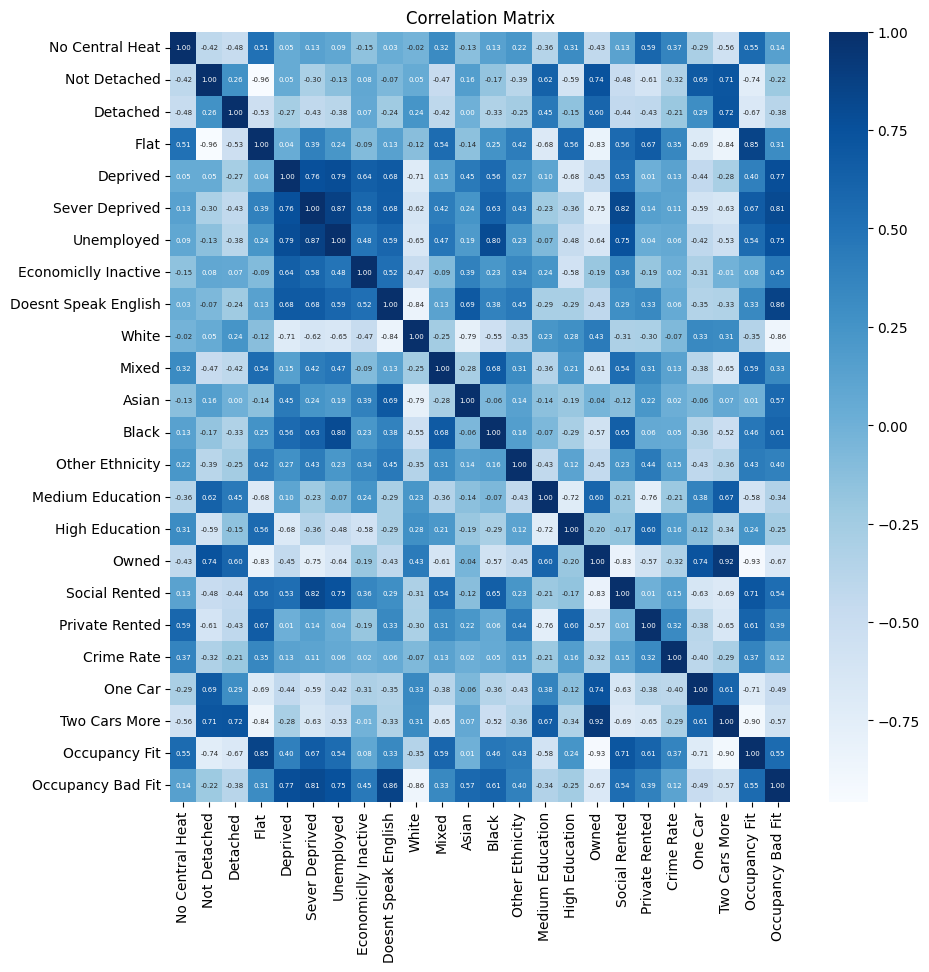

In [107]:
df_2011 = full_incident_rate_2011.drop(columns=["ward code", "IncGeo_WardCode", "CalYear", "IncGeo_WardName",
                                       "ward name", "local authority code",	"local authority name", "fire_rate",
                                       "All households", "false_alarm_rate","false_alarm_count", "fire_count",
            'speak_english','central_heat', 'other_tenure', 'not_deprived', 'economiclly_active', 'low_education',
        #   'other_education', 'good_health', 'no_cars', 'occupancy_good_fit', 'no_care_hours'])
            'other_education', 'no_cars', 'occupancy_good_fit'])
fig, ax = plt.subplots(figsize=(10, 10))
#sns.heatmap(df_2011.drop(columns = ['weekday']).select_dtypes(include=np.number).corr(), annot=True,
df_2011_tmp = df_2011.copy()
df_2011_tmp.columns = [c.replace("_", " ").title() for c in df_2011_tmp.columns]
sns.heatmap(df_2011_tmp.select_dtypes(include=np.number).corr(), annot=True,
        fmt=".2f", cmap='Blues', ax = ax, annot_kws={"size": 5})
plt.title('Correlation Matrix')
plt.savefig(f'2011 correlation.png')

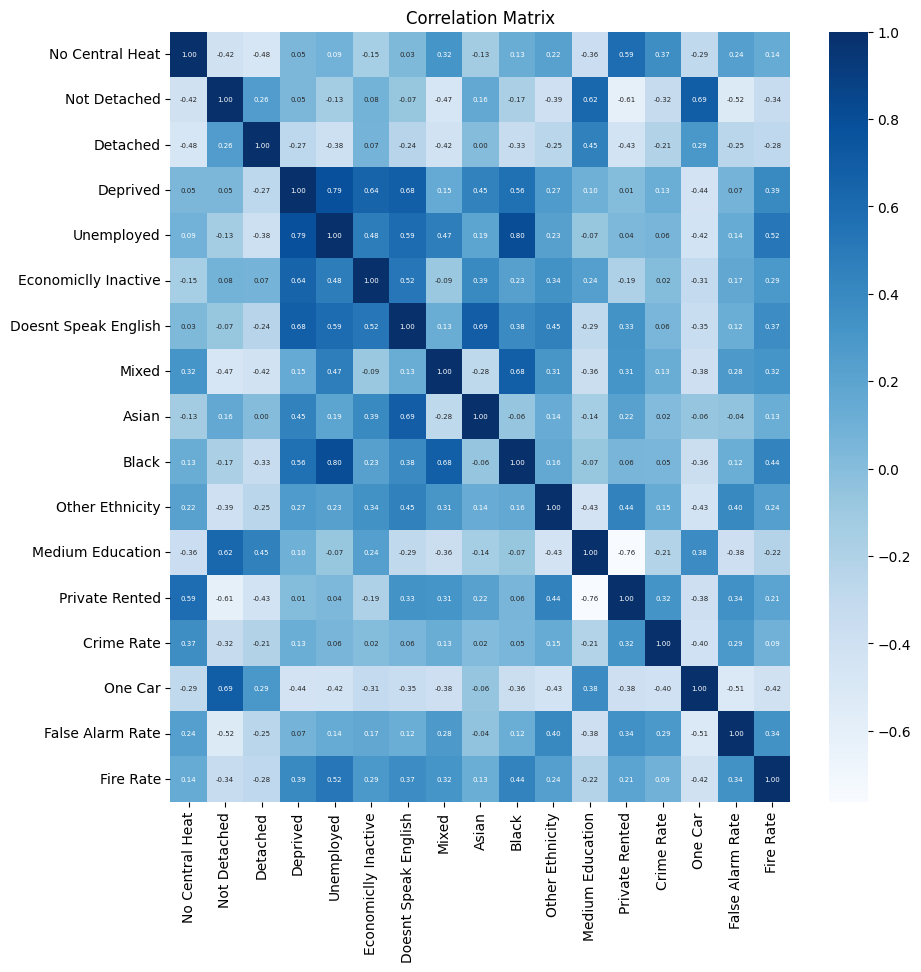

In [109]:
vif_filtered_df_2011_tmp = vif_filtered_df_2011.copy()
fig, ax = plt.subplots(figsize=(10, 10))
#sns.heatmap(df_2011.drop(columns = ['weekday']).select_dtypes(include=np.number).corr(), annot=True,
vif_filtered_df_2011_tmp.columns = [c.replace("_", " ").title() for c in vif_filtered_df_2011_tmp.columns]
sns.heatmap(vif_filtered_df_2011_tmp.select_dtypes(include=np.number).corr(), annot=True,
        fmt=".2f", cmap='Blues', ax = ax, annot_kws={"size": 5})
plt.title('Correlation Matrix')
plt.savefig(f'reduced 2011 correlation.png')

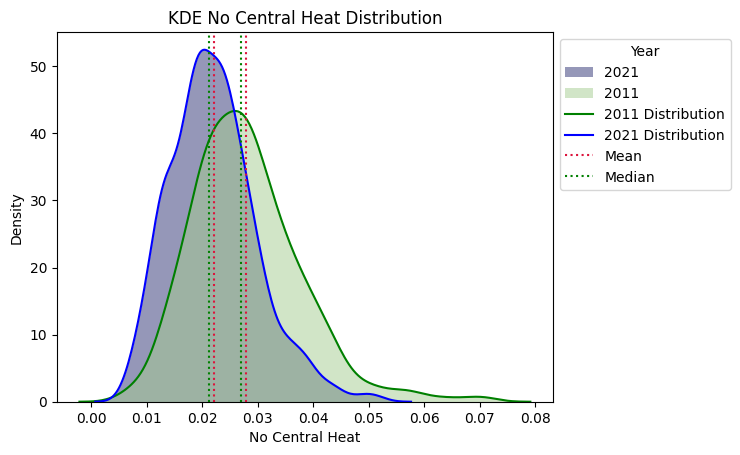

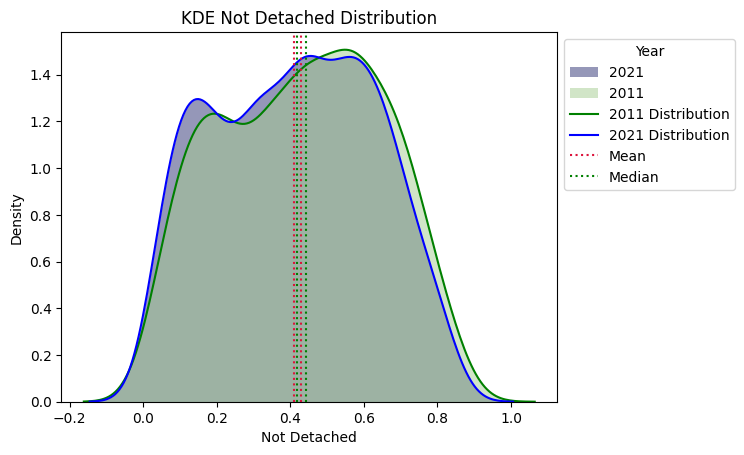

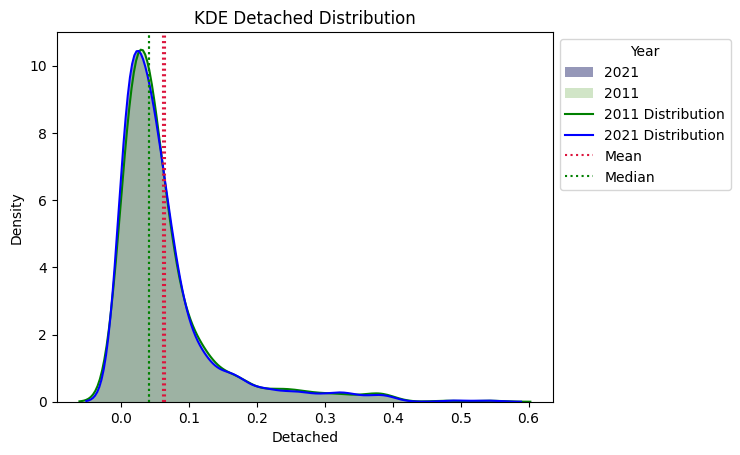

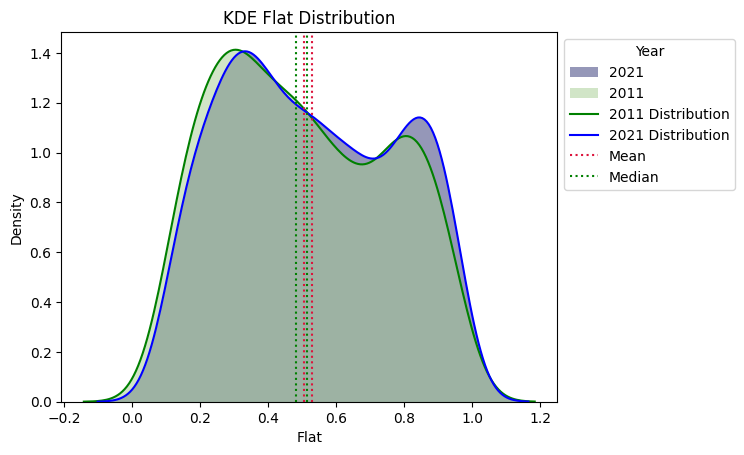

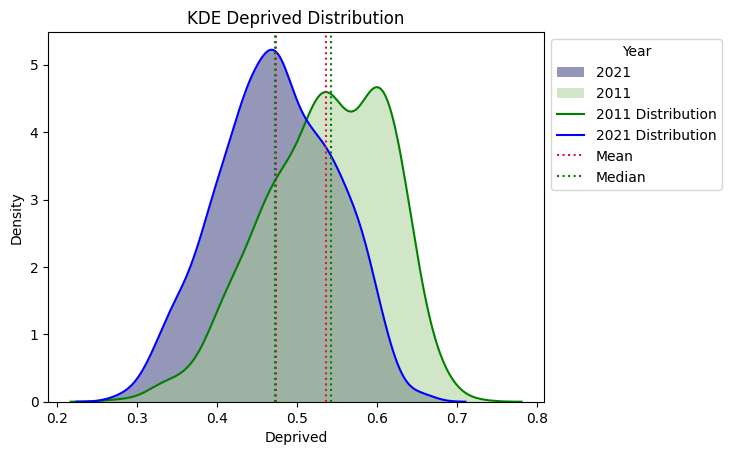

...

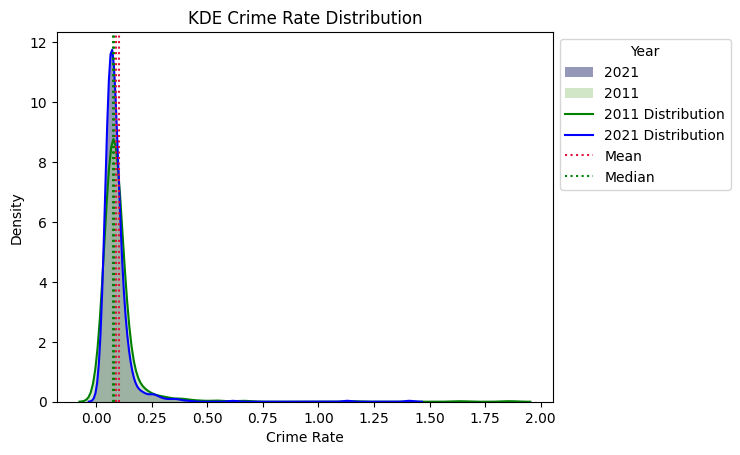

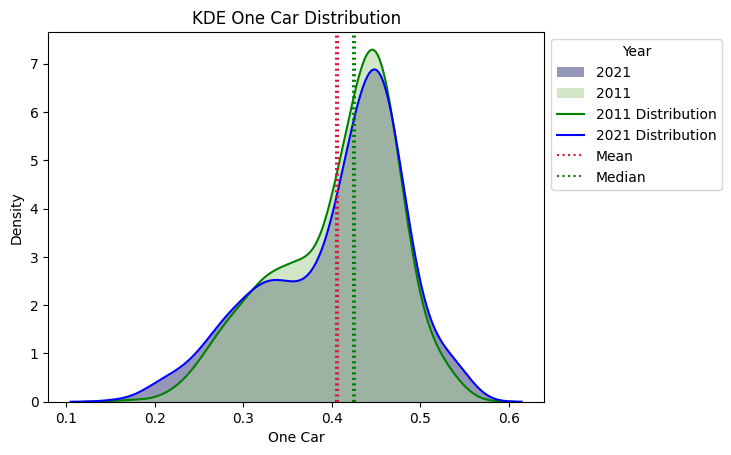

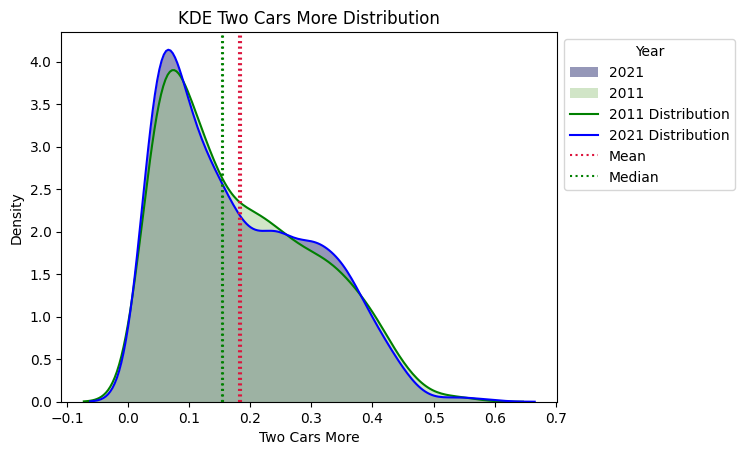

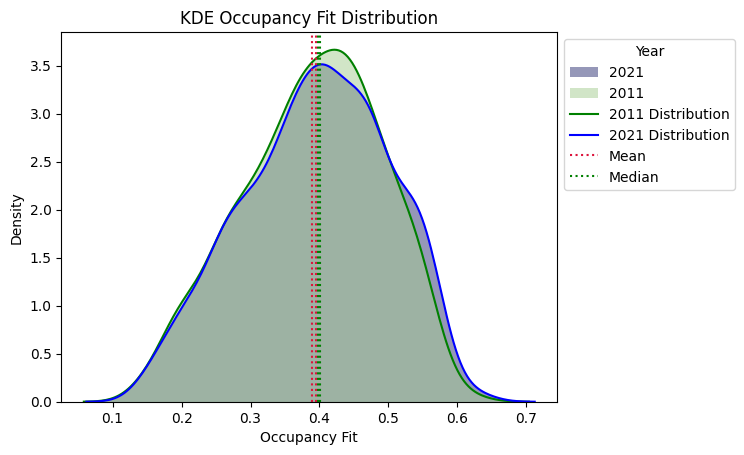

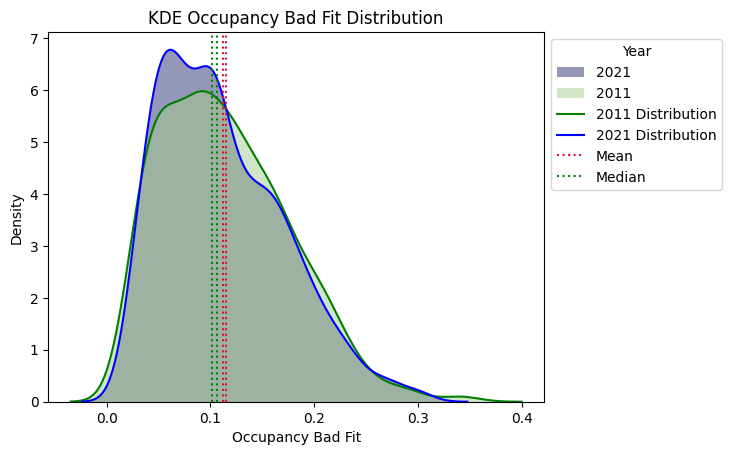

In [117]:
import matplotlib.pyplot as plt

df_2011_tmp = df_2011.copy()
df_2011_tmp.columns = [c.replace("_", " ").title() for c in df_2011_tmp.columns]
df_2011_tmp['year'] = 2011
df_2021_tmp = df_2021.copy()
df_2021_tmp.columns = [c.replace("_", " ").title() for c in df_2021_tmp.columns]
df_2021_tmp['year'] = 2021
df_data_tmp = pd.concat([df_2011_tmp, df_2021_tmp])

#fig, axs = plt.subplots(24, figsize=(100, 20))
for i, col in enumerate(df_data_tmp.columns[:24]):

    sns.kdeplot(data=df_data_tmp, x=col, hue="year",
       fill=True, common_norm=False, palette="crest",
       alpha=.5, linewidth=0, legend='full').set_title(f"KDE {col} Distribution")
    
    ax_2011 = sns.kdeplot(df_2011_tmp[col], fill=False, color='green')
    ax_2021 = sns.kdeplot(df_2021_tmp[col], fill=False, color='blue')
    kdeline_2011 = ax_2011.lines[0]
    kdeline_2021 = ax_2021.lines[0]
    xs_2011 = kdeline_2011.get_xdata()
    ys_2011 = kdeline_2011.get_ydata()
    xs_2021 = kdeline_2021.get_xdata()
    ys_2021 = kdeline_2021.get_ydata()
    
    mean_2011 = df_data_tmp[df_data_tmp['year'] == 2011][col].mean()
    #height_2011 = np.interp(mean_2011, xs_2011, ys_2011)
    mean_2021 = df_data_tmp[df_data_tmp['year'] == 2021][col].mean()
    #height_2021 = np.interp(mean_2021, xs_2021, ys_2021)
    median_2011 = df_data_tmp[df_data_tmp['year'] == 2011][col].median()
    median_2021 = df_data_tmp[df_data_tmp['year'] == 2021][col].median()
    ax_2011.axvline(mean_2011, color='crimson', ls=':')
    ax_2011.axvline(median_2011, color='green', ls=':')
    ###########
    mean_line_2021 = ax_2021.axvline(mean_2021, color='crimson', ls=':')
    meadian_line_2021 = ax_2021.axvline(median_2021, color='green', ls=':')
    #handles, labels = plt.get_legend_handles_labels()
    plt.legend(title='Year', loc = 'upper left', labels=['2021', '2011', '2011 Distribution',
                                          '2021 Distribution', 'Mean', 'Median'], bbox_to_anchor=(1, 1))
    plt.savefig(f'{col} KDE.png', bbox_inches='tight')
    plt.show()
    #plt.show(fig)
    #plt.xlabel(col)
    #plt.ylabel(y)

## Using VIF To Deal With Multicollinearity For The Year 2011

In [102]:
vif_filtered_df_2011, vif_list_2011_df = drop_column_using_vif_(df_2011, thresh=10)
vif_filtered_df_2011["ward code"] = full_incident_rate_2011["ward code"]
vif_filtered_df_2011["ward name"] = full_incident_rate_2011["ward name"]
vif_filtered_df_2011["false_alarm_rate"] = full_incident_rate_2011["false_alarm_rate"]
vif_filtered_df_2011["fire_rate"] = full_incident_rate_2011["fire_rate"]
print("The columns remaining after VIF selection are:")
print(vif_filtered_df_2011.columns)

Max VIF: 2611759.0353662963
Dropping: white
Max VIF: 6495.788824798297
Dropping: flat
Max VIF: 318.43540205246956
Dropping: owned
Max VIF: 36.64094360163755
Dropping: high_education
Max VIF: 24.36071025620698
Dropping: two_cars_more
Max VIF: 20.496247260545935
Dropping: sever_deprived
Max VIF: 17.378857523659942
Dropping: social_rented
Max VIF: 11.044384406178699
Dropping: occupancy_fit
Max VIF: 10.692652743662139
Dropping: occupancy_bad_fit
Max VIF: 6.765340206319397
The columns remaining after VIF selection are:
Index(['no_central_heat', 'not_detached', 'detached', 'deprived', 'unemployed',
       'economiclly_inactive', 'doesnt_speak_english', 'mixed', 'asian',
       'black', 'other_ethnicity', 'medium_education', 'private_rented',
       'crime rate', 'one_car', 'ward code', 'ward name', 'false_alarm_rate',
       'fire_rate'],
      dtype='object')


In [106]:
vif_list_2011_df.sort_values(by = 'VIF', ascending = False)

,VIF
unemployed,6.765340
deprived,6.662160
black,5.109138
doesnt_speak_english,4.999750
private_rented,4.870650
not_detached,4.578109
medium_education,4.057041
one_car,3.742257
asian,3.591894
mixed,3.388824


## Building And Interpreting A Linear Regression Model

In [50]:
fire_rate_model_2011 = sm.OLS(endog=vif_filtered_df_2011[['fire_rate']],
      exog=vif_filtered_df_2011.drop(columns = ["ward code","ward name", "false_alarm_rate", "fire_rate"])).fit()
                              
fire_rate_model_2011.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              fire_rate   R-squared (uncentered):                   0.882
Model:                            OLS   Adj. R-squared (uncentered):              0.879
Method:                 Least Squares   F-statistic:                              330.1
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                   8.91e-296
Time:                        16:08:37   Log-Likelihood:                          3896.8
No. Observations:                 679   AIC:                                     -7764.
Df Residuals:                     664   BIC:                                     -7696.
Df Model:                          15                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
no_central_heat         -0.0017      0.004     -0.372      0.710      -0.010       0.007
not_detached            -0.0014      0.000     -4.866      0.000      -0.002      -0.001
detached                -0.0009      0.001     -1.662      0.097      -0.002       0.000
deprived              -8.71e-06      0.001     -0.010      0.992      -0.002       0.002
unemployed               0.0200      0.005      4.251      0.000       0.011       0.029
economiclly_inactive     0.0039      0.001      3.626      0.000       0.002       0.006
doesnt_speak_english  9.344e-07      0.002      0.000      1.000      -0.005       0.005
mixed                   -0.0016      0.003     -0.508      0.612      -0.008       0.005
asian                    0.0002      0.000      0.607      0.544      -0.000       0.001
black                    0.0010      0.001      1.495      0.135      -0.000       0.002
other_ethnicity         -0.0018      0.002     -0.986      0.324      -0.005       0.002
medium_education         0.0003      0.001      0.239      0.811      -0.002       0.003
private_rented           0.0008      0.001      1.289      0.198      -0.000       0.002
crime rate              -0.0003      0.000     -0.903      0.367      -0.001       0.000
one_car                  0.0009      0.001      1.405      0.160      -0.000       0.002
==============================================================================
Omnibus:                       26.874   Durbin-Watson:                   1.874
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               29.554
Skew:                           0.462   Prob(JB):                     3.82e-07
Kurtosis:                       3.436   Cond. No.                         153.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [51]:
alphas = [abs(c) for c in np.random.normal(0.000001, 0.00001, (100)).tolist()]
# Fit Lasso model
for alpha in alphas:
    fire_rate_model_2011_lasso = Lasso(alpha=alpha, fit_intercept = False)  # Set your regularization parameter
    fire_rate_model_2011_lasso.fit(vif_filtered_df_2011.drop(columns = ["ward code","ward name","false_alarm_rate",
                                           "fire_rate"]), vif_filtered_df_2011[['fire_rate']])
    
    #fire_rate_model_2011_lasso = sm.OLS(endog=vif_filtered_df_2011[['fire_rate']],
    #          exog=vif_filtered_df_2011.drop(columns = ["ward code","ward name","false_alarm_rate",
    #        "fire_rate"])).fit_regularized(method='elastic_net', alpha=0.0, L1_wt=1.0)
                                  
    #0.000005
    y_train_pred = fire_rate_model_2011_lasso.predict(vif_filtered_df_2011.drop(columns = ["ward code",
                                                  "ward name", "false_alarm_rate", "fire_rate"]))
    # Residual sum of squares (RSS)
    rss = np.sum((vif_filtered_df_2011['fire_rate'] - pd.DataFrame(y_train_pred,
                                                       columns = ['y_train_pred'])['y_train_pred']) ** 2)
    # Total sum of squares (TSS)
    tss = np.sum((vif_filtered_df_2011['fire_rate'] - np.mean(vif_filtered_df_2011['fire_rate'])) ** 2)
    # R-squared
    r_squared = 1 - (rss / tss)
    print(f"R-squared is {r_squared} for alpha {alpha}")
    non_zero_coef = len([c for c in fire_rate_model_2011_lasso.coef_.tolist()if c != 0])
    print(f"number of Coef is {non_zero_coef} out of {len(fire_rate_model_2011_lasso.coef_)}")

R-squared is 0.3040862238599604 for alpha 6.883212420002826e-06
number of Coef is 5 out of 15
R-squared is 0.33191576904321807 for alpha 2.3500836321531136e-06
number of Coef is 9 out of 15
R-squared is 0.3367682679309407 for alpha 1.3240107909544593e-06
number of Coef is 9 out of 15
R-squared is 0.30065420966603296 for alpha 7.963234136442923e-06
number of Coef is 4 out of 15
R-squared is 0.2706686142167888 for alpha 1.810955299387637e-05
number of Coef is 3 out of 15
R-squared is 0.32541673867096554 for alpha 3.250894185586455e-06
number of Coef is 9 out of 15
R-squared is 0.3316966217897275 for alpha 2.3859852169866988e-06
number of Coef is 9 out of 15
R-squared is 0.3206611219569466 for alpha 3.847852021228918e-06
number of Coef is 8 out of 15
R-squared is 0.30506371934503584 for alpha 6.711530466168389e-06
number of Coef is 5 out of 15
R-squared is 0.31998523904043485 for alpha 3.938852276570358e-06
number of Coef is 8 out of 15
R-squared is 0.29906593364580136 for alpha 8.7356072

In [52]:
alpha = 2 * 10 ** -6
fire_rate_model_2011_lasso = Lasso(alpha=alpha, fit_intercept = False)  # Set your regularization parameter
fire_rate_model_2011_lasso.fit(vif_filtered_df_2011.drop(columns = ["ward code","ward name","false_alarm_rate",
                                       "fire_rate"]), vif_filtered_df_2011[['fire_rate']])
                     
#0.000005
y_train_pred = fire_rate_model_2011_lasso.predict(vif_filtered_df_2011.drop(columns = ["ward code",
                                              "ward name", "false_alarm_rate", "fire_rate"]))
# Residual sum of squares (RSS)
rss = np.sum((vif_filtered_df_2011['fire_rate'] - pd.DataFrame(y_train_pred,
                                                   columns = ['y_train_pred'])['y_train_pred']) ** 2)
# Total sum of squares (TSS)
tss = np.sum((vif_filtered_df_2011['fire_rate'] - np.mean(vif_filtered_df_2011['fire_rate'])) ** 2)
# R-squared
r_squared = 1 - (rss / tss)
print(f"R-squared is {r_squared} for alpha {alpha}")
non_zero_coef = len([c for c in fire_rate_model_2011_lasso.coef_.tolist()if c != 0])
print(f"number of Coef is {non_zero_coef} out of {len(fire_rate_model_2011_lasso.coef_)}")
coef = pd.DataFrame(fire_rate_model_2011_lasso.coef_, index = vif_filtered_df_2011.drop(columns = ["ward code",
                                              "ward name", "false_alarm_rate", "fire_rate"]).columns)

features = coef[coef[0] != 0].index.tolist()

fire_rate_model_2011_final = sm.OLS(endog=vif_filtered_df_2011[['fire_rate']],
                                    exog=vif_filtered_df_2011[features]).fit()
fire_rate_model_2011_final.summary()

R-squared is 0.33387214873890037 for alpha 2e-06
number of Coef is 9 out of 15


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              fire_rate   R-squared (uncentered):                   0.878
Model:                            OLS   Adj. R-squared (uncentered):              0.876
Method:                 Least Squares   F-statistic:                              534.6
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                   6.15e-299
Time:                        16:08:43   Log-Likelihood:                          3885.6
No. Observations:                 679   AIC:                                     -7753.
Df Residuals:                     670   BIC:                                     -7712.
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
not_detached            -0.0016      0.000     -6.182      0.000      -0.002      -0.001
detached                -0.0015      0.000     -2.994      0.003      -0.002      -0.001
deprived                 0.0017      0.001      2.616      0.009       0.000       0.003
economiclly_inactive     0.0040      0.001      4.229      0.000       0.002       0.006
asian                    0.0005      0.000      1.984      0.048    5.28e-06       0.001
black                    0.0026      0.000      6.068      0.000       0.002       0.003
private_rented          -0.0001      0.000     -0.306      0.759      -0.001       0.001
crime rate              -0.0004      0.000     -1.283      0.200      -0.001       0.000
one_car                  0.0011      0.001      2.073      0.039    5.97e-05       0.002
==============================================================================
Omnibus:                       34.699   Durbin-Watson:                   1.844
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               39.173
Skew:                           0.541   Prob(JB):                     3.12e-09
Kurtosis:                       3.462   Cond. No.                         33.9
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [53]:
#fire_rate_model_2011_final = sm.OLS(endog=vif_filtered_df_2011[['fire_rate']],
#          exog=vif_filtered_df_2011.drop(columns = ["ward code","ward name","false_alarm_rate",
#            "fire_rate","no_central_heat","doesnt_speak_english", "mixed", "private_rented", "medium_education",
#            "asian", "other_ethnicity", "bad_health", "few_care_hours", "black", "detached", "crime rate"])).fit()
fire_rate_model_2011_final = sm.OLS(endog=vif_filtered_df_2011[['fire_rate']],
          exog=vif_filtered_df_2011[['not_detached', 'detached', 'deprived', 'economiclly_inactive',
                                    'asian', 'black','one_car']]).fit()
fire_rate_model_2011_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              fire_rate   R-squared (uncentered):                   0.877
Model:                            OLS   Adj. R-squared (uncentered):              0.876
Method:                 Least Squares   F-statistic:                              687.0
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                   2.45e-301
Time:                        16:08:47   Log-Likelihood:                          3884.6
No. Observations:                 679   AIC:                                     -7755.
Df Residuals:                     672   BIC:                                     -7723.
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
not_detached            -0.0015      0.000     -8.399      0.000      -0.002      -0.001
detached                -0.0014      0.000     -2.953      0.003      -0.002      -0.000
deprived                 0.0014      0.001      2.339      0.020       0.000       0.003
economiclly_inactive     0.0041      0.001      4.429      0.000       0.002       0.006
asian                    0.0005      0.000      2.152      0.032    4.37e-05       0.001
black                    0.0027      0.000      6.489      0.000       0.002       0.004
one_car                  0.0011      0.000      2.535      0.011       0.000       0.002
==============================================================================
Omnibus:                       35.247   Durbin-Watson:                   1.839
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               40.075
Skew:                           0.541   Prob(JB):                     1.99e-09
Kurtosis:                       3.495   Cond. No.                         31.6
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

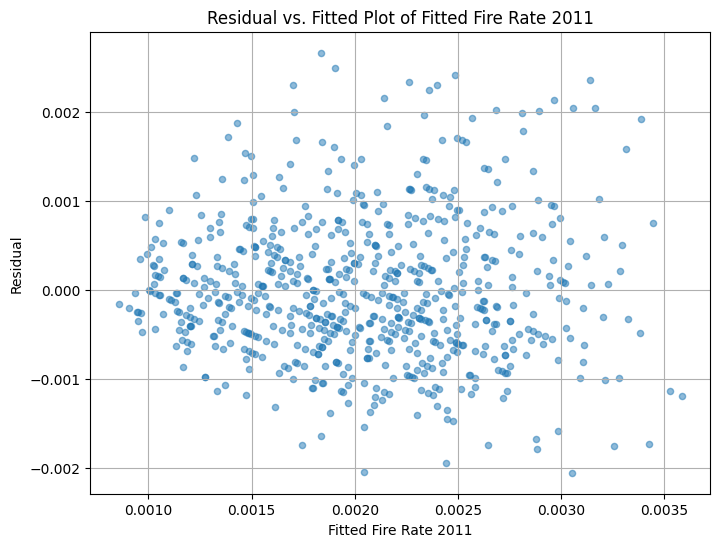

In [54]:
# Residuals vs. Fitted plot

# Set the figure size
plt.figure(figsize=(8, 6))  
# alpha = 0.5: controlling the transparency of the markers. Here alpha = 0.5 means that the markers are semi-transparent.
# s = 20: controlling the size of the markers. The default value is plt.rcParams['lines.markersize'] ** 2. Here we set it as 20.
# To get the default value of marker size, run the following line
# print(plt.rcParams['lines.markersize'] ** 2) 
plt.scatter(fire_rate_model_2011_final.fittedvalues, fire_rate_model_2011_final.resid, alpha = 0.5, s=20)
# adding title and labels
plt.xlabel('Fitted Fire Rate 2011')
plt.ylabel('Residual')
plt.title('Residual vs. Fitted Plot of Fitted Fire Rate 2011')
# Adding grid lines
plt.grid(True)
plt.show()

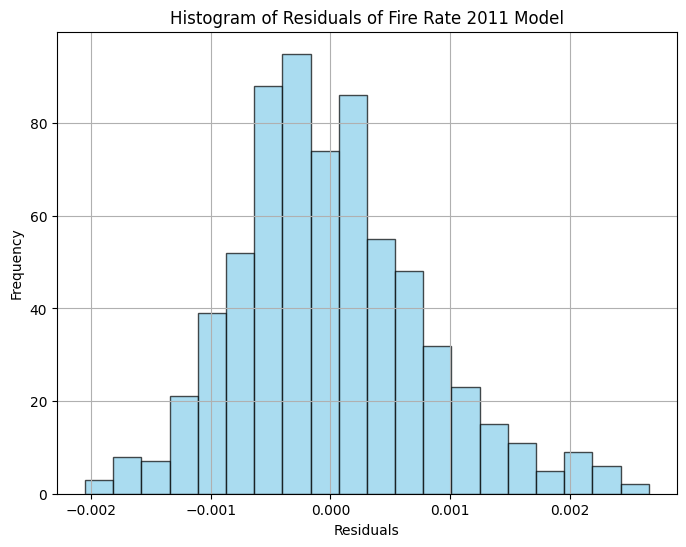

In [55]:
# Histogram of residuals

# Set the figure size
plt.figure(figsize=(8, 6))  

# Plotting the histogram
plt.hist(fire_rate_model_2011_final.resid, bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Adding labels and title
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals of Fire Rate 2011 Model')

# Adding grid lines (optional)
plt.grid(True)

# Display the plot
plt.show()

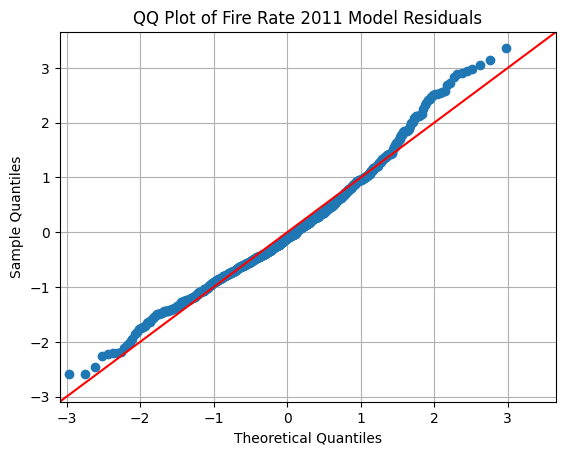

In [56]:
# (optional) the QQ plot of residuals
# More details: https://www.statsmodels.org/dev/generated/statsmodels.graphics.gofplots.qqplot.html
fig = sm.qqplot(fire_rate_model_2011_final.resid, fit=True, line="45")
plt.title('QQ Plot of Fire Rate 2011 Model Residuals')

# Adding grid lines (optional)
plt.grid(True)

# Display the plot
plt.show()

In [57]:
test_rainbow = sm.stats.diagnostic.linear_rainbow(fire_rate_model_2011_final)
# This function returns a tuple consisting of two values: the test statistic based on the F test and the pvalue of the test
# Note that these two values are not named. Therefore, you need to know the order before accessing these two values.
print("The p value of the rainbow test: {:.4f}".format(test_rainbow[1]))

The p value of the rainbow test: 0.2266


In [58]:
test_dw = sm.stats.stattools.durbin_watson(fire_rate_model_2011_final.resid)
print("Durbin-Watson test statistic is: {:.4f}".format(test_dw))

Durbin-Watson test statistic is: 1.8392


In [59]:
test_Ljung_Box = sm.stats.diagnostic.acorr_ljungbox(fire_rate_model_2011_final.resid)
# print the result
print(test_Ljung_Box)
print("The maximum p value of the Ljung Box test: {:.4f}".format(test_Ljung_Box.lb_pvalue.max()))
print("The minimum p value of the Ljung Box test: {:.4f}".format(test_Ljung_Box.lb_pvalue.min()))

      lb_stat  lb_pvalue
1    4.181008   0.040879
2    4.213985   0.121603
3    5.998052   0.111705
4    6.356773   0.174042
5    8.364210   0.137273
6    9.669233   0.139290
7   10.147730   0.180355
8   11.847126   0.158156
9   11.852484   0.221754
10  15.855601   0.103841
The maximum p value of the Ljung Box test: 0.2218
The minimum p value of the Ljung Box test: 0.0409


In [60]:
test_JB = sm.stats.stattools.jarque_bera(fire_rate_model_2011_final.resid)
print("The p value of the Jarque Bera test: {:.4f}".format(test_JB[1]))

The p value of the Jarque Bera test: 0.0000


In [61]:
sm.stats.diagnostic.het_goldfeldquandt(fire_rate_model_2011_final.model.endog, fire_rate_model_2011_final.model.exog)

(1.1148356255373872, 0.16103682365374142, 'increasing')

# 2011 False Alarm Model

In [62]:
false_alarm_rate_model_2011 = sm.OLS(endog=vif_filtered_df_2011[['false_alarm_rate']],
                             exog=vif_filtered_df_2011.drop(columns = ["ward code","ward name","false_alarm_rate",
                               "fire_rate"])).fit()
false_alarm_rate_model_2011.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:       false_alarm_rate   R-squared (uncentered):                   0.802
Model:                            OLS   Adj. R-squared (uncentered):              0.797
Method:                 Least Squares   F-statistic:                              179.3
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                   1.10e-221
Time:                        16:09:00   Log-Likelihood:                          2887.7
No. Observations:                 679   AIC:                                     -5745.
Df Residuals:                     664   BIC:                                     -5678.
Df Model:                          15                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
no_central_heat         -0.0216      0.020     -1.097      0.273      -0.060       0.017
not_detached            -0.0050      0.001     -3.881      0.000      -0.008      -0.002
detached                -0.0059      0.003     -2.340      0.020      -0.011      -0.001
deprived                 0.0010      0.004      0.258      0.796      -0.006       0.008
unemployed              -0.0142      0.021     -0.684      0.494      -0.055       0.027
economiclly_inactive     0.0367      0.005      7.800      0.000       0.027       0.046
doesnt_speak_english    -0.0269      0.010     -2.650      0.008      -0.047      -0.007
mixed                    0.0395      0.014      2.778      0.006       0.012       0.067
asian                   -0.0014      0.002     -0.887      0.375      -0.005       0.002
black                   -0.0036      0.003     -1.215      0.225      -0.009       0.002
other_ethnicity          0.0170      0.008      2.170      0.030       0.002       0.032
medium_education        -0.0081      0.005     -1.482      0.139      -0.019       0.003
private_rented           0.0057      0.003      2.077      0.038       0.000       0.011
crime rate               0.0040      0.001      3.052      0.002       0.001       0.007
one_car                 -0.0032      0.003     -1.126      0.261      -0.009       0.002
==============================================================================
Omnibus:                      275.240   Durbin-Watson:                   1.778
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1441.020
Skew:                           1.763   Prob(JB):                         0.00
Kurtosis:                       9.205   Cond. No.                         153.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [63]:
alphas = [abs(c) for c in np.random.normal(0.000001, 0.00001, (100)).tolist()]
# Fit Lasso model
for alpha in alphas:
    false_alarm_rt_model_2011_lasso = Lasso(alpha=alpha, fit_intercept = False)
    false_alarm_rt_model_2011_lasso.fit(vif_filtered_df_2011.drop(columns = ["ward code","ward name",
                                  "false_alarm_rate", "fire_rate"]), vif_filtered_df_2011[['false_alarm_rate']])
    
    y_train_pred = false_alarm_rt_model_2011_lasso.predict(vif_filtered_df_2011.drop(columns = ["ward code",
                                                  "ward name", "false_alarm_rate", "fire_rate"]))
    # Residual sum of squares (RSS)
    rss = np.sum((vif_filtered_df_2011['false_alarm_rate'] - pd.DataFrame(y_train_pred,
                                                       columns = ['y_train_pred'])['y_train_pred']) ** 2)
    # Total sum of squares (TSS)
    tss = np.sum((vif_filtered_df_2011['false_alarm_rate']-np.mean(vif_filtered_df_2011['false_alarm_rate'])) ** 2)
    # R-squared
    r_squared = 1 - (rss / tss)
    print(f"R-squared is {r_squared} for alpha {alpha}")
    non_zero_coef = len([c for c in false_alarm_rt_model_2011_lasso.coef_.tolist()if c != 0])
    print(f"number of Coef is {non_zero_coef} out of {len(false_alarm_rt_model_2011_lasso.coef_)}")

R-squared is 0.3523237025972721 for alpha 8.169025593955875e-06
number of Coef is 8 out of 15
R-squared is 0.3783719928601903 for alpha 6.38739303670033e-07
number of Coef is 15 out of 15
R-squared is 0.34643175729402387 for alpha 1.0819576498068407e-05
number of Coef is 7 out of 15
R-squared is 0.3769465927502451 for alpha 1.048896040157843e-06
number of Coef is 13 out of 15
R-squared is 0.37504639161363507 for alpha 1.668946760044846e-06
number of Coef is 12 out of 15
R-squared is 0.34672914512063535 for alpha 1.0591187951288936e-05
number of Coef is 7 out of 15
R-squared is 0.3485057918840232 for alpha 9.832275340462754e-06
number of Coef is 8 out of 15
R-squared is 0.34494391620149767 for alpha 1.2154739498954826e-05
number of Coef is 6 out of 15
R-squared is 0.3536343453419465 for alpha 7.513581395255738e-06
number of Coef is 8 out of 15
R-squared is 0.355553890042855 for alpha 6.434193663286235e-06
number of Coef is 8 out of 15
R-squared is 0.3553804040308858 for alpha 6.53918491

In [64]:
alpha = 4 * 10 ** -6
false_alarm_rt_model_2011_lasso = Lasso(alpha=alpha, fit_intercept = False)  # Set your regularization parameter
false_alarm_rt_model_2011_lasso.fit(vif_filtered_df_2011.drop(columns = ["ward code","ward name",
                           "false_alarm_rate","fire_rate"]), vif_filtered_df_2011[['false_alarm_rate']])
                     
#0.000005
y_train_pred = false_alarm_rt_model_2011_lasso.predict(vif_filtered_df_2011.drop(columns = ["ward code",
                                              "ward name", "false_alarm_rate", "fire_rate"]))
# Residual sum of squares (RSS)
rss = np.sum((vif_filtered_df_2011['false_alarm_rate'] - pd.DataFrame(y_train_pred,
                                                   columns = ['y_train_pred'])['y_train_pred']) ** 2)
# Total sum of squares (TSS)
tss = np.sum((vif_filtered_df_2011['false_alarm_rate'] - np.mean(vif_filtered_df_2011['false_alarm_rate'])) ** 2)
# R-squared
r_squared = 1 - (rss / tss)
print(f"R-squared is {r_squared} for alpha {alpha}")
non_zero_coef = len([c for c in false_alarm_rt_model_2011_lasso.coef_.tolist()if c != 0])
print(f"number of Coef is {non_zero_coef} out of {len(false_alarm_rt_model_2011_lasso.coef_)}")
coef = pd.DataFrame(false_alarm_rt_model_2011_lasso.coef_, index = vif_filtered_df_2011.drop(columns = [
                                              "ward code", "ward name", "false_alarm_rate", "fire_rate"]).columns)

features = coef[coef[0] != 0].index.tolist()

false_alarm_rt_model_2011_final = sm.OLS(endog=vif_filtered_df_2011[['false_alarm_rate']],
                                    exog=vif_filtered_df_2011[features]).fit()
false_alarm_rt_model_2011_final.summary()

R-squared is 0.3619795206833749 for alpha 4e-06
number of Coef is 11 out of 15


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:       false_alarm_rate   R-squared (uncentered):                   0.801
Model:                            OLS   Adj. R-squared (uncentered):              0.798
Method:                 Least Squares   F-statistic:                              244.5
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                   1.05e-225
Time:                        16:09:02   Log-Likelihood:                          2886.1
No. Observations:                 679   AIC:                                     -5750.
Df Residuals:                     668   BIC:                                     -5700.
Df Model:                          11                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
not_detached            -0.0058      0.001     -6.199      0.000      -0.008      -0.004
detached                -0.0051      0.002     -2.308      0.021      -0.009      -0.001
economiclly_inactive     0.0348      0.004      8.904      0.000       0.027       0.042
doesnt_speak_english    -0.0263      0.010     -2.734      0.006      -0.045      -0.007
mixed                    0.0324      0.013      2.457      0.014       0.007       0.058
asian                   -0.0009      0.002     -0.616      0.538      -0.004       0.002
black                   -0.0038      0.002     -1.654      0.099      -0.008       0.001
other_ethnicity          0.0198      0.008      2.598      0.010       0.005       0.035
medium_education        -0.0100      0.004     -2.235      0.026      -0.019      -0.001
private_rented           0.0031      0.002      1.741      0.082      -0.000       0.007
crime rate               0.0041      0.001      3.373      0.001       0.002       0.007
==============================================================================
Omnibus:                      278.621   Durbin-Watson:                   1.782
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1449.744
Skew:                           1.792   Prob(JB):                         0.00
Kurtosis:                       9.197   Cond. No.                         70.6
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [65]:
false_alarm_rt_model_2011_final = sm.OLS(endog=vif_filtered_df_2011[['false_alarm_rate']],
                                    exog=vif_filtered_df_2011[['not_detached', 'detached', 'economiclly_inactive',
 'doesnt_speak_english', 'mixed', 'other_ethnicity', 'medium_education', 'private_rented',
                                   'crime rate']]).fit()
false_alarm_rt_model_2011_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:       false_alarm_rate   R-squared (uncentered):                   0.800
Model:                            OLS   Adj. R-squared (uncentered):              0.798
Method:                 Least Squares   F-statistic:                              298.1
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                   1.42e-227
Time:                        16:09:02   Log-Likelihood:                          2884.7
No. Observations:                 679   AIC:                                     -5751.
Df Residuals:                     670   BIC:                                     -5711.
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
not_detached            -0.0058      0.001     -6.350      0.000      -0.008      -0.004
detached                -0.0046      0.002     -2.138      0.033      -0.009      -0.000
economiclly_inactive     0.0346      0.004      9.037      0.000       0.027       0.042
doesnt_speak_english    -0.0356      0.007     -5.429      0.000      -0.048      -0.023
mixed                    0.0196      0.009      2.108      0.035       0.001       0.038
other_ethnicity          0.0233      0.007      3.237      0.001       0.009       0.037
medium_education        -0.0101      0.004     -2.277      0.023      -0.019      -0.001
private_rented           0.0040      0.002      2.631      0.009       0.001       0.007
crime rate               0.0041      0.001      3.316      0.001       0.002       0.006
==============================================================================
Omnibus:                      276.173   Durbin-Watson:                   1.779
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1415.215
Skew:                           1.779   Prob(JB):                    4.90e-308
Kurtosis:                       9.112   Cond. No.                         47.0
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

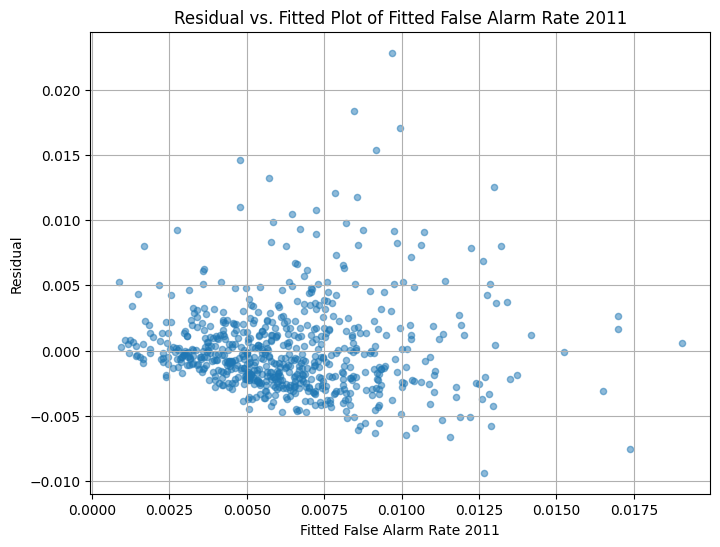

In [119]:
# Residuals vs. Fitted plot

# Set the figure size
plt.figure(figsize=(8, 6))  
# alpha = 0.5: controlling the transparency of the markers. Here alpha = 0.5 means that the markers are semi-transparent.
# s = 20: controlling the size of the markers. The default value is plt.rcParams['lines.markersize'] ** 2. Here we set it as 20.
# To get the default value of marker size, run the following line
# print(plt.rcParams['lines.markersize'] ** 2) 
plt.scatter(false_alarm_rt_model_2011_final.fittedvalues, false_alarm_rt_model_2011_final.resid, alpha = 0.5, s=20)
# adding title and labels
plt.xlabel('Fitted False Alarm Rate 2011')
plt.ylabel('Residual')
plt.title('Residual vs. Fitted Plot of Fitted False Alarm Rate 2011')
# Adding grid lines
plt.grid(True)
plt.show()

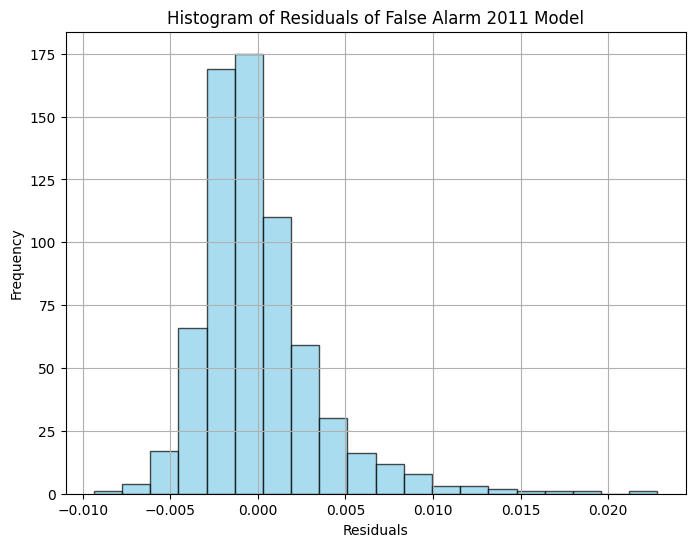

In [120]:
# Histogram of residuals

# Set the figure size
plt.figure(figsize=(8, 6))  

# Plotting the histogram
plt.hist(false_alarm_rt_model_2011_final.resid, bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Adding labels and title
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals of False Alarm 2011 Model')

# Adding grid lines (optional)
plt.grid(True)

# Display the plot
plt.show()

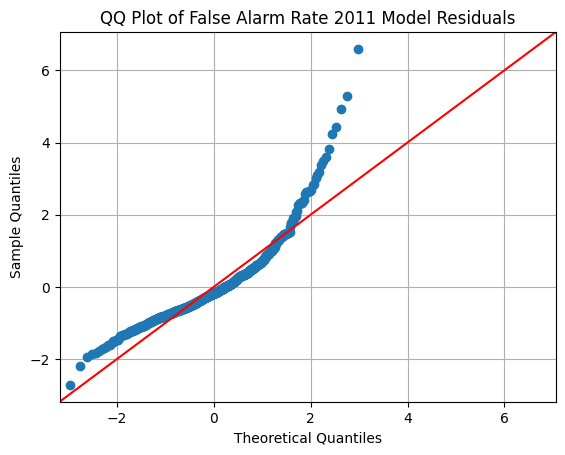

In [121]:
# (optional) the QQ plot of residuals
# More details: https://www.statsmodels.org/dev/generated/statsmodels.graphics.gofplots.qqplot.html
fig = sm.qqplot(false_alarm_rt_model_2011_final.resid, fit=True, line="45")
plt.title('QQ Plot of False Alarm Rate 2011 Model Residuals')

# Adding grid lines (optional)
plt.grid(True)

# Display the plot
plt.show()

In [69]:
test_rainbow = sm.stats.diagnostic.linear_rainbow(false_alarm_rt_model_2011_final)
# This function returns a tuple consisting of two values: the test statistic based on the F test and the pvalue of the test
# Note that these two values are not named. Therefore, you need to know the order before accessing these two values.
print("The p value of the rainbow test: {:.4f}".format(test_rainbow[1]))

The p value of the rainbow test: 1.0000


In [70]:
test_dw = sm.stats.stattools.durbin_watson(false_alarm_rt_model_2011_final.resid)
print("Durbin-Watson test statistic is: {:.4f}".format(test_dw))

Durbin-Watson test statistic is: 1.7793


In [71]:
test_Ljung_Box = sm.stats.diagnostic.acorr_ljungbox(false_alarm_rt_model_2011_final.resid)
# print the result
print(test_Ljung_Box)
print("The maximum p value of the Ljung Box test: {:.4f}".format(test_Ljung_Box.lb_pvalue.max()))
print("The minimum p value of the Ljung Box test: {:.4f}".format(test_Ljung_Box.lb_pvalue.min()))

      lb_stat  lb_pvalue
1    8.150606   0.004305
2   16.025236   0.000331
3   18.170436   0.000406
4   20.120981   0.000473
5   35.832112   0.000001
6   35.832362   0.000003
7   35.900304   0.000008
8   35.902914   0.000018
9   43.491839   0.000002
10  45.994598   0.000001
The maximum p value of the Ljung Box test: 0.0043
The minimum p value of the Ljung Box test: 0.0000


In [72]:
test_JB = sm.stats.stattools.jarque_bera(false_alarm_rt_model_2011_final.resid)
print("The p value of the Jarque Bera test: {:.4f}".format(test_JB[1]))

The p value of the Jarque Bera test: 0.0000


In [73]:
sm.stats.diagnostic.het_goldfeldquandt(false_alarm_rt_model_2011_final.model.endog, false_alarm_rt_model_2011_final.model.exog)

(1.0282931994844668, 0.3999523443377046, 'increasing')

## Checking The Correlation Between Variables For The Year 2021

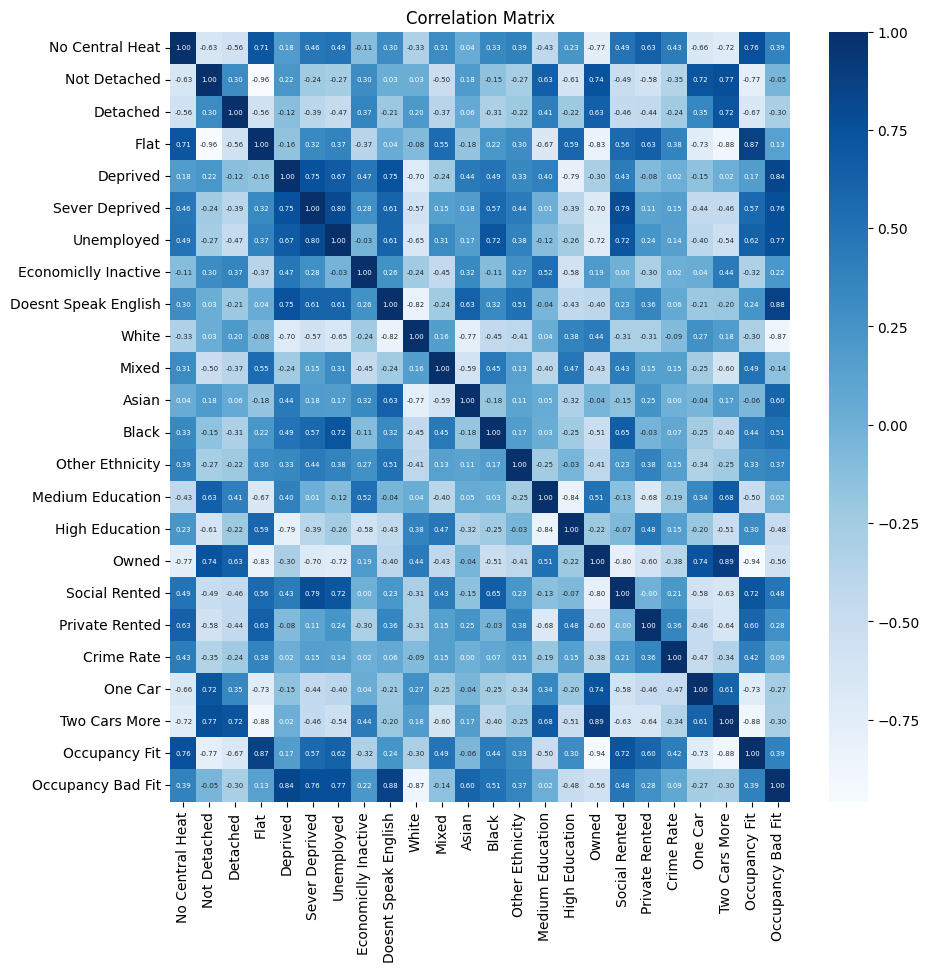

In [110]:
df_2021 = full_incident_rate_2021.drop(columns=["ward code", "IncGeo_WardCode", "CalYear", "IncGeo_WardName",
                                       "ward name", "local authority code",	"local authority name", "fire_rate",
                                       "All households", "false_alarm_rate","false_alarm_count", "fire_count",
            'speak_english','central_heat', 'other_tenure', 'not_deprived', 'economiclly_active', 'low_education',
#           'other_education', 'good_health', 'no_cars', 'occupancy_good_fit', 'no_care_hours'])
           'other_education', 'no_cars', 'occupancy_good_fit'])
fig, ax = plt.subplots(figsize=(10, 10))
df_2021_tmp = df_2021.copy()
df_2021_tmp.columns = [c.replace("_", " ").title() for c in df_2021_tmp.columns]
sns.heatmap(df_2021_tmp.drop(columns = ['Lockdown']).select_dtypes(include=np.number).corr(), annot=True,
    fmt=".2f", cmap='Blues', ax = ax, annot_kws={"size": 5})
plt.title('Correlation Matrix')
plt.savefig(f'2021 correlation.png')

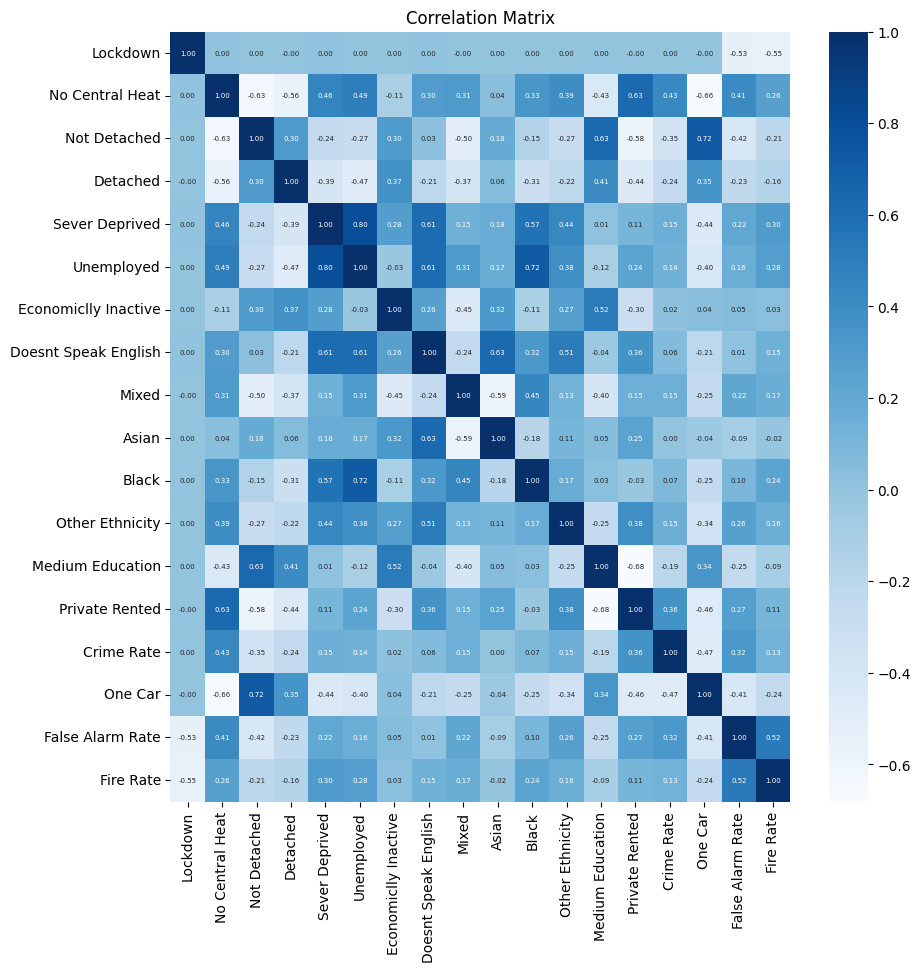

In [111]:
vif_filtered_df_2021_tmp = vif_filtered_df_2021.copy()
fig, ax = plt.subplots(figsize=(10, 10))
#sns.heatmap(df_2021.drop(columns = ['weekday']).select_dtypes(include=np.number).corr(), annot=True,
vif_filtered_df_2021_tmp.columns = [c.replace("_", " ").title() for c in vif_filtered_df_2021_tmp.columns]
sns.heatmap(vif_filtered_df_2021_tmp.select_dtypes(include=np.number).corr(), annot=True,
        fmt=".2f", cmap='Blues', ax = ax, annot_kws={"size": 5})
plt.title('Correlation Matrix')
plt.savefig(f'reduced 2021 correlation.png')

## Using VIF To Deal With Multicollinearity For The Year 2021

In [112]:
vif_filtered_df_2021, vif_2021_df_tmp = drop_column_using_vif_(df_2021, thresh=10)
vif_filtered_df_2021["ward code"] = full_incident_rate_2021["ward code"]
vif_filtered_df_2021["ward name"] = full_incident_rate_2021["ward name"]
vif_filtered_df_2021["false_alarm_rate"] = full_incident_rate_2021["false_alarm_rate"]
vif_filtered_df_2021["fire_rate"] = full_incident_rate_2021["fire_rate"]
print("The columns remaining after VIF selection are:")
print(vif_filtered_df_2021.columns)

Max VIF: 8469.714079723724
Dropping: flat
Max VIF: 5544.647011463982
Dropping: white
Max VIF: 455.6383867976736
Dropping: owned
Max VIF: 44.337143330737995
Dropping: high_education
Max VIF: 23.13275107282124
Dropping: two_cars_more
Max VIF: 21.64860605505963
Dropping: occupancy_bad_fit
Max VIF: 17.75371133612103
Dropping: social_rented
Max VIF: 13.643657352672392
Dropping: occupancy_fit
Max VIF: 10.853733333970595
Dropping: deprived
Max VIF: 6.0322386793925045
The columns remaining after VIF selection are:
Index(['lockdown', 'no_central_heat', 'not_detached', 'detached',
       'sever_deprived', 'unemployed', 'economiclly_inactive',
       'doesnt_speak_english', 'mixed', 'asian', 'black', 'other_ethnicity',
       'medium_education', 'private_rented', 'crime rate', 'one_car',
       'ward code', 'ward name', 'false_alarm_rate', 'fire_rate'],
      dtype='object')


In [114]:
vif_2021_df_tmp.sort_values(by = 'VIF', ascending = False)

,VIF
unemployed,6.032239
doesnt_speak_english,5.473276
sever_deprived,5.445164
not_detached,5.237368
private_rented,4.547911
asian,3.462913
black,3.339703
no_central_heat,3.327400
medium_education,3.252572
one_car,3.250998


In [76]:
fire_rate_model_2021 = sm.OLS(endog=vif_filtered_df_2021[['fire_rate']],
                  exog=vif_filtered_df_2021.drop(columns = ["ward code","ward name","false_alarm_rate",
                                                "fire_rate"])).fit()
fire_rate_model_2021.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              fire_rate   R-squared (uncentered):                   0.777
Model:                            OLS   Adj. R-squared (uncentered):              0.775
Method:                 Least Squares   F-statistic:                              292.8
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                        0.00
Time:                        16:09:40   Log-Likelihood:                          8595.7
No. Observations:                1357   AIC:                                 -1.716e+04
Df Residuals:                    1341   BIC:                                 -1.708e+04
Df Model:                          16                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
lockdown                -0.0006   2.34e-05    -26.591      0.000      -0.001      -0.001
no_central_heat          0.0083      0.003      3.076      0.002       0.003       0.014
not_detached         -3.062e-05      0.000     -0.246      0.806      -0.000       0.000
detached                 0.0003      0.000      1.399      0.162      -0.000       0.001
sever_deprived           0.0050      0.001      3.859      0.000       0.002       0.008
unemployed               0.0029      0.003      1.042      0.298      -0.003       0.008
economiclly_inactive     0.0009      0.000      2.351      0.019       0.000       0.002
doesnt_speak_english    -0.0007      0.001     -0.696      0.487      -0.003       0.001
mixed                    0.0033      0.001      2.744      0.006       0.001       0.006
asian                -2.604e-05      0.000     -0.184      0.854      -0.000       0.000
black                    0.0003      0.000      1.339      0.181      -0.000       0.001
other_ethnicity         -0.0004      0.001     -0.791      0.429      -0.001       0.001
medium_education        -0.0002      0.000     -0.454      0.650      -0.001       0.001
private_rented           0.0002      0.000      1.003      0.316      -0.000       0.001
crime rate               0.0001      0.000      0.801      0.423      -0.000       0.000
one_car              -5.652e-05      0.000     -0.229      0.819      -0.001       0.000
==============================================================================
Omnibus:                      227.241   Durbin-Watson:                   2.004
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              554.249
Skew:                           0.913   Prob(JB):                    4.43e-121
Kurtosis:                       5.544   Cond. No.                         259.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [77]:
alpha = 1 * 10 ** -6
fire_rate_model_2021_lasso = Lasso(alpha=alpha, fit_intercept = False)  # Set your regularization parameter
fire_rate_model_2021_lasso.fit(vif_filtered_df_2021.drop(columns = ["ward code","ward name","false_alarm_rate",
                                       "fire_rate"]), vif_filtered_df_2021[['fire_rate']])
                     
#0.000005
y_train_pred = fire_rate_model_2021_lasso.predict(vif_filtered_df_2021.drop(columns = ["ward code",
                                              "ward name", "false_alarm_rate", "fire_rate"]))
# Residual sum of squares (RSS)
rss = np.sum((vif_filtered_df_2021['fire_rate'] - pd.DataFrame(y_train_pred,
                                                   columns = ['y_train_pred'])['y_train_pred']) ** 2)
# Total sum of squares (TSS)
tss = np.sum((vif_filtered_df_2021['fire_rate'] - np.mean(vif_filtered_df_2021['fire_rate'])) ** 2)
# R-squared
r_squared = 1 - (rss / tss)
print(f"R-squared is {r_squared} for alpha {alpha}")
non_zero_coef = len([c for c in fire_rate_model_2021_lasso.coef_.tolist()if c != 0])
print(f"number of Coef is {non_zero_coef} out of {len(fire_rate_model_2021_lasso.coef_)}")
coef = pd.DataFrame(fire_rate_model_2021_lasso.coef_, index = vif_filtered_df_2021.drop(columns = ["ward code",
                                              "ward name", "false_alarm_rate", "fire_rate"]).columns)

features = coef[coef[0] != 0].index.tolist()

fire_rate_model_2021_final = sm.OLS(endog=vif_filtered_df_2021[['fire_rate']],
                                    exog=vif_filtered_df_2021[features]).fit()
fire_rate_model_2021_final.summary()

R-squared is 0.40238603287491015 for alpha 1e-06
number of Coef is 11 out of 16


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              fire_rate   R-squared (uncentered):                   0.773
Model:                            OLS   Adj. R-squared (uncentered):              0.771
Method:                 Least Squares   F-statistic:                              416.3
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                        0.00
Time:                        16:09:57   Log-Likelihood:                          8581.8
No. Observations:                1357   AIC:                                 -1.714e+04
Df Residuals:                    1346   BIC:                                 -1.708e+04
Df Model:                          11                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
lockdown                -0.0006   2.36e-05    -26.214      0.000      -0.001      -0.001
not_detached            -0.0003      0.000     -3.177      0.002      -0.001      -0.000
detached             -9.383e-05      0.000     -0.407      0.684      -0.001       0.000
sever_deprived           0.0053      0.001      5.483      0.000       0.003       0.007
economiclly_inactive     0.0011      0.000      3.505      0.000       0.001       0.002
asian                   -0.0002      0.000     -2.030      0.043      -0.000   -6.98e-06
black                    0.0008      0.000      4.361      0.000       0.000       0.001
medium_education         0.0003      0.000      1.003      0.316      -0.000       0.001
private_rented           0.0006      0.000      3.710      0.000       0.000       0.001
crime rate               0.0003      0.000      1.705      0.088   -4.35e-05       0.001
one_car                  0.0004      0.000      2.116      0.035    3.17e-05       0.001
==============================================================================
Omnibus:                      221.250   Durbin-Watson:                   1.969
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              528.210
Skew:                           0.898   Prob(JB):                    2.00e-115
Kurtosis:                       5.473   Cond. No.                         85.7
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [78]:
fire_rate_model_2021_final = sm.OLS(endog=vif_filtered_df_2021[['fire_rate']],
          exog=vif_filtered_df_2021[['lockdown', 'not_detached', 'sever_deprived',
                     'economiclly_inactive', 'black', 'private_rented', 'crime rate', 'one_car']]).fit()
fire_rate_model_2021_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              fire_rate   R-squared (uncentered):                   0.772
Model:                            OLS   Adj. R-squared (uncentered):              0.770
Method:                 Least Squares   F-statistic:                              570.3
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                        0.00
Time:                        16:10:02   Log-Likelihood:                          8578.7
No. Observations:                1357   AIC:                                 -1.714e+04
Df Residuals:                    1349   BIC:                                 -1.710e+04
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
lockdown                -0.0006   2.36e-05    -26.136      0.000      -0.001      -0.001
not_detached            -0.0004   8.81e-05     -4.524      0.000      -0.001      -0.000
sever_deprived           0.0051      0.001      5.985      0.000       0.003       0.007
economiclly_inactive     0.0012      0.000      5.265      0.000       0.001       0.002
black                    0.0009      0.000      5.588      0.000       0.001       0.001
private_rented           0.0004      0.000      3.435      0.001       0.000       0.001
crime rate               0.0004      0.000      2.265      0.024    5.01e-05       0.001
one_car                  0.0006      0.000      3.386      0.001       0.000       0.001
==============================================================================
Omnibus:                      222.300   Durbin-Watson:                   1.957
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              534.729
Skew:                           0.899   Prob(JB):                    7.67e-117
Kurtosis:                       5.495   Cond. No.                         70.3
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

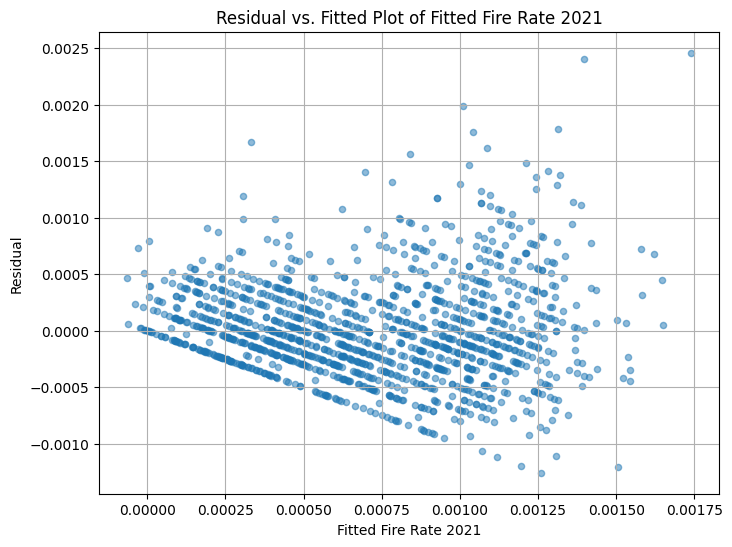

In [79]:
# Residuals vs. Fitted plot

# Set the figure size
plt.figure(figsize=(8, 6))  
# alpha = 0.5: controlling the transparency of the markers. Here alpha = 0.5 means that the markers are semi-transparent.
# s = 20: controlling the size of the markers. The default value is plt.rcParams['lines.markersize'] ** 2. Here we set it as 20.
# To get the default value of marker size, run the following line
# print(plt.rcParams['lines.markersize'] ** 2) 
plt.scatter(fire_rate_model_2021_final.fittedvalues, fire_rate_model_2021_final.resid, alpha = 0.5, s=20)
# adding title and labels
plt.xlabel('Fitted Fire Rate 2021')
plt.ylabel('Residual')
plt.title('Residual vs. Fitted Plot of Fitted Fire Rate 2021')
# Adding grid lines
plt.grid(True)
plt.show()

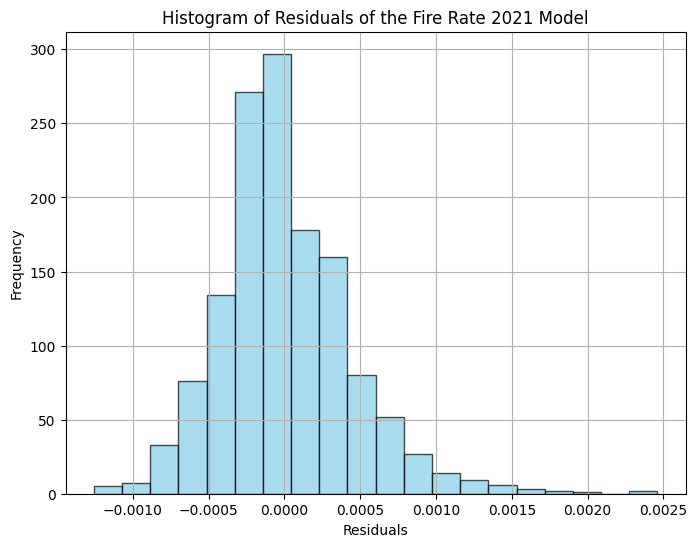

In [80]:
# Histogram of residuals

# Set the figure size
plt.figure(figsize=(8, 6))  

# Plotting the histogram
plt.hist(fire_rate_model_2021_final.resid, bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Adding labels and title
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals of the Fire Rate 2021 Model')

# Adding grid lines (optional)
plt.grid(True)

# Display the plot
plt.show()

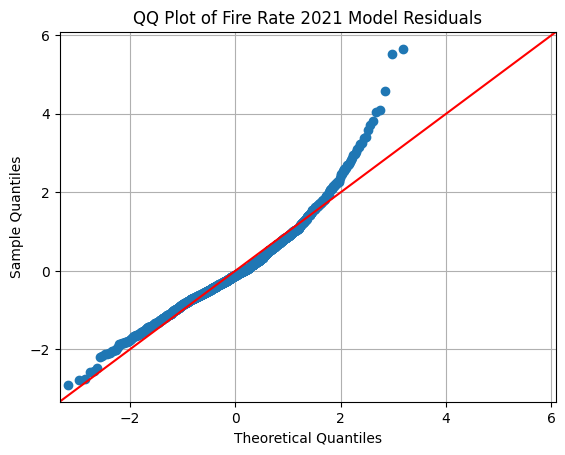

In [81]:
# (optional) the QQ plot of residuals
# More details: https://www.statsmodels.org/dev/generated/statsmodels.graphics.gofplots.qqplot.html
fig = sm.qqplot(fire_rate_model_2021_final.resid, fit=True, line="45")
plt.title('QQ Plot of Fire Rate 2021 Model Residuals')

# Adding grid lines (optional)
plt.grid(True)

# Display the plot
plt.show()

In [82]:
test_rainbow = sm.stats.diagnostic.linear_rainbow(fire_rate_model_2021_final)
# This function returns a tuple consisting of two values: the test statistic based on the F test and the pvalue of the test
# Note that these two values are not named. Therefore, you need to know the order before accessing these two values.
print("The p value of the rainbow test: {:.4f}".format(test_rainbow[1]))

The p value of the rainbow test: 0.5326


In [83]:
test_dw = sm.stats.stattools.durbin_watson(fire_rate_model_2021_final.resid)
print("Durbin-Watson test statistic is: {:.4f}".format(test_dw))

Durbin-Watson test statistic is: 1.9569


In [84]:
test_Ljung_Box = sm.stats.diagnostic.acorr_ljungbox(fire_rate_model_2021_final.resid)
# print the result
print(test_Ljung_Box)
print("The maximum p value of the Ljung Box test: {:.4f}".format(test_Ljung_Box.lb_pvalue.max()))
print("The minimum p value of the Ljung Box test: {:.4f}".format(test_Ljung_Box.lb_pvalue.min()))

      lb_stat  lb_pvalue
1    0.623816   0.429633
2    9.594778   0.008251
3    9.603687   0.022254
4   11.331221   0.023083
5   11.545900   0.041569
6   16.175890   0.012840
7   16.217960   0.023198
8   17.500133   0.025303
9   19.037492   0.024876
10  20.181936   0.027578
The maximum p value of the Ljung Box test: 0.4296
The minimum p value of the Ljung Box test: 0.0083


In [85]:
test_JB = sm.stats.stattools.jarque_bera(fire_rate_model_2021_final.resid)
print("The p value of the Jarque Bera test: {:.4f}".format(test_JB[1]))

The p value of the Jarque Bera test: 0.0000


In [86]:
sm.stats.diagnostic.het_goldfeldquandt(fire_rate_model_2021_final.model.endog,
                                       fire_rate_model_2021_final.model.exog)

(1.0059073732077692, 0.46961068324202343, 'increasing')

# 2021 False Alarm Model

In [87]:
false_alarm_rate_model_2021 = sm.OLS(endog=vif_filtered_df_2021[['false_alarm_rate']],
                             exog=vif_filtered_df_2021.drop(columns = ["ward code","ward name","false_alarm_rate",
                                                                       "fire_rate"])).fit()
false_alarm_rate_model_2021.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:       false_alarm_rate   R-squared (uncentered):                   0.799
Model:                            OLS   Adj. R-squared (uncentered):              0.797
Method:                 Least Squares   F-statistic:                              333.8
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                        0.00
Time:                        16:10:16   Log-Likelihood:                          6159.6
No. Observations:                1357   AIC:                                 -1.229e+04
Df Residuals:                    1341   BIC:                                 -1.220e+04
Df Model:                          16                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
lockdown                -0.0042      0.000    -29.902      0.000      -0.004      -0.004
no_central_heat          0.0649      0.016      3.977      0.000       0.033       0.097
not_detached            -0.0028      0.001     -3.750      0.000      -0.004      -0.001
detached                -0.0048      0.001     -3.237      0.001      -0.008      -0.002
sever_deprived           0.0057      0.008      0.723      0.470      -0.010       0.021
unemployed               0.0153      0.017      0.905      0.366      -0.018       0.048
economiclly_inactive     0.0213      0.002      9.334      0.000       0.017       0.026
doesnt_speak_english    -0.0348      0.006     -5.542      0.000      -0.047      -0.022
mixed                    0.0071      0.007      0.987      0.324      -0.007       0.021
asian                   -0.0005      0.001     -0.610      0.542      -0.002       0.001
black                    0.0007      0.001      0.522      0.602      -0.002       0.003
other_ethnicity          0.0095      0.003      3.076      0.002       0.003       0.016
medium_education        -0.0063      0.002     -2.771      0.006      -0.011      -0.002
private_rented           0.0028      0.001      2.177      0.030       0.000       0.005
crime rate               0.0052      0.001      5.031      0.000       0.003       0.007
one_car                 -0.0025      0.001     -1.676      0.094      -0.005       0.000
==============================================================================
Omnibus:                      586.276   Durbin-Watson:                   1.904
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4869.079
Skew:                           1.800   Prob(JB):                         0.00
Kurtosis:                      11.553   Cond. No.                         259.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [88]:
alphas = [abs(c) for c in np.random.normal(0.000001, 0.00001, (100)).tolist()]
# Fit Lasso model
for alpha in alphas:
    false_alarm_rt_model_2021_lasso = Lasso(alpha=alpha, fit_intercept = False)
    false_alarm_rt_model_2021_lasso.fit(vif_filtered_df_2021.drop(columns = ["ward code","ward name",
                                  "false_alarm_rate", "fire_rate"]), vif_filtered_df_2021[['false_alarm_rate']])
    
    y_train_pred = false_alarm_rt_model_2021_lasso.predict(vif_filtered_df_2021.drop(columns = ["ward code",
                                                  "ward name", "false_alarm_rate", "fire_rate"]))
    # Residual sum of squares (RSS)
    rss = np.sum((vif_filtered_df_2021['false_alarm_rate'] - pd.DataFrame(y_train_pred,
                                                       columns = ['y_train_pred'])['y_train_pred']) ** 2)
    # Total sum of squares (TSS)
    tss = np.sum((vif_filtered_df_2021['false_alarm_rate']-np.mean(vif_filtered_df_2021['false_alarm_rate'])) ** 2)
    # R-squared
    r_squared = 1 - (rss / tss)
    print(f"R-squared is {r_squared} for alpha {alpha}")
    non_zero_coef = len([c for c in false_alarm_rt_model_2021_lasso.coef_.tolist()if c != 0])
    print(f"number of Coef is {non_zero_coef} out of {len(false_alarm_rt_model_2021_lasso.coef_)}")

R-squared is 0.5595635487897115 for alpha 2.5641654711682086e-06
number of Coef is 12 out of 16
R-squared is 0.5478753094136564 for alpha 9.315146362711245e-06
number of Coef is 8 out of 16
R-squared is 0.5599951574357109 for alpha 2.460915351911614e-06
number of Coef is 12 out of 16
R-squared is 0.5351057975954978 for alpha 2.104962335276435e-05
number of Coef is 8 out of 16
R-squared is 0.5322995414741799 for alpha 2.2856296401140823e-05
number of Coef is 8 out of 16
R-squared is 0.5475437906149808 for alpha 9.791931144921054e-06
number of Coef is 8 out of 16
R-squared is 0.5490507349759052 for alpha 7.3353685718629586e-06
number of Coef is 8 out of 16
R-squared is 0.5574164762179923 for alpha 3.0916075910628976e-06
number of Coef is 10 out of 16
R-squared is 0.549292697274082 for alpha 6.855968696501561e-06
number of Coef is 8 out of 16
R-squared is 0.5511490000175594 for alpha 4.475390827245617e-06
number of Coef is 9 out of 16
R-squared is 0.5607623264346049 for alpha 2.2650857464

In [89]:
alpha = 2 * 10 ** -6
false_alarm_rt_model_2021_lasso = Lasso(alpha=alpha, fit_intercept = False)  # Set your regularization parameter
false_alarm_rt_model_2021_lasso.fit(vif_filtered_df_2021.drop(columns = ["ward code","ward name",
                           "false_alarm_rate","fire_rate"]), vif_filtered_df_2021[['false_alarm_rate']])
                     
#0.000005
y_train_pred = false_alarm_rt_model_2021_lasso.predict(vif_filtered_df_2021.drop(columns = ["ward code",
                                              "ward name", "false_alarm_rate", "fire_rate"]))
# Residual sum of squares (RSS)
rss = np.sum((vif_filtered_df_2021['false_alarm_rate'] - pd.DataFrame(y_train_pred,
                                                   columns = ['y_train_pred'])['y_train_pred']) ** 2)
# Total sum of squares (TSS)
tss = np.sum((vif_filtered_df_2021['false_alarm_rate'] - np.mean(vif_filtered_df_2021['false_alarm_rate'])) ** 2)
# R-squared
r_squared = 1 - (rss / tss)
print(f"R-squared is {r_squared} for alpha {alpha}")
non_zero_coef = len([c for c in false_alarm_rt_model_2021_lasso.coef_.tolist()if c != 0])
print(f"number of Coef is {non_zero_coef} out of {len(false_alarm_rt_model_2021_lasso.coef_)}")
coef = pd.DataFrame(false_alarm_rt_model_2021_lasso.coef_, index = vif_filtered_df_2021.drop(columns = [
                                              "ward code", "ward name", "false_alarm_rate", "fire_rate"]).columns)

features = coef[coef[0] != 0].index.tolist()

false_alarm_rt_model_2021_final = sm.OLS(endog=vif_filtered_df_2021[['false_alarm_rate']],
                                    exog=vif_filtered_df_2021[features]).fit()
false_alarm_rt_model_2021_final.summary()

R-squared is 0.5617892737490593 for alpha 2e-06
number of Coef is 13 out of 16


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:       false_alarm_rate   R-squared (uncentered):                   0.796
Model:                            OLS   Adj. R-squared (uncentered):              0.794
Method:                 Least Squares   F-statistic:                              403.8
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                        0.00
Time:                        16:10:18   Log-Likelihood:                          6149.1
No. Observations:                1357   AIC:                                 -1.227e+04
Df Residuals:                    1344   BIC:                                 -1.220e+04
Df Model:                          13                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
lockdown                -0.0042      0.000    -29.640      0.000      -0.004      -0.004
not_detached            -0.0038      0.001     -5.459      0.000      -0.005      -0.002
detached                -0.0078      0.001     -6.150      0.000      -0.010      -0.005
economiclly_inactive     0.0247      0.002     12.473      0.000       0.021       0.029
doesnt_speak_english    -0.0322      0.006     -5.778      0.000      -0.043      -0.021
mixed                    0.0110      0.007      1.647      0.100      -0.002       0.024
asian                   -0.0002      0.001     -0.298      0.765      -0.002       0.001
black                    0.0031      0.001      2.579      0.010       0.001       0.005
other_ethnicity          0.0097      0.003      3.126      0.002       0.004       0.016
medium_education        -0.0041      0.002     -1.884      0.060      -0.008       0.000
private_rented           0.0049      0.001      4.650      0.000       0.003       0.007
crime rate               0.0055      0.001      5.331      0.000       0.003       0.008
one_car                 -0.0029      0.001     -1.992      0.047      -0.006   -4.41e-05
==============================================================================
Omnibus:                      590.102   Durbin-Watson:                   1.883
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5079.345
Skew:                           1.801   Prob(JB):                         0.00
Kurtosis:                      11.767   Cond. No.                         102.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [90]:
false_alarm_rt_model_2021_final = sm.OLS(endog=vif_filtered_df_2021[['false_alarm_rate']],
                                    exog=vif_filtered_df_2021[['no_central_heat','lockdown', 'not_detached',
           'detached', 'economiclly_inactive', 'doesnt_speak_english', 'black', 'other_ethnicity',
           'private_rented', 'crime rate']]).fit()
false_alarm_rt_model_2021_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:       false_alarm_rate   R-squared (uncentered):                   0.797
Model:                            OLS   Adj. R-squared (uncentered):              0.796
Method:                 Least Squares   F-statistic:                              530.1
Date:                Sun, 12 Jan 2025   Prob (F-statistic):                        0.00
Time:                        16:10:18   Log-Likelihood:                          6153.2
No. Observations:                1357   AIC:                                 -1.229e+04
Df Residuals:                    1347   BIC:                                 -1.223e+04
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
no_central_heat          0.0650      0.016      4.076      0.000       0.034       0.096
lockdown                -0.0042      0.000    -29.947      0.000      -0.005      -0.004
not_detached            -0.0046      0.000    -10.148      0.000      -0.006      -0.004
detached                -0.0068      0.001     -5.187      0.000      -0.009      -0.004
economiclly_inactive     0.0185      0.001     13.035      0.000       0.016       0.021
doesnt_speak_english    -0.0317      0.004     -8.883      0.000      -0.039      -0.025
black                    0.0019      0.001      2.078      0.038       0.000       0.004
other_ethnicity          0.0129      0.003      4.766      0.000       0.008       0.018
private_rented           0.0021      0.001      2.345      0.019       0.000       0.004
crime rate               0.0055      0.001      5.660      0.000       0.004       0.007
==============================================================================
Omnibus:                      584.029   Durbin-Watson:                   1.883
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4807.208
Skew:                           1.794   Prob(JB):                         0.00
Kurtosis:                      11.494   Cond. No.                         199.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

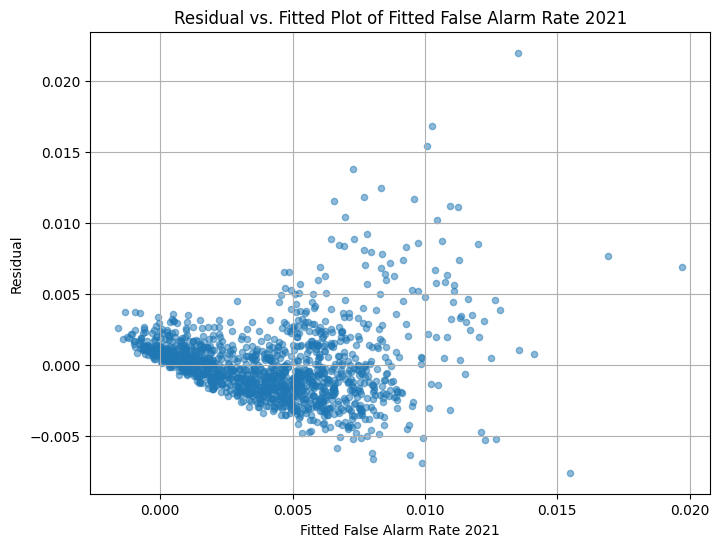

In [93]:
# Residuals vs. Fitted plot

# Set the figure size
plt.figure(figsize=(8, 6))  
# alpha = 0.5: controlling the transparency of the markers. Here alpha = 0.5 means that the markers are semi-transparent.
# s = 20: controlling the size of the markers. The default value is plt.rcParams['lines.markersize'] ** 2. Here we set it as 20.
# To get the default value of marker size, run the following line
# print(plt.rcParams['lines.markersize'] ** 2) 
plt.scatter(false_alarm_rt_model_2021_final.fittedvalues, false_alarm_rt_model_2021_final.resid, alpha = 0.5, s=20)
# adding title and labels
plt.xlabel('Fitted False Alarm Rate 2021')
plt.ylabel('Residual')
plt.title('Residual vs. Fitted Plot of Fitted False Alarm Rate 2021')
# Adding grid lines
plt.grid(True)
plt.show()

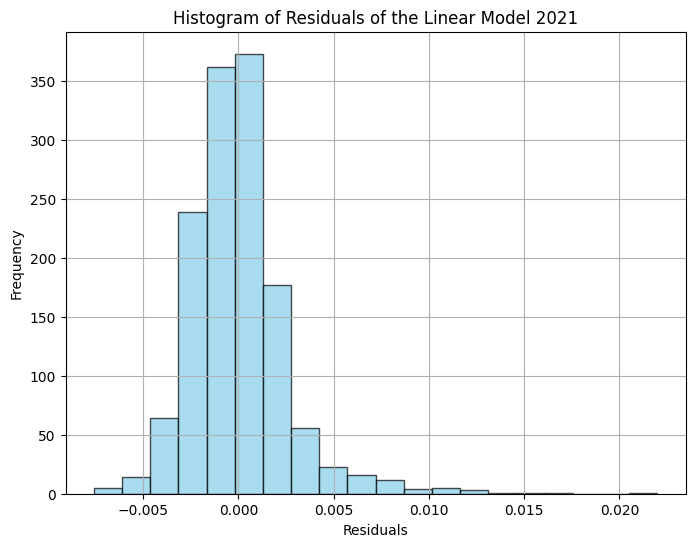

In [94]:
# Histogram of residuals

# Set the figure size
plt.figure(figsize=(8, 6))  

# Plotting the histogram
plt.hist(false_alarm_rt_model_2021_final.resid, bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Adding labels and title
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals of the Linear Model 2021')

# Adding grid lines (optional)
plt.grid(True)

# Display the plot
plt.show()

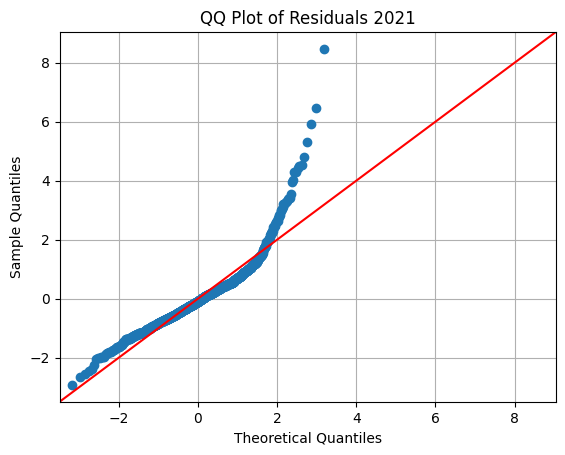

In [95]:
# (optional) the QQ plot of residuals
# More details: https://www.statsmodels.org/dev/generated/statsmodels.graphics.gofplots.qqplot.html
fig = sm.qqplot(false_alarm_rt_model_2021_final.resid, fit=True, line="45")
plt.title('QQ Plot of Residuals 2021')

# Adding grid lines (optional)
plt.grid(True)

# Display the plot
plt.show()

In [96]:
test_rainbow = sm.stats.diagnostic.linear_rainbow(false_alarm_rt_model_2021_final)
# This function returns a tuple consisting of two values: the test statistic based on the F test and the pvalue of the test
# Note that these two values are not named. Therefore, you need to know the order before accessing these two values.
print("The p value of the rainbow test: {:.4f}".format(test_rainbow[1]))

The p value of the rainbow test: 0.9730


In [97]:
test_dw = sm.stats.stattools.durbin_watson(false_alarm_rt_model_2021_final.resid)
print("Durbin-Watson test statistic is: {:.4f}".format(test_dw))

Durbin-Watson test statistic is: 1.8834


In [98]:
test_Ljung_Box = sm.stats.diagnostic.acorr_ljungbox(false_alarm_rt_model_2021_final.resid)
# print the result
print(test_Ljung_Box)
print("The maximum p value of the Ljung Box test: {:.4f}".format(test_Ljung_Box.lb_pvalue.max()))
print("The minimum p value of the Ljung Box test: {:.4f}".format(test_Ljung_Box.lb_pvalue.min()))

       lb_stat     lb_pvalue
1     4.385133  3.625367e-02
2    69.672156  7.428198e-16
3    73.933891  6.131698e-16
4   157.245119  5.697606e-33
5   159.137370  1.511463e-32
6   216.755608  5.116612e-44
7   217.119181  2.696415e-43
8   269.409636  1.312642e-53
9   271.573526  2.748973e-53
10  317.478487  3.118608e-62
The maximum p value of the Ljung Box test: 0.0363
The minimum p value of the Ljung Box test: 0.0000


In [99]:
test_JB = sm.stats.stattools.jarque_bera(false_alarm_rt_model_2021_final.resid)
print("The p value of the Jarque Bera test: {:.4f}".format(test_JB[1]))

The p value of the Jarque Bera test: 0.0000


In [100]:
sm.stats.diagnostic.het_goldfeldquandt(false_alarm_rt_model_2021_final.model.endog,
                                       false_alarm_rt_model_2021_final.model.exog)

(1.0215032255400025, 0.39167549584009165, 'increasing')

# PCA Experiments

In [290]:
from sklearn.decomposition import PCA

central_heating_file = "socioeconomic data/ward/central heating.xlsx"
central_heating_df_2011= pd.read_excel(central_heating_file, sheet_name="2011")
pca = PCA(n_components=1)
cols = central_heating_df_2011.columns[5:]
for col in cols:
    central_heating_df_2011[col] = central_heating_df_2011[col] / central_heating_df_2011['All households ']
central_heating_df_2011_pca = pca.fit_transform(central_heating_df_2011[cols])
central_heating_df_2011['central_heating_pca'] = central_heating_df_2011_pca.reshape(-1)
central_heating_df_2011 = central_heating_df_2011[['ward code', 'central_heating_pca']]

accomodation_type_file = "socioeconomic data/ward/accommodation type.xlsx"
accomodation_type_2011 = pd.read_excel(accomodation_type_file, sheet_name= "2011")

pca = PCA(n_components=1)
cols = accomodation_type_2011.columns[5:]
for col in cols:
    accomodation_type_2011[col] = accomodation_type_2011[col] / accomodation_type_2011['All households ']
accomodation_type_2011_pca = pca.fit_transform(accomodation_type_2011[cols])
accomodation_type_2011['accomodation_type_pca'] = accomodation_type_2011_pca.reshape(-1)
accomodation_type_2011 = accomodation_type_2011[['ward code', 'accomodation_type_pca']]

deprivation_file = "socioeconomic data/ward/Household deprivation.xlsx"
deprivation_2011 = pd.read_excel(deprivation_file, sheet_name= "2011")

pca = PCA(n_components=1)
cols = deprivation_2011.columns[5:]
for col in cols:
    deprivation_2011[col] = deprivation_2011[col] / deprivation_2011['All Households']
deprivation_2011_pca = pca.fit_transform(deprivation_2011[cols])
deprivation_2011['deprivation_pca'] = deprivation_2011_pca.reshape(-1)
deprivation_2011 = deprivation_2011[['ward code', 'deprivation_pca']]

economic_activity_file = "socioeconomic data/ward/Economic Activity.xlsx"
economic_activity_2011 = pd.read_excel(economic_activity_file, sheet_name= "2011")

pca = PCA(n_components=1)
cols = economic_activity_2011.columns[5:]
for col in cols:
    economic_activity_2011[col] = economic_activity_2011[col] / economic_activity_2011['All usual residents aged 16-74 ']
economic_activity_2011_pca = pca.fit_transform(economic_activity_2011[cols])
economic_activity_2011['economic_activity_pca'] = economic_activity_2011_pca.reshape(-1)
economic_activity_2011 = economic_activity_2011[['ward code', 'economic_activity_pca']]

english_language_file = "socioeconomic data/ward/English Proficiency.xlsx"
english_language_2011 = pd.read_excel(english_language_file, sheet_name= "2011")

pca = PCA(n_components=1)
cols = english_language_2011.columns[5:]
for col in cols:
    english_language_2011[col] = english_language_2011[col] / english_language_2011['Usual residents aged 3+']
english_language_pca = pca.fit_transform(english_language_2011[cols])
english_language_2011['english_language_pca'] = english_language_pca.reshape(-1)
english_language_2011 = english_language_2011[['ward code', 'english_language_pca']]

ethnicity_file = "socioeconomic data/ward/Ethnic group.xlsx"
ethnicity_2011 = pd.read_excel(ethnicity_file, sheet_name= "2011")

pca = PCA(n_components=1)
cols = ethnicity_2011.columns[5:]
for col in cols:
    ethnicity_2011[col] = ethnicity_2011[col] / ethnicity_2011['All usual residents']
ethnicity_2011_pca = pca.fit_transform(ethnicity_2011[cols])
ethnicity_2011['ethnicity_pca'] = ethnicity_2011_pca.reshape(-1)
ethnicity_2011 = ethnicity_2011[['ward code', 'ethnicity_pca']]

education_file = "socioeconomic data/ward/qualifications.xlsx"
education_2011 = pd.read_excel(education_file, sheet_name= "2011")

pca = PCA(n_components=1)
cols = education_2011.columns[5:]
for col in cols:
    education_2011[col] = education_2011[col] / education_2011['Usual residents aged 16+']
education_2011_pca = pca.fit_transform(education_2011[cols])
education_2011['education_pca'] = education_2011_pca.reshape(-1)
education_2011 = education_2011[['ward code', 'education_pca']]

tenure_file = "socioeconomic data/ward/tenure - households.xlsx"
tenure_2011 = pd.read_excel(tenure_file, sheet_name= "2011")

pca = PCA(n_components=1)
cols = tenure_2011.columns[5:]
for col in cols:
    tenure_2011[col] = tenure_2011[col] / tenure_2011['All Households']
tenure_2011_pca = pca.fit_transform(tenure_2011[cols])
tenure_2011['tenure_pca'] = tenure_2011_pca.reshape(-1)
tenure_2011 = tenure_2011[['ward code', 'tenure_pca']]

occupancy_rate_file = "socioeconomic data/ward/occupancy rating - bedrooms.xlsx"
occupancy_rate_2011 = pd.read_excel(occupancy_rate_file, sheet_name= "2011")

pca = PCA(n_components=1)
cols = occupancy_rate_2011.columns[5:]
for col in cols:
    occupancy_rate_2011[col] = occupancy_rate_2011[col] / occupancy_rate_2011['All Households']
occupancy_rate_2011_pca = pca.fit_transform(occupancy_rate_2011[cols])
occupancy_rate_2011['occupancy_rate_pca'] = occupancy_rate_2011_pca.reshape(-1)
occupancy_rate_2011 = occupancy_rate_2011[['ward code', 'occupancy_rate_pca']]

cars_file = "socioeconomic data/ward/cars or vans.xlsx"
cars_2011 = pd.read_excel(cars_file, sheet_name= "2011")

pca = PCA(n_components=1)
cols = cars_2011.columns[5:]
for col in cols:
    cars_2011[col] = cars_2011[col] / cars_2011['All households ']
cars_2011_pca = pca.fit_transform(cars_2011[cols])
cars_2011['cars_pca'] = cars_2011_pca.reshape(-1)
cars_2011 = cars_2011[['ward code', 'cars_pca']]

# Joining datasets of the year 2011 to study their impact on fire incident rate 
full_incident_rate_2011 = incident_rate_2011.set_index('ward code').join(
    central_heating_df_2011.set_index('ward code')).join(accomodation_type_2011.set_index('ward code')).join(
    deprivation_2011.set_index('ward code')).join(economic_activity_2011.set_index('ward code')).join(
    english_language_2011.set_index('ward code')).join(ethnicity_2011.set_index('ward code')).join(
    education_2011.set_index('ward code')).join(tenure_2011.set_index('ward code')).join(
    crime_df[['ward code','2011 crime rate']].set_index('ward code')).rename(columns = {'2011 crime rate':
       'crime rate'}).join(cars_2011.set_index('ward code')).join(occupancy_rate_2011.set_index('ward code')
#     ).join(unpaid_care_2011.set_index('ward code')).join(health_2011.set_index('ward code')).reset_index()
      ).reset_index()

full_incident_rate_2011

,ward code,CalYear,IncGeo_WardCode,IncGeo_WardName,weekday,false_alarm_count,fire_count,ward name,local authority code,local authority name,All households,fire_rate,false_alarm_rate,central_heating_pca,accomodation_type_pca,deprivation_pca,economic_activity_pca,english_language_pca,ethnicity_pca,education_pca,tenure_pca,crime rate,cars_pca,occupancy_rate_pca
0,E05009317,2011,E05009317,Bethnal Green,0,21.0,5.0,Bethnal Green,E09000030,Tower Hamlets,7124,0.0007,0.0029,0.115126,0.444076,-0.117541,-0.131002,0.114255,-0.103224,-0.024304,0.237569,0.100294,0.294032,-0.173628
1,E05009317,2011,E05009317,Bethnal Green,1,34.0,18.0,Bethnal Green,E09000030,Tower Hamlets,7124,0.0025,0.0048,0.115126,0.444076,-0.117541,-0.131002,0.114255,-0.103224,-0.024304,0.237569,0.100294,0.294032,-0.173628
2,E05009318,2011,E05009318,Blackwall & Cubitt Town,0,5.0,6.0,Blackwall & Cubitt Town,E09000030,Tower Hamlets,6418,0.0009,0.0008,0.377867,0.516205,0.056330,0.151147,0.126437,-0.143171,0.189261,0.165216,0.064001,0.196010,-0.177852
3,E05009318,2011,E05009318,Blackwall & Cubitt Town,1,19.0,10.0,Blackwall & Cubitt Town,E09000030,Tower Hamlets,6418,0.0016,0.0030,0.377867,0.516205,0.056330,0.151147,0.126437,-0.143171,0.189261,0.165216,0.064001,0.196010,-0.177852
4,E05009319,2011,E05009319,Bow East,0,23.0,5.0,Bow East,E09000030,Tower Hamlets,6595,0.0008,0.0035,0.291717,0.402663,-0.094126,0.057605,-0.014268,0.029839,0.032578,0.205507,0.098775,0.248291,-0.204073
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1350,E05014118,2011,E05014118,Waterloo & South Bank,1,20.0,10.0,Waterloo & South Bank,E09000022,Lambeth,4016,0.0025,0.0050,0.250550,0.477041,0.045661,0.003040,0.000058,-0.023027,0.135957,0.204249,0.328805,0.309753,-0.147197
1351,E05014119,2011,E05014119,West Dulwich,0,17.0,3.0,West Dulwich,E09000022,Lambeth,4770,0.0006,0.0036,-0.069305,-0.036047,0.134821,0.114172,-0.117657,0.101248,0.166766,-0.002216,0.086218,0.010922,0.065758
1352,E05014119,2011,E05014119,West Dulwich,1,32.0,5.0,West Dulwich,E09000022,Lambeth,4770,0.0010,0.0067,-0.069305,-0.036047,0.134821,0.114172,-0.117657,0.101248,0.166766,-0.002216,0.086218,0.010922,0.065758
1353,E09000001,2011,E09000001,City Of london,0,9.0,1.0,City of London (aggregated),E09000001,City of London,4385,0.0002,0.0021,0.620112,0.549161,0.078530,0.166049,-0.053284,0.128730,0.334600,0.031542,1.147932,0.333399,-0.239867


In [271]:
from sklearn.decomposition import PCA
n_com = 2
central_heating_file = "socioeconomic data/ward/central heating.xlsx"
central_heating_df_2011= pd.read_excel(central_heating_file, sheet_name="2011")
pca = PCA(n_components=n_com)
cols = central_heating_df_2011.columns[5:]
for col in cols:
    central_heating_df_2011[col] = central_heating_df_2011[col] / central_heating_df_2011['All households ']
central_heating_df_2011_pca = pca.fit_transform(central_heating_df_2011[cols])
central_heating_df_2011['central_heating_pca_1'] = pd.DataFrame(central_heating_df_2011_pca)[0]
central_heating_df_2011['central_heating_pca_2'] = pd.DataFrame(central_heating_df_2011_pca)[1]
central_heating_df_2011 = central_heating_df_2011[['ward code', 'central_heating_pca_1', 'central_heating_pca_2']]

accomodation_type_file = "socioeconomic data/ward/accommodation type.xlsx"
accomodation_type_2011 = pd.read_excel(accomodation_type_file, sheet_name= "2011")

pca = PCA(n_components=n_com)
cols = accomodation_type_2011.columns[5:]
for col in cols:
    accomodation_type_2011[col] = accomodation_type_2011[col] / accomodation_type_2011['All households ']
accomodation_type_2011_pca = pca.fit_transform(accomodation_type_2011[cols])
accomodation_type_2011['accomodation_type_pca_1'] = pd.DataFrame(accomodation_type_2011_pca)[0]
accomodation_type_2011['accomodation_type_pca_2'] = pd.DataFrame(accomodation_type_2011_pca)[1]
accomodation_type_2011 = accomodation_type_2011[['ward code', 'accomodation_type_pca_1','accomodation_type_pca_2']]

deprivation_file = "socioeconomic data/ward/Household deprivation.xlsx"
deprivation_2011 = pd.read_excel(deprivation_file, sheet_name= "2011")

pca = PCA(n_components=n_com)
cols = deprivation_2011.columns[5:]
for col in cols:
    deprivation_2011[col] = deprivation_2011[col] / deprivation_2011['All Households']
deprivation_2011_pca = pca.fit_transform(deprivation_2011[cols])
deprivation_2011['deprivation_pca_1'] = pd.DataFrame(deprivation_2011_pca)[0]
deprivation_2011['deprivation_pca_2'] = pd.DataFrame(deprivation_2011_pca)[1]
deprivation_2011 = deprivation_2011[['ward code', 'deprivation_pca_1','deprivation_pca_2']]

economic_activity_file = "socioeconomic data/ward/Economic Activity.xlsx"
economic_activity_2011 = pd.read_excel(economic_activity_file, sheet_name= "2011")

pca = PCA(n_components=n_com)
cols = economic_activity_2011.columns[5:]
for col in cols:
    economic_activity_2011[col] = economic_activity_2011[col] / economic_activity_2011['All usual residents aged 16-74 ']
economic_activity_2011_pca = pca.fit_transform(economic_activity_2011[cols])
economic_activity_2011['economic_activity_pca_1'] = pd.DataFrame(economic_activity_2011_pca)[0]
economic_activity_2011['economic_activity_pca_2'] = pd.DataFrame(economic_activity_2011_pca)[1]
economic_activity_2011 = economic_activity_2011[['ward code', 'economic_activity_pca_1','economic_activity_pca_2']]

english_language_file = "socioeconomic data/ward/English Proficiency.xlsx"
english_language_2011 = pd.read_excel(english_language_file, sheet_name= "2011")

pca = PCA(n_components=n_com)
cols = english_language_2011.columns[5:]
for col in cols:
    english_language_2011[col] = english_language_2011[col] / english_language_2011['Usual residents aged 3+']
english_language_pca = pca.fit_transform(english_language_2011[cols])
english_language_2011['english_language_pca_1'] = pd.DataFrame(english_language_pca)[0]
english_language_2011['english_language_pca_2'] = pd.DataFrame(english_language_pca)[1]
english_language_2011 = english_language_2011[['ward code', 'english_language_pca_1','english_language_pca_2']]

ethnicity_file = "socioeconomic data/ward/Ethnic group.xlsx"
ethnicity_2011 = pd.read_excel(ethnicity_file, sheet_name= "2011")

pca = PCA(n_components=n_com)
cols = ethnicity_2011.columns[5:]
for col in cols:
    ethnicity_2011[col] = ethnicity_2011[col] / ethnicity_2011['All usual residents']
ethnicity_2011_pca = pca.fit_transform(ethnicity_2011[cols])
ethnicity_2011['ethnicity_pca_1'] = pd.DataFrame(ethnicity_2011_pca)[0]
ethnicity_2011['ethnicity_pca_2'] = pd.DataFrame(ethnicity_2011_pca)[1]
ethnicity_2011 = ethnicity_2011[['ward code', 'ethnicity_pca_1','ethnicity_pca_2']]

education_file = "socioeconomic data/ward/qualifications.xlsx"
education_2011 = pd.read_excel(education_file, sheet_name= "2011")

pca = PCA(n_components=n_com)
cols = education_2011.columns[5:]
for col in cols:
    education_2011[col] = education_2011[col] / education_2011['Usual residents aged 16+']
education_2011_pca = pca.fit_transform(education_2011[cols])
education_2011['education_pca_1'] = pd.DataFrame(education_2011_pca)[0]
education_2011['education_pca_2'] = pd.DataFrame(education_2011_pca)[1]
education_2011 = education_2011[['ward code', 'education_pca_1','education_pca_2']]

tenure_file = "socioeconomic data/ward/tenure - households.xlsx"
tenure_2011 = pd.read_excel(tenure_file, sheet_name= "2011")

pca = PCA(n_components=n_com)
cols = tenure_2011.columns[5:]
for col in cols:
    tenure_2011[col] = tenure_2011[col] / tenure_2011['All Households']
tenure_2011_pca = pca.fit_transform(tenure_2011[cols])
tenure_2011['tenure_pca_1'] = pd.DataFrame(tenure_2011_pca)[0]
tenure_2011['tenure_pca_2'] = pd.DataFrame(tenure_2011_pca)[1]
tenure_2011 = tenure_2011[['ward code', 'tenure_pca_1', 'tenure_pca_2']]

occupancy_rate_file = "socioeconomic data/ward/occupancy rating - bedrooms.xlsx"
occupancy_rate_2011 = pd.read_excel(occupancy_rate_file, sheet_name= "2011")

pca = PCA(n_components=n_com)
cols = occupancy_rate_2011.columns[5:]
for col in cols:
    occupancy_rate_2011[col] = occupancy_rate_2011[col] / occupancy_rate_2011['All Households']
occupancy_rate_2011_pca = pca.fit_transform(occupancy_rate_2011[cols])
occupancy_rate_2011['occupancy_rate_pca_1'] = pd.DataFrame(occupancy_rate_2011_pca)[0]
occupancy_rate_2011['occupancy_rate_pca_2'] = pd.DataFrame(occupancy_rate_2011_pca)[1]
occupancy_rate_2011 = occupancy_rate_2011[['ward code', 'occupancy_rate_pca_1','occupancy_rate_pca_2']]

cars_file = "socioeconomic data/ward/cars or vans.xlsx"
cars_2011 = pd.read_excel(cars_file, sheet_name= "2011")

pca = PCA(n_components=n_com)
cols = cars_2011.columns[5:]
for col in cols:
    cars_2011[col] = cars_2011[col] / cars_2011['All households ']
cars_2011_pca = pca.fit_transform(cars_2011[cols])
cars_2011['cars_pca_1'] = pd.DataFrame(cars_2011_pca)[0]
cars_2011['cars_pca_2'] = pd.DataFrame(cars_2011_pca)[1]
cars_2011 = cars_2011[['ward code', 'cars_pca_1', 'cars_pca_2']]

# Joining datasets of the year 2011 to study their impact on fire incident rate 
full_incident_rate_2011 = incident_rate_2011.set_index('ward code').join(
    central_heating_df_2011.set_index('ward code')).join(accomodation_type_2011.set_index('ward code')).join(
    deprivation_2011.set_index('ward code')).join(economic_activity_2011.set_index('ward code')).join(
    english_language_2011.set_index('ward code')).join(ethnicity_2011.set_index('ward code')).join(
    education_2011.set_index('ward code')).join(tenure_2011.set_index('ward code')).join(
    crime_df[['ward code','2011 crime rate']].set_index('ward code')).rename(columns = {'2011 crime rate':
       'crime rate'}).join(cars_2011.set_index('ward code')).join(occupancy_rate_2011.set_index('ward code')
#     ).join(unpaid_care_2011.set_index('ward code')).join(health_2011.set_index('ward code')).reset_index()
      ).reset_index()

full_incident_rate_2011

,ward code,CalYear,IncGeo_WardCode,IncGeo_WardName,weekday,false_alarm_count,fire_count,ward name,local authority code,local authority name,All households,fire_rate,false_alarm_rate,central_heating_pca_1,central_heating_pca_2,accomodation_type_pca_1,accomodation_type_pca_2,deprivation_pca_1,deprivation_pca_2,economic_activity_pca_1,economic_activity_pca_2,english_language_pca_1,english_language_pca_2,ethnicity_pca_1,ethnicity_pca_2,education_pca_1,education_pca_2,tenure_pca_1,tenure_pca_2,crime rate,cars_pca_1,cars_pca_2,occupancy_rate_pca_1,occupancy_rate_pca_2
0,E05009317,2011,E05009317,Bethnal Green,0,21.0,5.0,Bethnal Green,E09000030,Tower Hamlets,7124,0.0007,0.0029,0.115126,-0.032012,0.444076,0.105830,-0.117541,-0.016837,-0.131002,0.074576,0.114255,-0.000747,-0.103224,-0.049695,-0.024304,0.020814,0.237569,0.086770,0.100294,0.294032,0.028918,-0.173628,0.020468
1,E05009317,2011,E05009317,Bethnal Green,1,34.0,18.0,Bethnal Green,E09000030,Tower Hamlets,7124,0.0025,0.0048,0.115126,-0.032012,0.444076,0.105830,-0.117541,-0.016837,-0.131002,0.074576,0.114255,-0.000747,-0.103224,-0.049695,-0.024304,0.020814,0.237569,0.086770,0.100294,0.294032,0.028918,-0.173628,0.020468
2,E05009318,2011,E05009318,Blackwall & Cubitt Town,0,5.0,6.0,Blackwall & Cubitt Town,E09000030,Tower Hamlets,6418,0.0009,0.0008,0.377867,-0.083757,0.516205,0.184295,0.056330,0.041002,0.151147,0.073750,0.126437,0.068115,-0.143171,-0.039691,0.189261,0.011385,0.165216,-0.235953,0.064001,0.196010,-0.010685,-0.177852,-0.072806
3,E05009318,2011,E05009318,Blackwall & Cubitt Town,1,19.0,10.0,Blackwall & Cubitt Town,E09000030,Tower Hamlets,6418,0.0016,0.0030,0.377867,-0.083757,0.516205,0.184295,0.056330,0.041002,0.151147,0.073750,0.126437,0.068115,-0.143171,-0.039691,0.189261,0.011385,0.165216,-0.235953,0.064001,0.196010,-0.010685,-0.177852,-0.072806
4,E05009319,2011,E05009319,Bow East,0,23.0,5.0,Bow East,E09000030,Tower Hamlets,6595,0.0008,0.0035,0.291717,-0.091428,0.402663,0.094917,-0.094126,0.024354,0.057605,0.039816,-0.014268,0.009289,0.029839,-0.031000,0.032578,-0.003666,0.205507,-0.084600,0.098775,0.248291,0.008608,-0.204073,-0.067766
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1350,E05014118,2011,E05014118,Waterloo & South Bank,1,20.0,10.0,Waterloo & South Bank,E09000022,Lambeth,4016,0.0025,0.0050,0.250550,-0.042760,0.477041,0.131791,0.045661,0.026599,0.003040,0.086053,0.000058,0.027445,-0.023027,-0.048277,0.135957,-0.012412,0.204249,-0.098687,0.328805,0.309753,0.045639,-0.147197,-0.067078
1351,E05014119,2011,E05014119,West Dulwich,0,17.0,3.0,West Dulwich,E09000022,Lambeth,4770,0.0006,0.0036,-0.069305,-0.003412,-0.036047,-0.123828,0.134821,-0.034897,0.114172,-0.001213,-0.117657,-0.001338,0.101248,-0.032053,0.166766,-0.031117,-0.002216,-0.047921,0.086218,0.010922,-0.069958,0.065758,0.007841
1352,E05014119,2011,E05014119,West Dulwich,1,32.0,5.0,West Dulwich,E09000022,Lambeth,4770,0.0010,0.0067,-0.069305,-0.003412,-0.036047,-0.123828,0.134821,-0.034897,0.114172,-0.001213,-0.117657,-0.001338,0.101248,-0.032053,0.166766,-0.031117,-0.002216,-0.047921,0.086218,0.010922,-0.069958,0.065758,0.007841
1353,E09000001,2011,E09000001,City Of london,0,9.0,1.0,City of London (aggregated),E09000001,City of London,4385,0.0002,0.0021,0.620112,-0.045659,0.549161,0.194863,0.078530,0.090111,0.166049,0.012171,-0.053284,0.041110,0.128730,-0.030180,0.334600,-0.025446,0.031542,-0.107226,1.147932,0.333399,0.074538,-0.239867,-0.092674


Text(0.5, 1.0, 'Correlation Matrix')

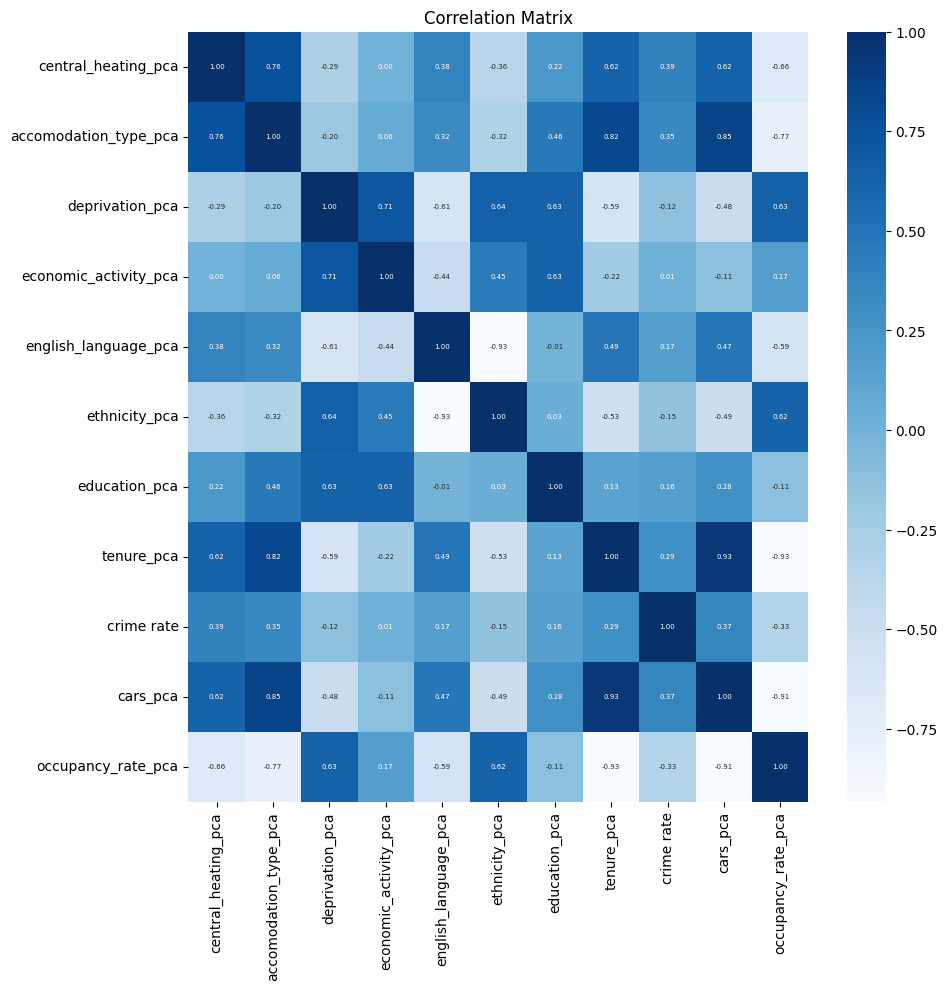

In [317]:
df_2011 = full_incident_rate_2011.drop(columns=["ward code", "IncGeo_WardCode", "CalYear", "IncGeo_WardName",
                                       "ward name", "local authority code",	"local authority name", "fire_rate",
                                       "All households", "false_alarm_rate","false_alarm_count", "fire_count",])
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(df_2011.drop(columns = ['weekday']).select_dtypes(include=np.number).corr(), annot=True,
        fmt=".2f", cmap='Blues', ax = ax, annot_kws={"size": 5})
plt.title('Correlation Matrix')

In [331]:
vif_filtered_df_2011 = drop_column_using_vif_(df_2011, thresh=10)
vif_filtered_df_2011["ward code"] = full_incident_rate_2011["ward code"]
vif_filtered_df_2011["ward name"] = full_incident_rate_2011["ward name"]
vif_filtered_df_2011["false_alarm_rate"] = full_incident_rate_2011["false_alarm_rate"]
vif_filtered_df_2011["fire_rate"] = full_incident_rate_2011["fire_rate"]
print("The columns remaining after VIF selection are:")
print(vif_filtered_df_2011.columns)

Max VIF: 27.194346660896375
Dropping: deprivation_pca
Max VIF: 14.257271590272012
Dropping: tenure_pca
Max VIF: 11.213521687341215
Dropping: occupancy_rate_pca
Max VIF: 8.316114399326729
The columns remaining after VIF selection are:
Index(['weekday', 'central_heating_pca', 'accomodation_type_pca',
       'economic_activity_pca', 'english_language_pca', 'ethnicity_pca',
       'education_pca', 'crime rate', 'cars_pca', 'ward code', 'ward name',
       'false_alarm_rate', 'fire_rate'],
      dtype='object')


In [332]:
fire_rate_model_2011 = sm.OLS(endog=vif_filtered_df_2011[['fire_rate']],
      exog=vif_filtered_df_2011.drop(columns = ["ward code","ward name", "false_alarm_rate", "fire_rate"])).fit()
fire_rate_model_2011.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              fire_rate   R-squared (uncentered):                   0.715
Model:                            OLS   Adj. R-squared (uncentered):              0.713
Method:                 Least Squares   F-statistic:                              374.7
Date:                Fri, 10 Jan 2025   Prob (F-statistic):                        0.00
Time:                        23:30:50   Log-Likelihood:                          7971.0
No. Observations:                1355   AIC:                                 -1.592e+04
Df Residuals:                    1346   BIC:                                 -1.588e+04
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
weekday                   0.0012   2.99e-05     41.483      0.000       0.001       0.001
central_heating_pca      -0.0010      0.000     -3.772      0.000      -0.002      -0.000
accomodation_type_pca     0.0008      0.000      3.808      0.000       0.000       0.001
economic_activity_pca    -0.0005      0.000     -1.506      0.132      -0.001       0.000
english_language_pca     -0.0011      0.000     -2.611      0.009      -0.002      -0.000
ethnicity_pca            -0.0010      0.000     -4.150      0.000      -0.002      -0.001
education_pca            -0.0008      0.000     -3.817      0.000      -0.001      -0.000
crime rate                0.0018      0.000     12.238      0.000       0.001       0.002
cars_pca                  0.0003      0.000      1.410      0.159      -0.000       0.001
==============================================================================
Omnibus:                       67.126   Durbin-Watson:                   1.877
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              181.456
Skew:                          -0.220   Prob(JB):                     3.96e-40
Kurtosis:                       4.738   Cond. No.                         18.5
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [333]:
fire_rate_model_2011 = sm.OLS(endog=vif_filtered_df_2011[['fire_rate']],
      exog=vif_filtered_df_2011.drop(columns = ["ward code","ward name", "false_alarm_rate", "fire_rate",
                                               "economic_activity_pca", "cars_pca"])).fit()
fire_rate_model_2011.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              fire_rate   R-squared (uncentered):                   0.714
Model:                            OLS   Adj. R-squared (uncentered):              0.712
Method:                 Least Squares   F-statistic:                              480.4
Date:                Fri, 10 Jan 2025   Prob (F-statistic):                        0.00
Time:                        23:30:57   Log-Likelihood:                          7968.9
No. Observations:                1355   AIC:                                 -1.592e+04
Df Residuals:                    1348   BIC:                                 -1.589e+04
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
weekday                   0.0012   2.98e-05     41.463      0.000       0.001       0.001
central_heating_pca      -0.0012      0.000     -4.728      0.000      -0.002      -0.001
accomodation_type_pca     0.0011      0.000      8.257      0.000       0.001       0.001
english_language_pca     -0.0009      0.000     -2.375      0.018      -0.002      -0.000
ethnicity_pca            -0.0011      0.000     -4.613      0.000      -0.002      -0.001
education_pca            -0.0011      0.000     -7.216      0.000      -0.001      -0.001
crime rate                0.0018      0.000     12.704      0.000       0.002       0.002
==============================================================================
Omnibus:                       71.564   Durbin-Watson:                   1.869
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              198.703
Skew:                          -0.235   Prob(JB):                     7.11e-44
Kurtosis:                       4.816   Cond. No.                         17.8
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [334]:
fire_rate_model_2011 = sm.OLS(endog=vif_filtered_df_2011[['fire_rate']],
      exog=df_2011.drop(columns = ["economic_activity_pca", "cars_pca", "english_language_pca",
                                  "occupancy_rate_pca", "accomodation_type_pca"])).fit()
fire_rate_model_2011.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              fire_rate   R-squared (uncentered):                   0.717
Model:                            OLS   Adj. R-squared (uncentered):              0.716
Method:                 Least Squares   F-statistic:                              488.1
Date:                Fri, 10 Jan 2025   Prob (F-statistic):                        0.00
Time:                        23:31:01   Log-Likelihood:                          7976.6
No. Observations:                1355   AIC:                                 -1.594e+04
Df Residuals:                    1348   BIC:                                 -1.590e+04
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
weekday                 0.0012   2.97e-05     41.520      0.000       0.001       0.001
central_heating_pca    -0.0008      0.000     -3.714      0.000      -0.001      -0.000
deprivation_pca         0.0016      0.001      2.571      0.010       0.000       0.003
ethnicity_pca          -0.0006      0.000     -3.899      0.000      -0.001      -0.000
education_pca          -0.0015      0.000     -3.871      0.000      -0.002      -0.001
tenure_pca              0.0019      0.000      7.512      0.000       0.001       0.002
crime rate              0.0018      0.000     12.836      0.000       0.002       0.002
==============================================================================
Omnibus:                       66.755   Durbin-Watson:                   1.894
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              173.630
Skew:                          -0.235   Prob(JB):                     1.98e-38
Kurtosis:                       4.690   Cond. No.                         30.0
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

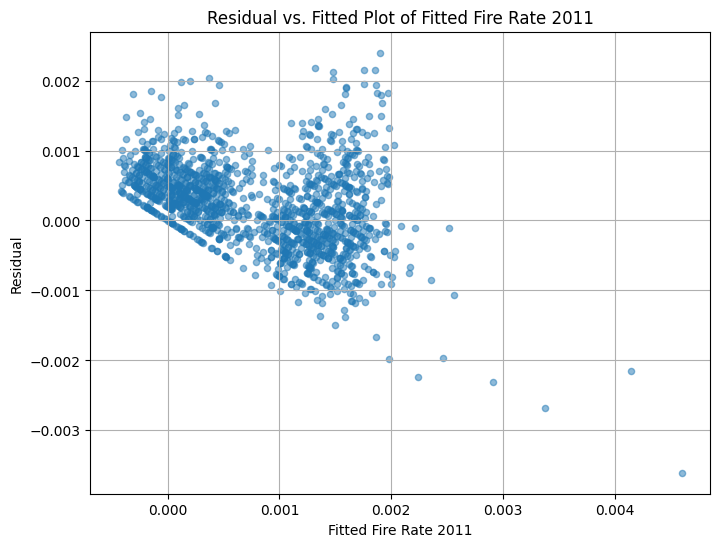

In [335]:
# Residuals vs. Fitted plot

# Set the figure size
plt.figure(figsize=(8, 6))  
# alpha = 0.5: controlling the transparency of the markers. Here alpha = 0.5 means that the markers are semi-transparent.
# s = 20: controlling the size of the markers. The default value is plt.rcParams['lines.markersize'] ** 2. Here we set it as 20.
# To get the default value of marker size, run the following line
# print(plt.rcParams['lines.markersize'] ** 2) 
plt.scatter(fire_rate_model_2011.fittedvalues, fire_rate_model_2011.resid, alpha = 0.5, s=20)
# adding title and labels
plt.xlabel('Fitted Fire Rate 2011')
plt.ylabel('Residual')
plt.title('Residual vs. Fitted Plot of Fitted Fire Rate 2011')
# Adding grid lines
plt.grid(True)
plt.show()

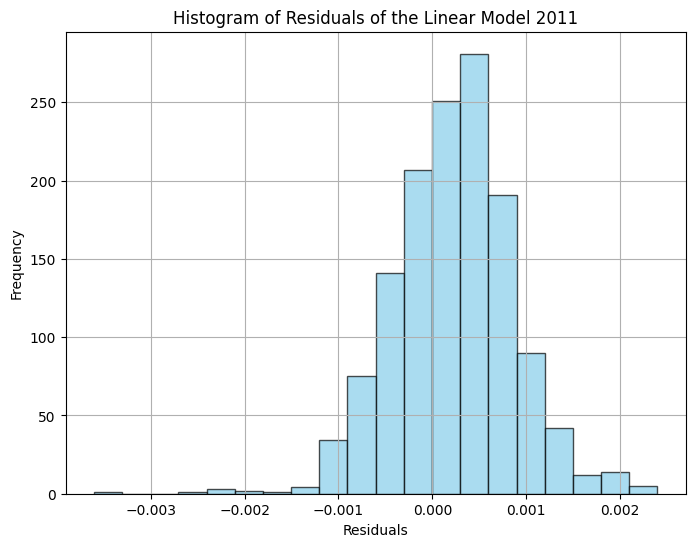

In [336]:
# Histogram of residuals

# Set the figure size
plt.figure(figsize=(8, 6))  

# Plotting the histogram
plt.hist(fire_rate_model_2011.resid, bins=20, color='skyblue', edgecolor='black', alpha=0.7)

# Adding labels and title
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals of the Linear Model 2011')

# Adding grid lines (optional)
plt.grid(True)

# Display the plot
plt.show()

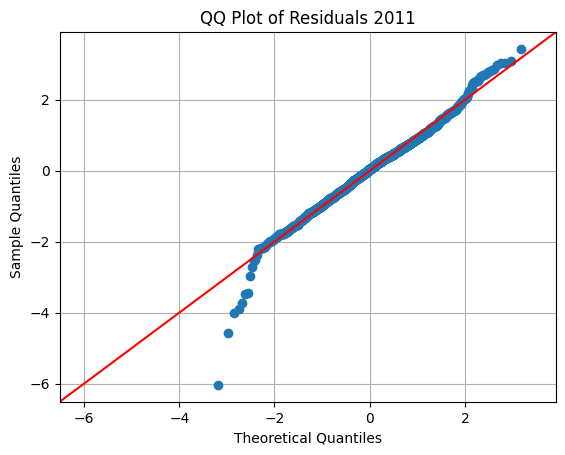

In [337]:
# (optional) the QQ plot of residuals
# More details: https://www.statsmodels.org/dev/generated/statsmodels.graphics.gofplots.qqplot.html
fig = sm.qqplot(fire_rate_model_2011.resid, fit=True, line="45")
plt.title('QQ Plot of Residuals 2011')

# Adding grid lines (optional)
plt.grid(True)

# Display the plot
plt.show()

In [338]:
test_rainbow = sm.stats.diagnostic.linear_rainbow(fire_rate_model_2011)
# This function returns a tuple consisting of two values: the test statistic based on the F test and the pvalue of the test
# Note that these two values are not named. Therefore, you need to know the order before accessing these two values.
print("The p value of the rainbow test: {:.4f}".format(test_rainbow[1]))

The p value of the rainbow test: 0.1792


In [339]:
test_dw = sm.stats.stattools.durbin_watson(fire_rate_model_2011.resid)
print("Durbin-Watson test statistic is: {:.4f}".format(test_dw))

Durbin-Watson test statistic is: 1.8940


In [340]:
test_Ljung_Box = sm.stats.diagnostic.acorr_ljungbox(fire_rate_model_2011.resid)
# print the result
print(test_Ljung_Box)
print("The maximum p value of the Ljung Box test: {:.4f}".format(test_Ljung_Box.lb_pvalue.max()))
print("The minimum p value of the Ljung Box test: {:.4f}".format(test_Ljung_Box.lb_pvalue.min()))

       lb_stat     lb_pvalue
1     6.052605  1.388580e-02
2    39.302161  2.921757e-09
3    67.115373  1.769152e-14
4   103.277575  1.971812e-21
5   114.038502  5.736196e-23
6   153.244275  1.593829e-30
7   178.892165  3.338550e-35
8   205.108488  5.354666e-40
9   219.541274  2.613463e-42
10  242.215043  2.347507e-46
The maximum p value of the Ljung Box test: 0.0139
The minimum p value of the Ljung Box test: 0.0000


In [341]:
test_JB = sm.stats.stattools.jarque_bera(fire_rate_model_2011.resid)
print("The p value of the Jarque Bera test: {:.4f}".format(test_JB[1]))

The p value of the Jarque Bera test: 0.0000


In [342]:
sm.stats.diagnostic.het_goldfeldquandt(fire_rate_model_2011.model.endog, fire_rate_model_2011.model.exog)

(1.321286722336962, 0.0001590420510564851, 'increasing')

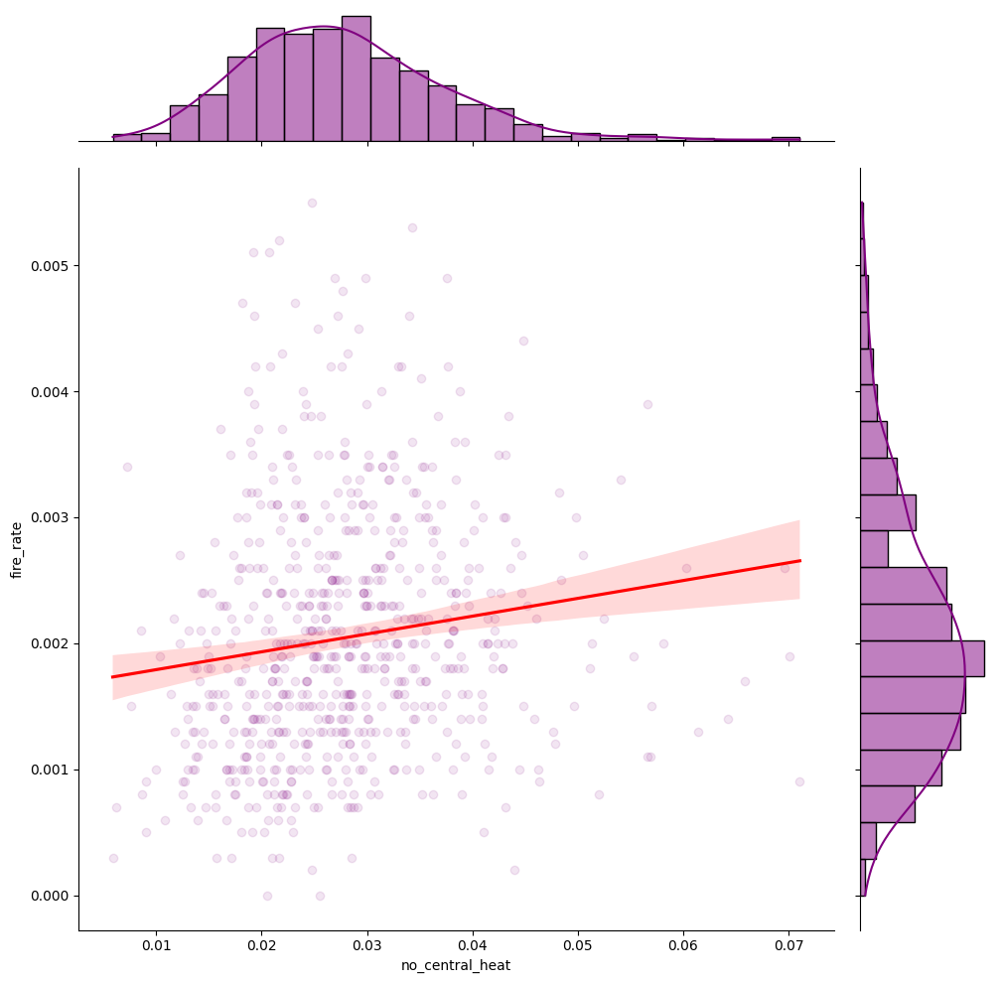

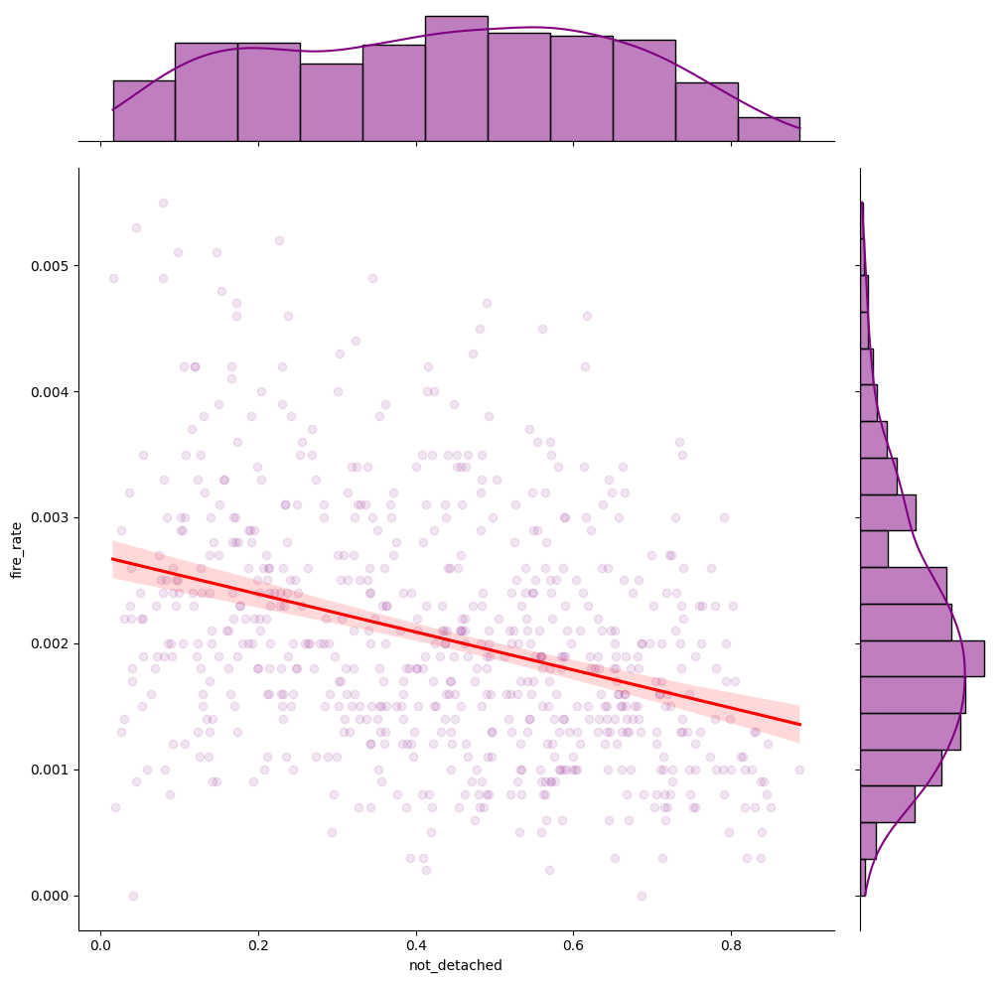

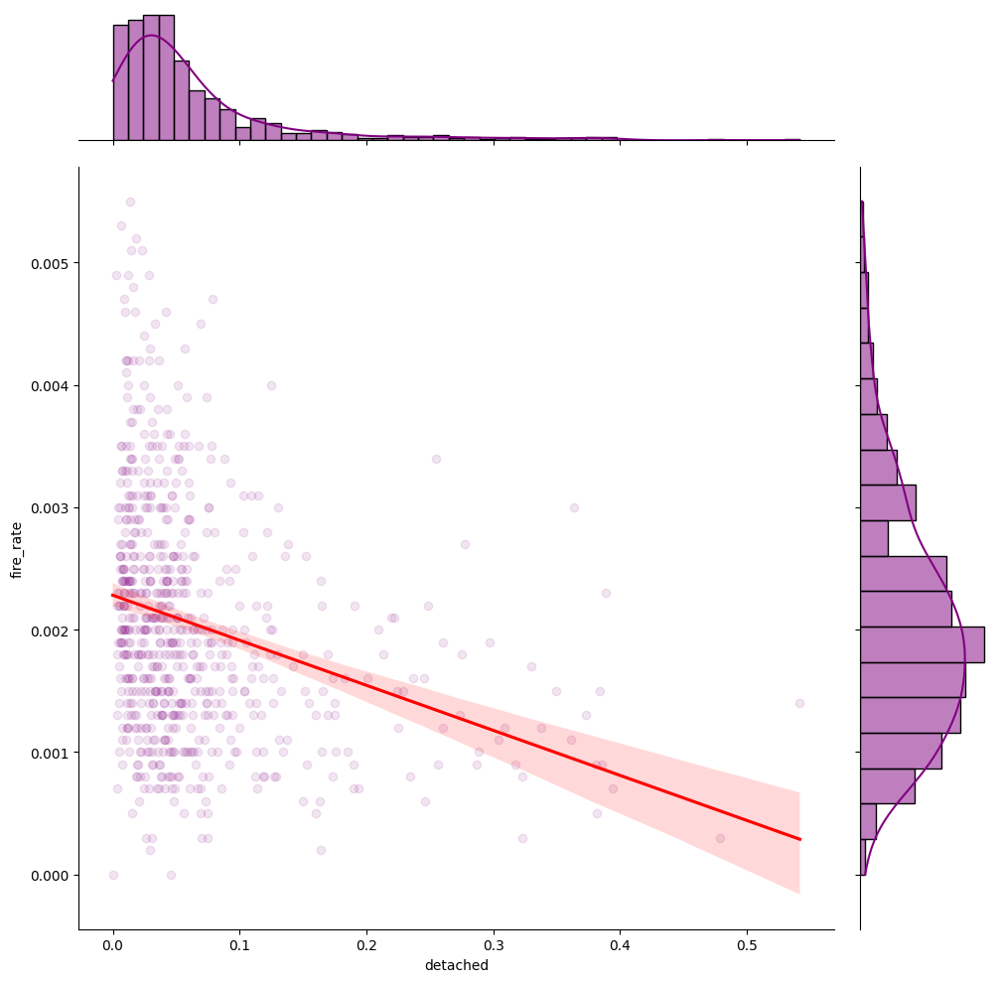

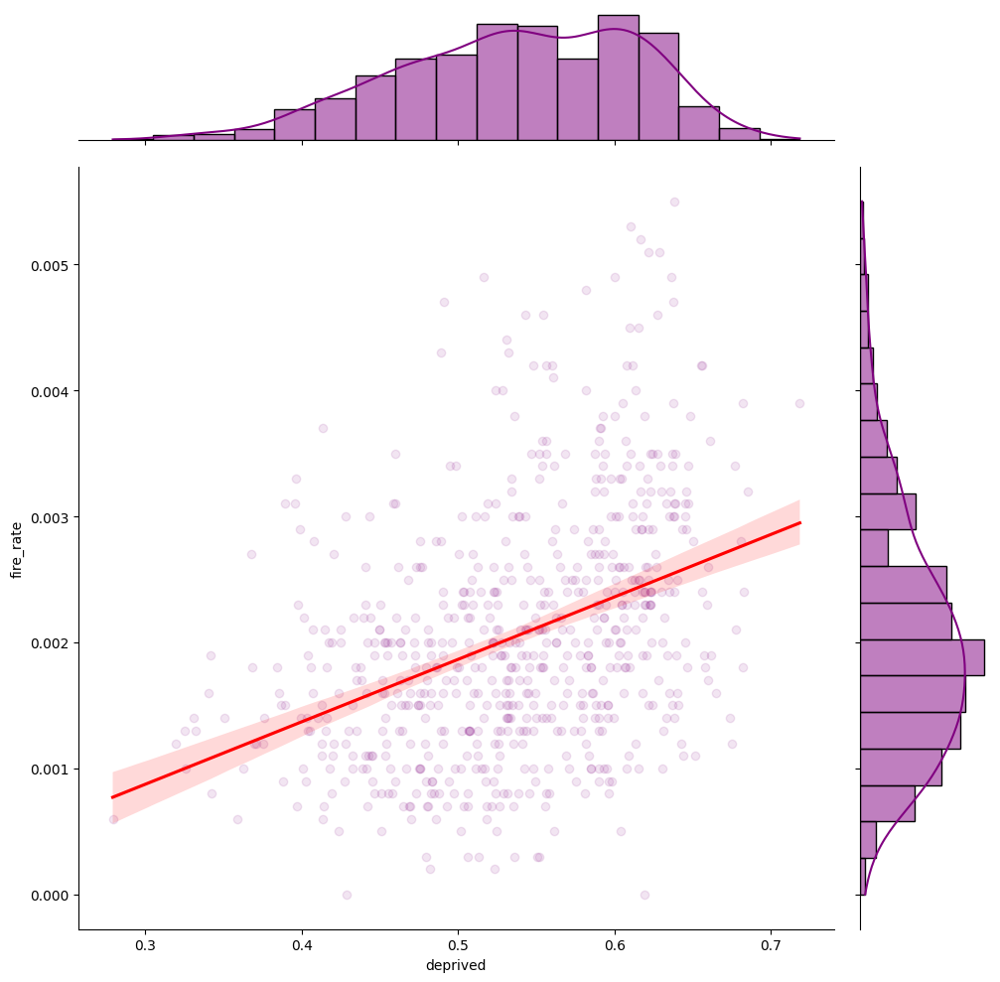

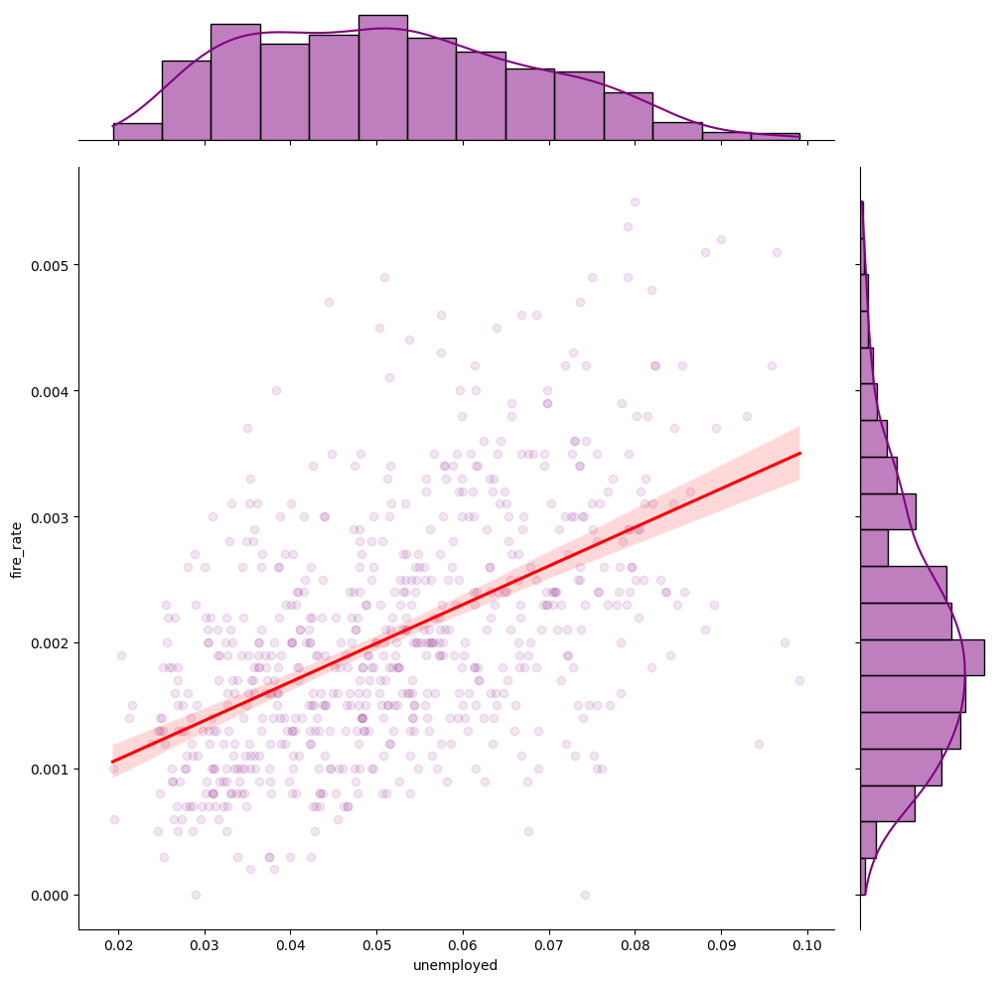

...

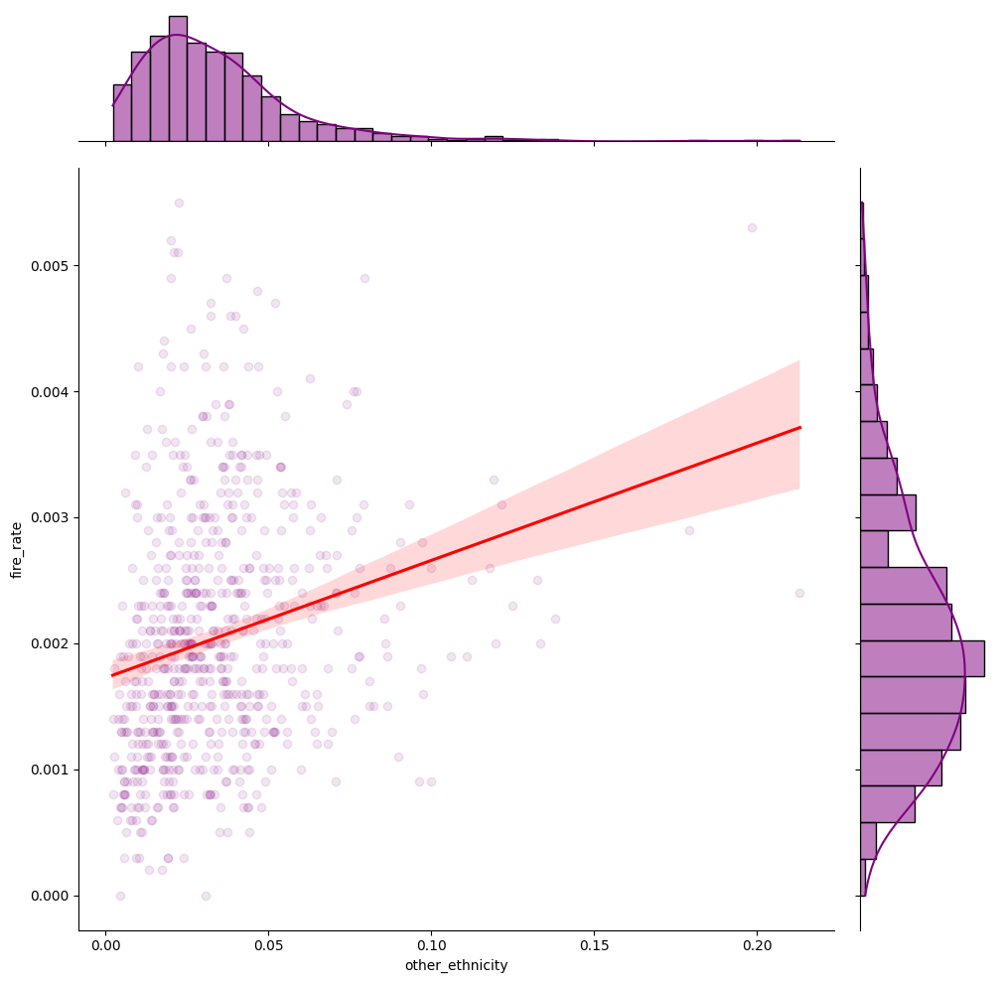

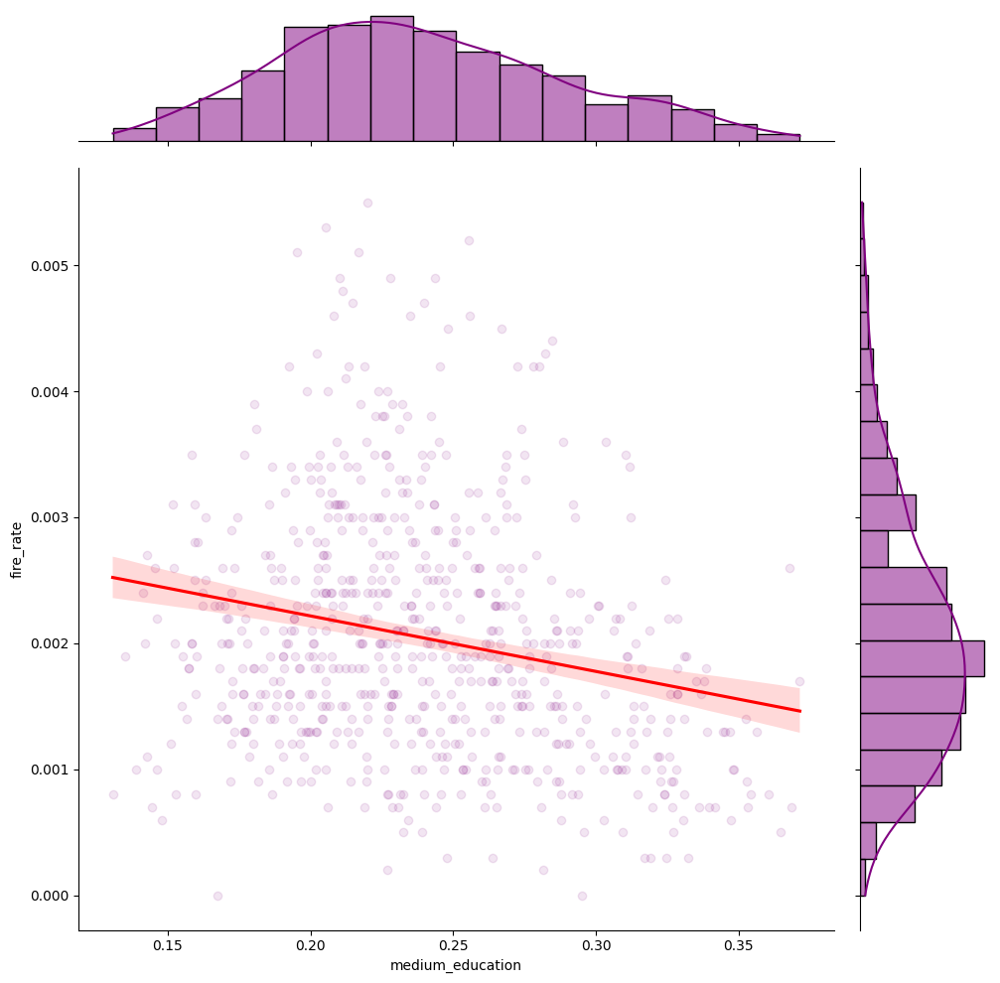

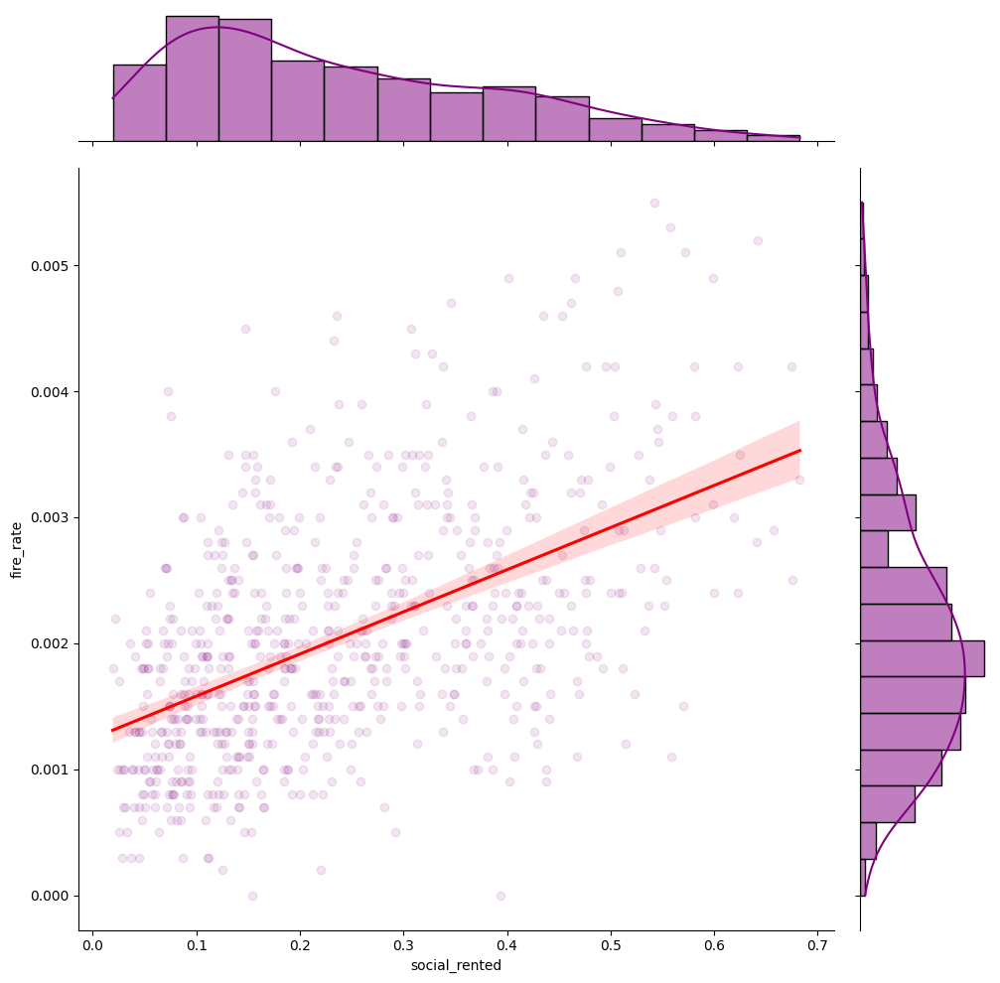

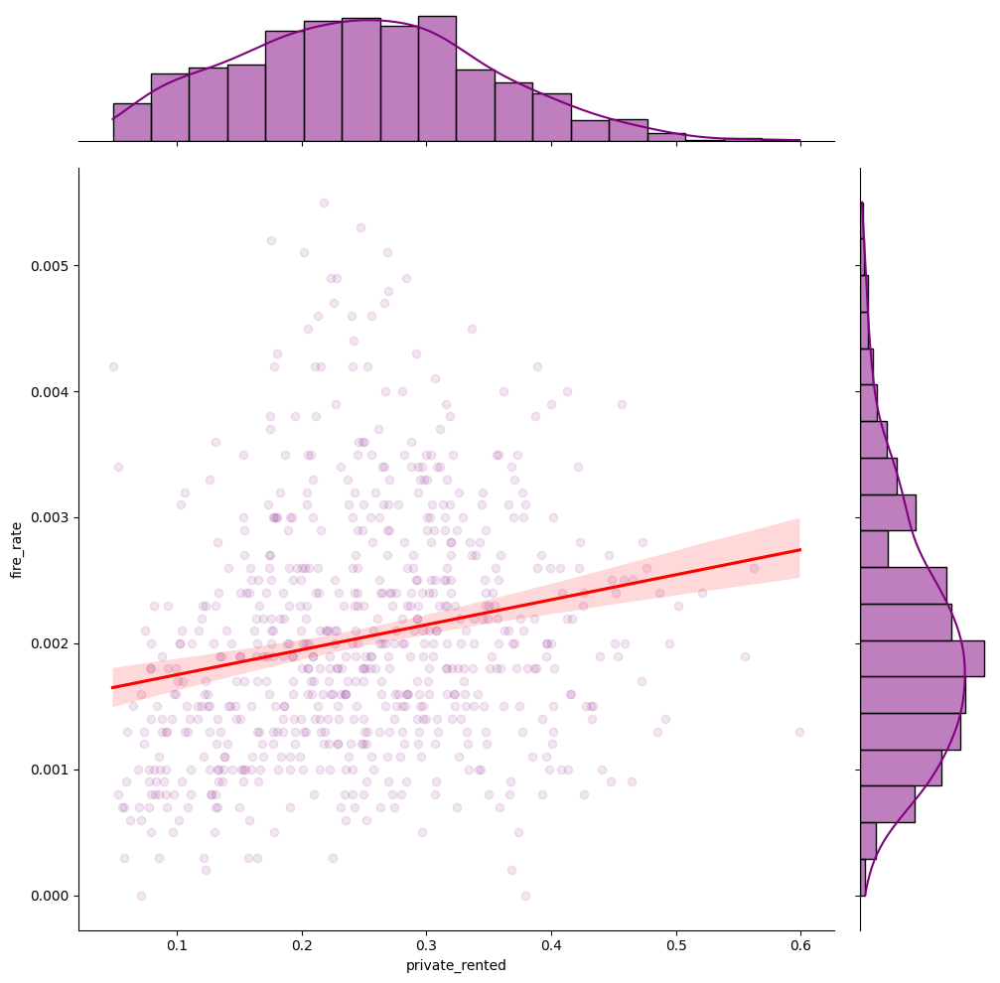

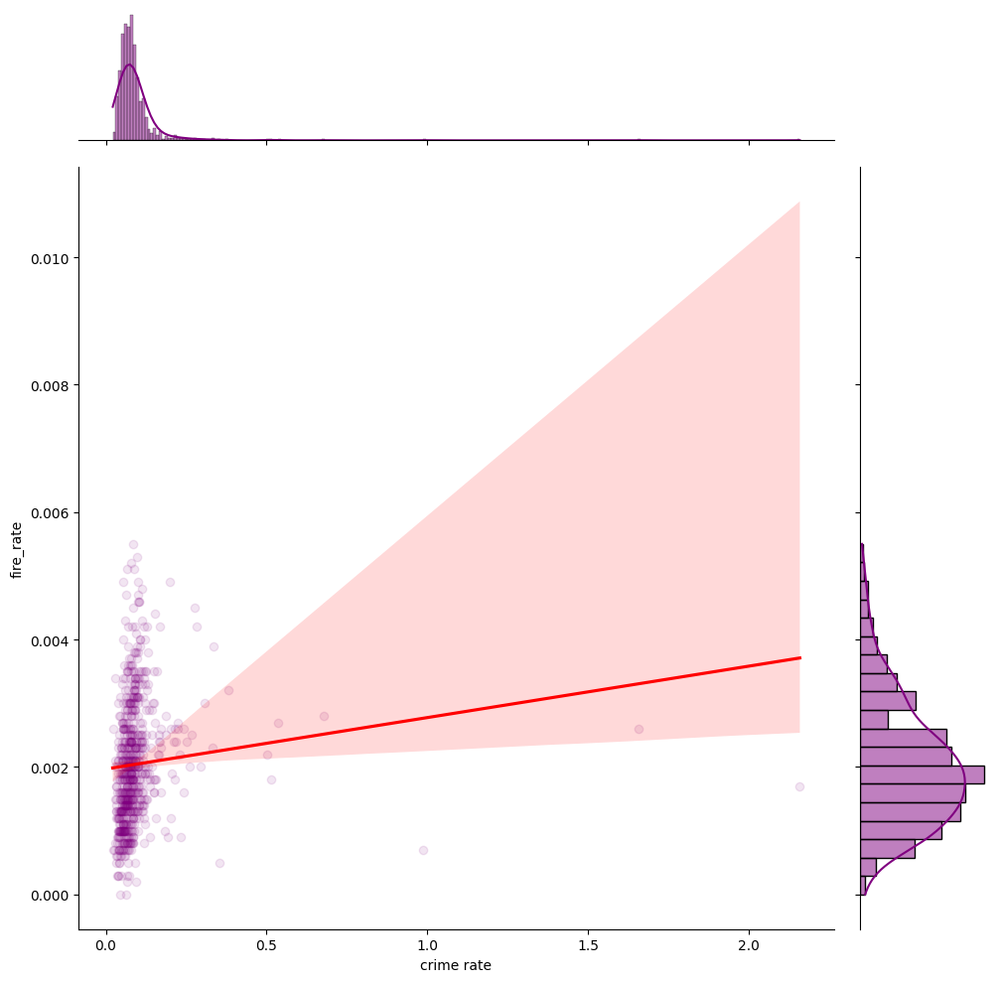

In [45]:
import seaborn as sns
y = 'fire_rate'
cols = vif_filtered_df_2011.drop(columns = ['ward code', 'ward name', 'false_alarm_rate', 'fire_rate']).columns
for col in cols:
    sns.jointplot(data=vif_filtered_df_2011, x=col, y=y, kind="reg",
                  scatter_kws=dict(alpha=0.1), line_kws=dict(color='red'), height=10, color = 'purple')
    plt.xlabel(col)
    plt.ylabel(y)

In [46]:
vif_filtered_df_2011[vif_filtered_df_2011['crime rate'] > 1]

,no_central_heat,not_detached,detached,deprived,unemployed,economiclly_inactive,doesnt_speak_english,mixed,asian,black,other_ethnicity,medium_education,social_rented,private_rented,crime rate,ward code,ward name,false_alarm_rate,fire_rate
459,0.069620,0.038948,0.005931,0.522539,0.042314,0.300698,0.034971,0.042549,0.153020,0.049185,0.044306,0.202622,0.283511,0.407276,1.657259,E05013806,St James's,0.0196,0.0026
461,0.065893,0.039737,0.005317,0.532251,0.035661,0.286253,0.031742,0.048960,0.160343,0.045441,0.081166,0.172505,0.231253,0.472440,2.157609,E05013808,West End,0.0196,0.0017


C:\Users\ayham\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:1696: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f = plt.figure(figsize=(height, height))


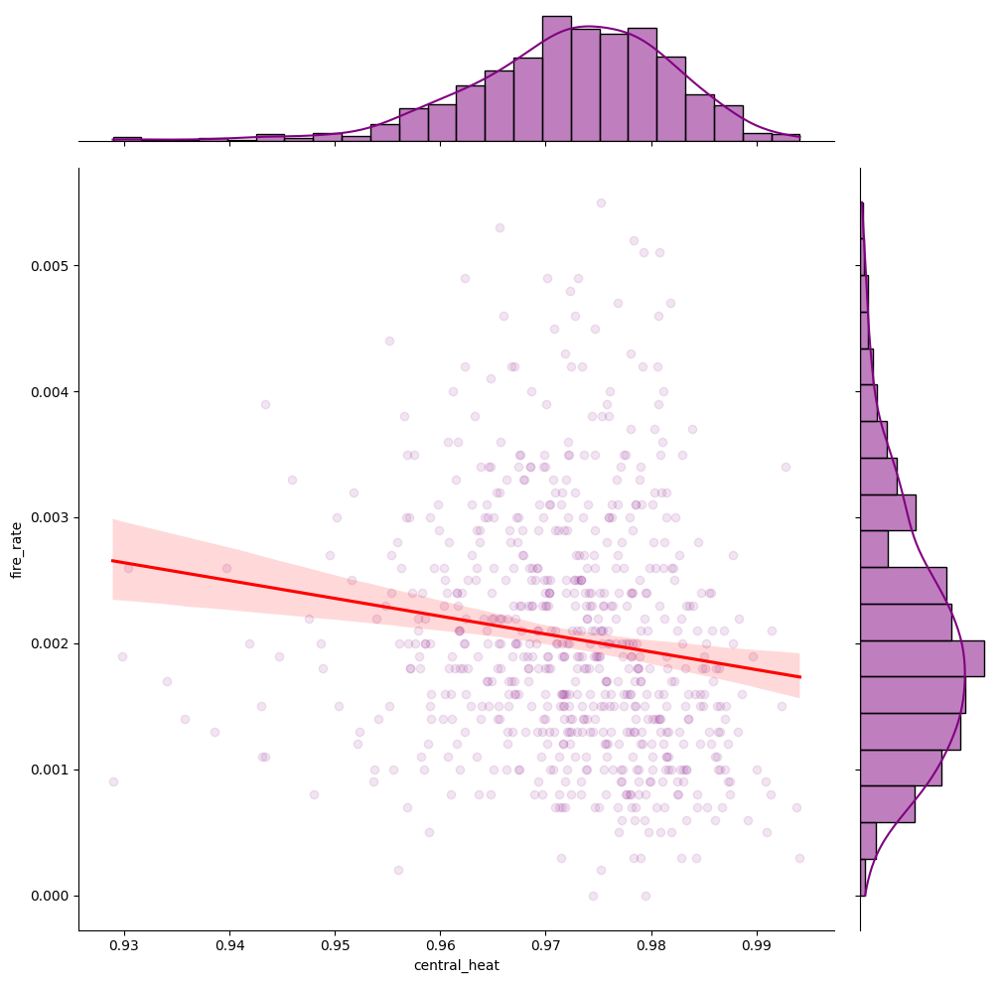

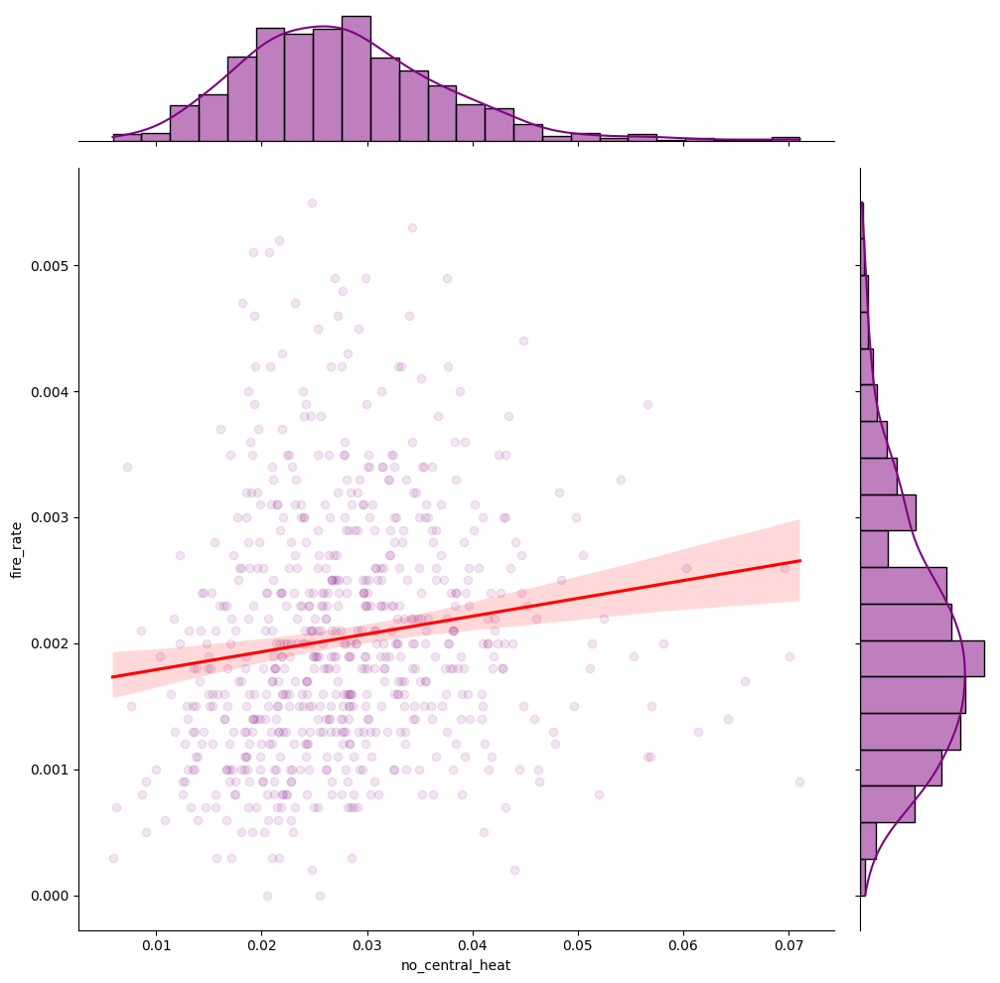

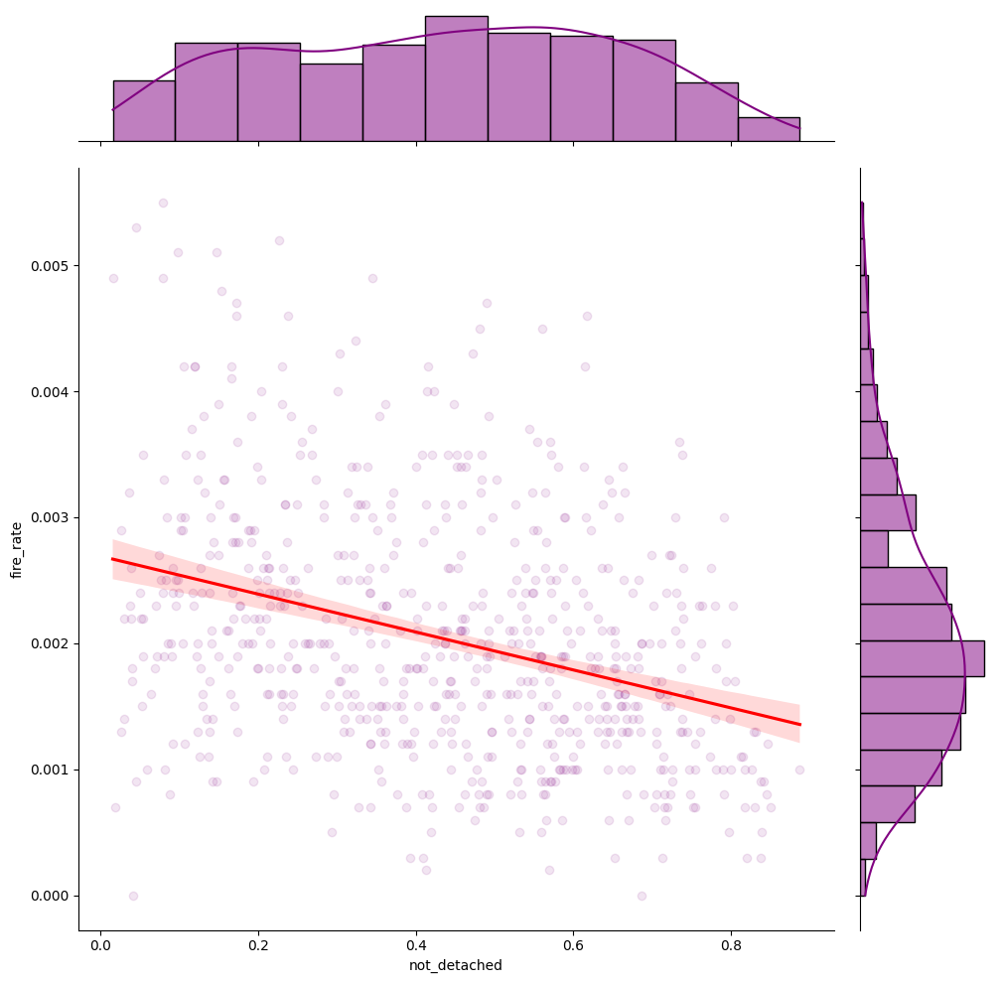

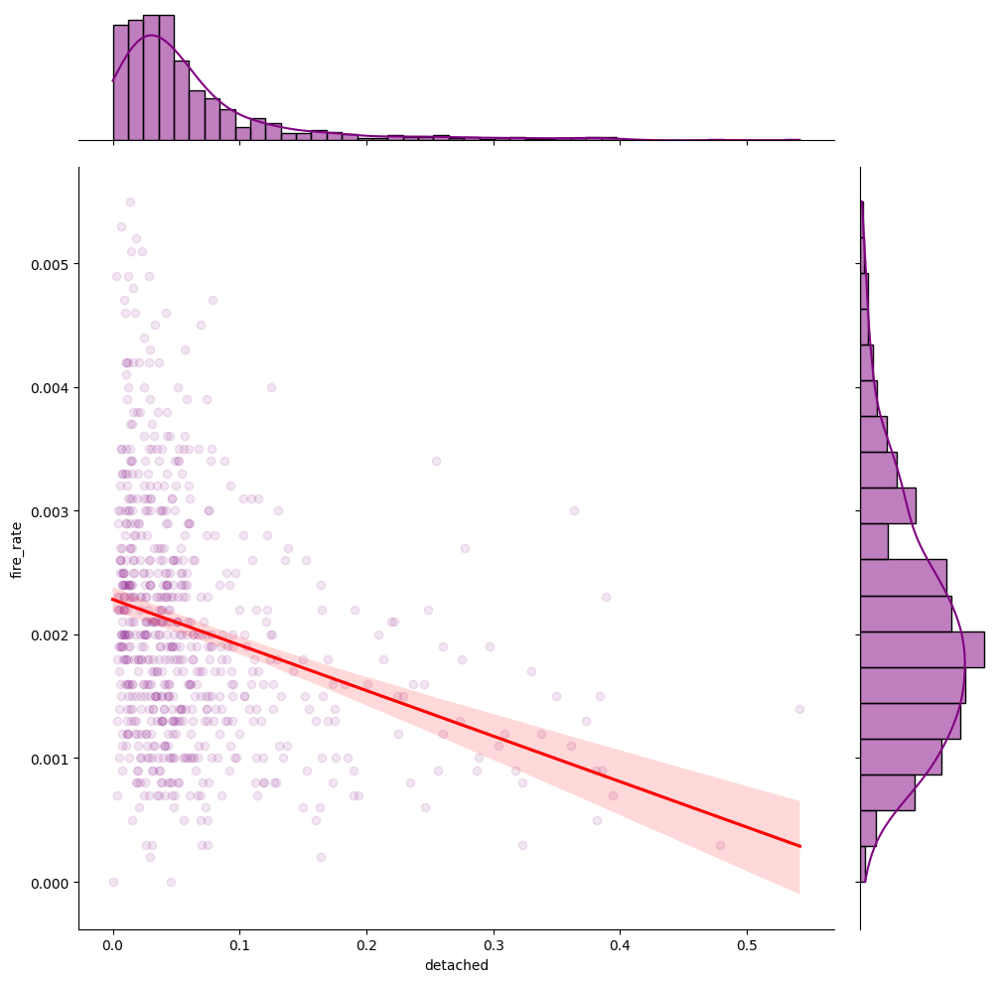

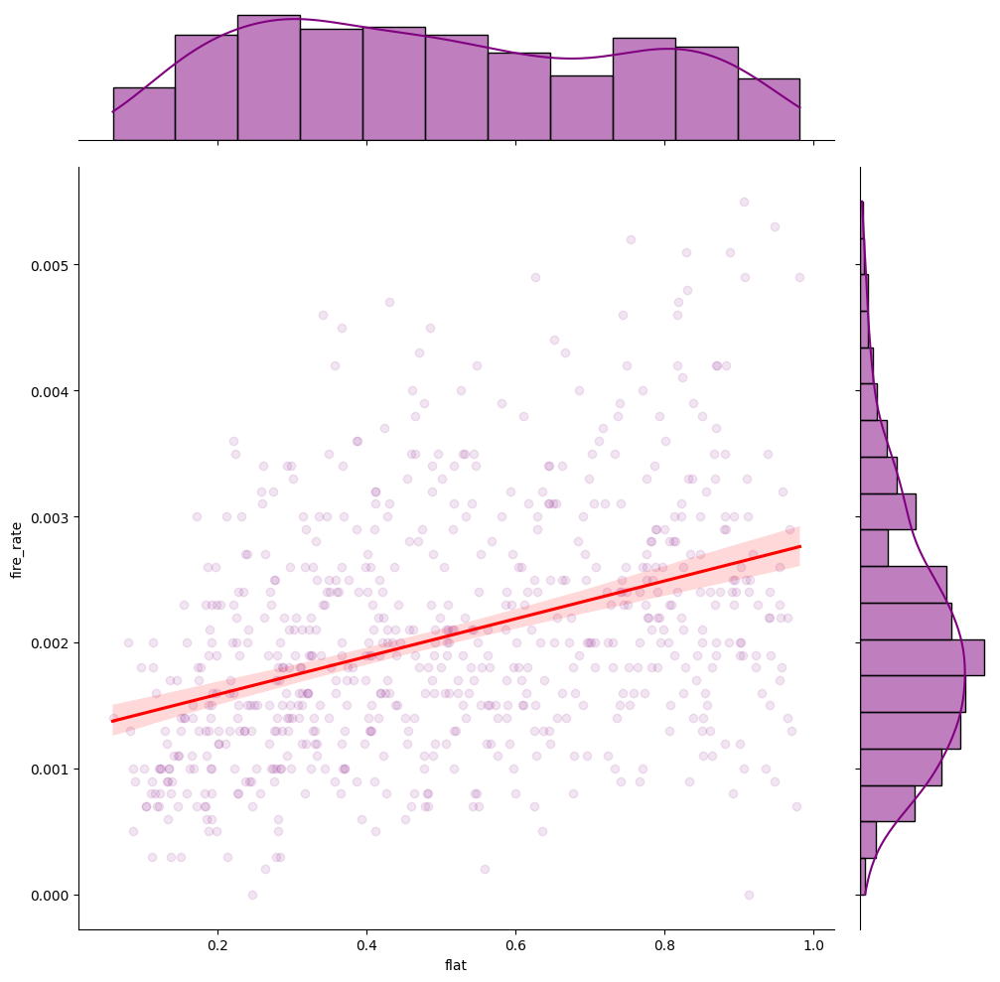

...

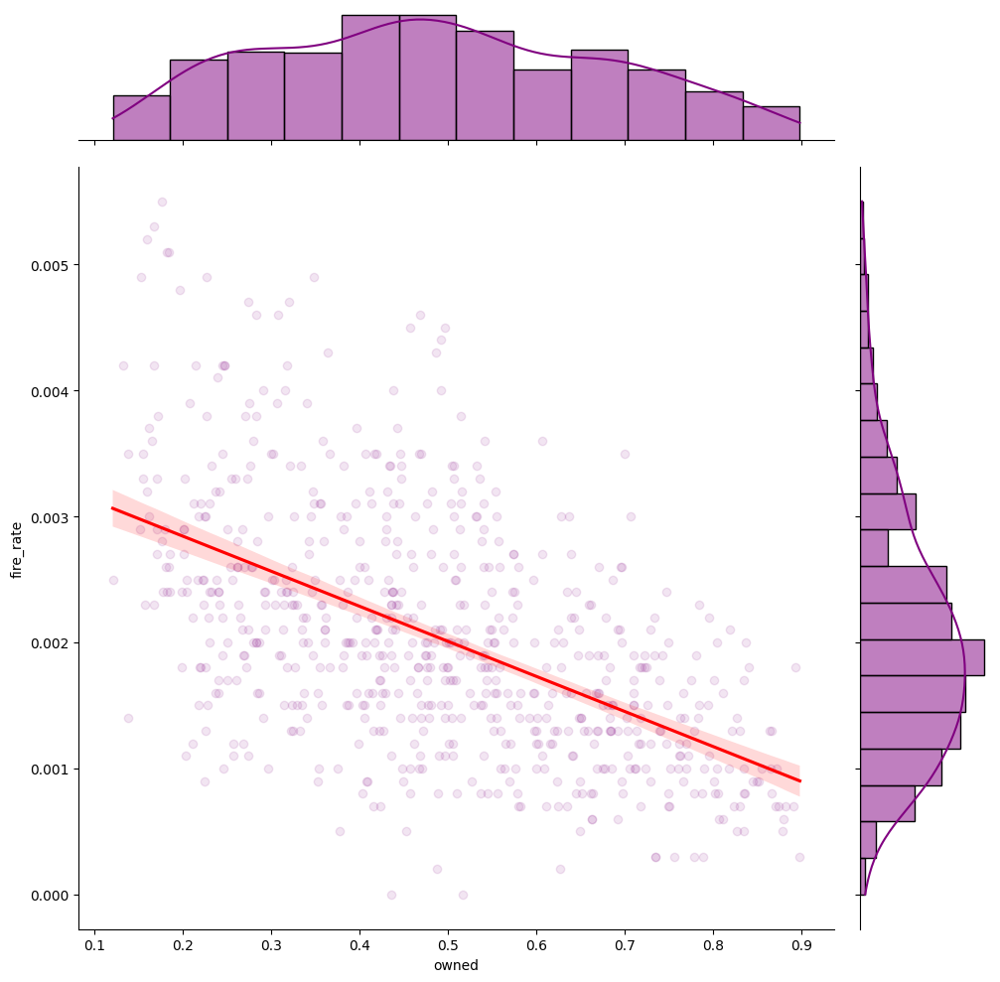

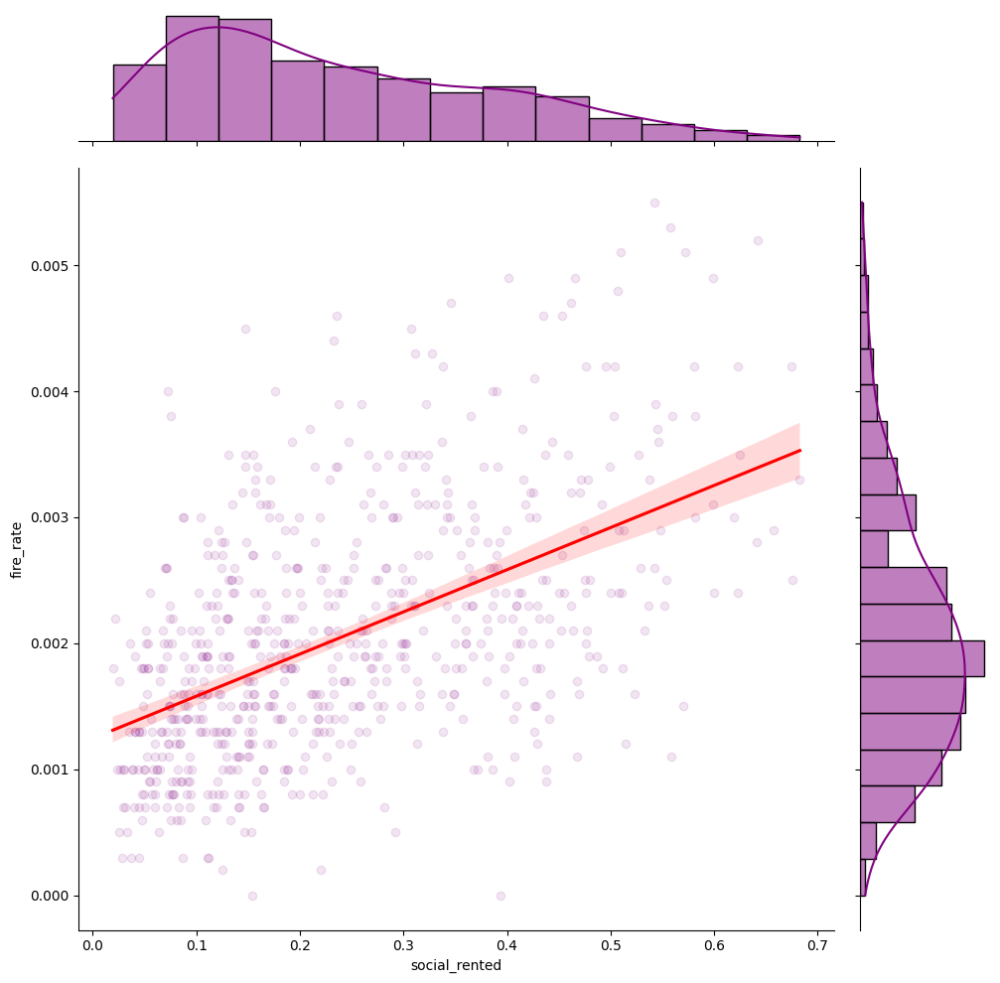

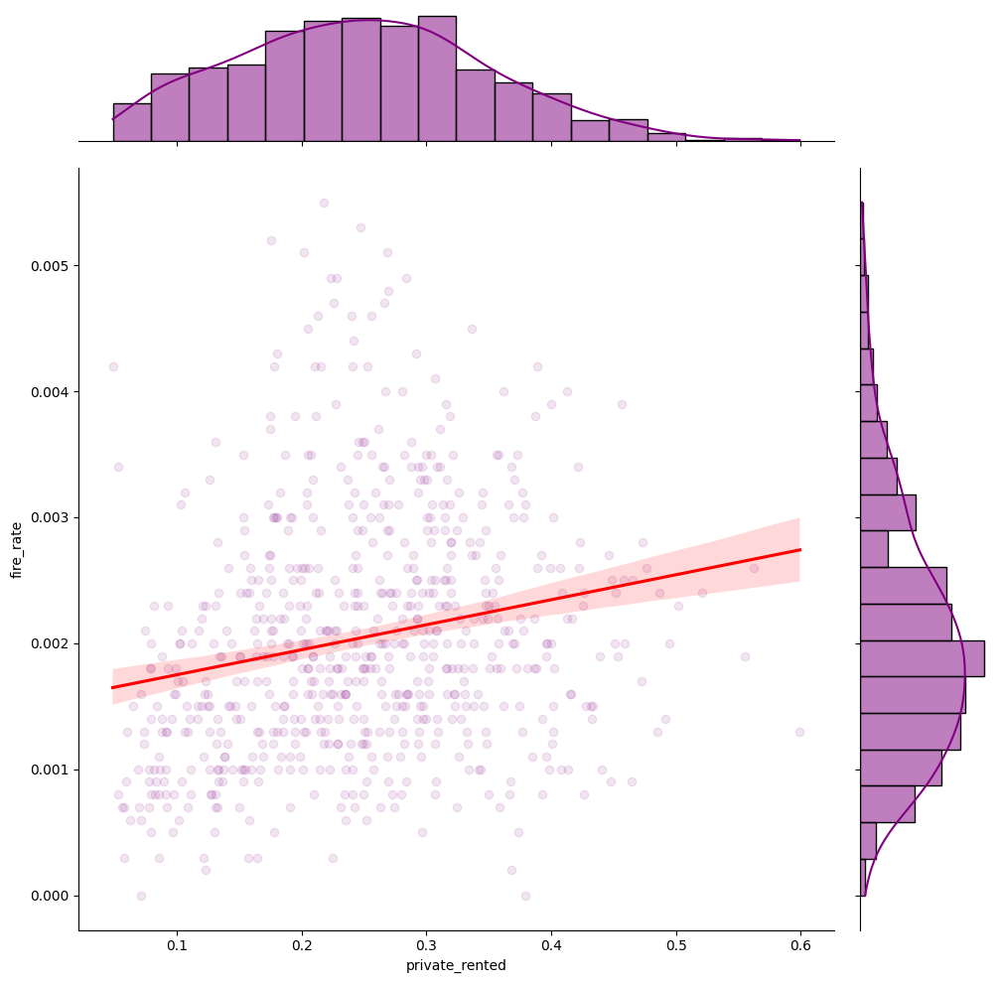

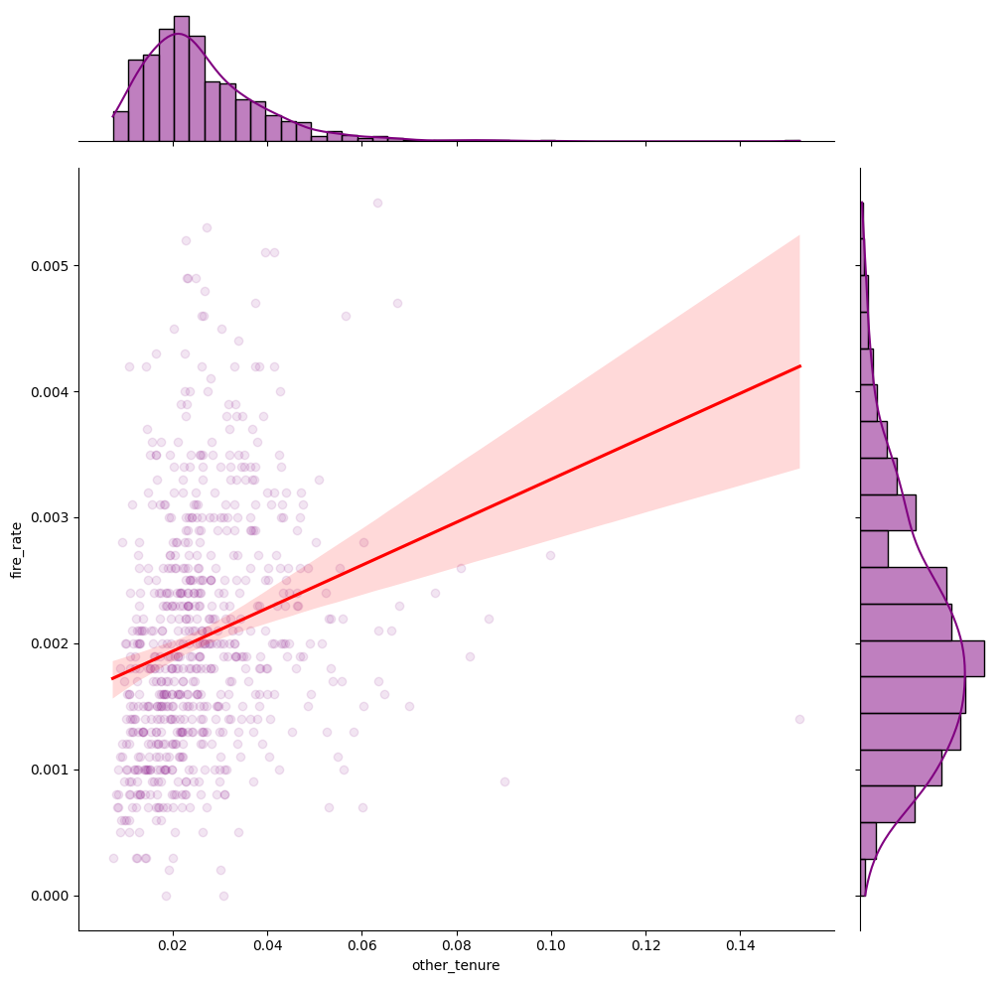

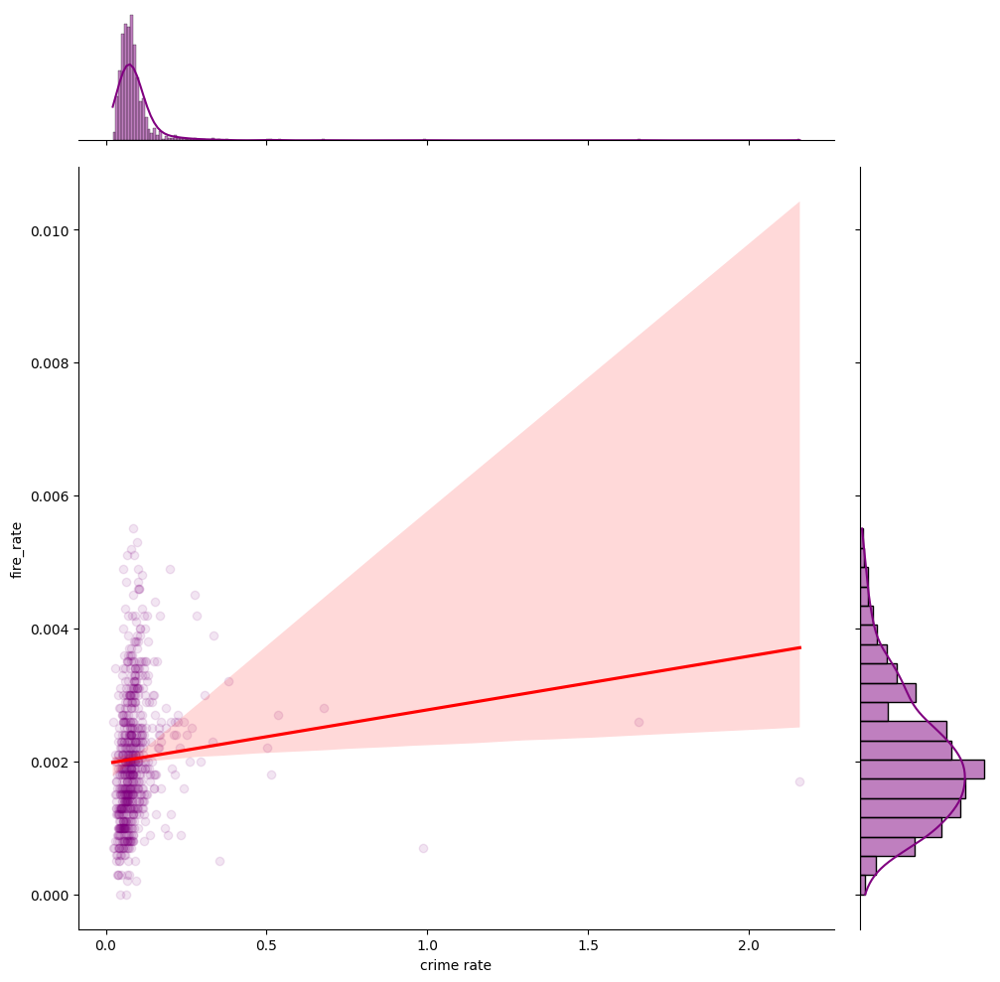

In [47]:
import seaborn as sns
y = 'fire_rate'
cols = full_incident_rate_2011.columns[12:]
for col in cols:
    sns.jointplot(data=full_incident_rate_2011, x=col, y=y, kind="reg",
                  scatter_kws=dict(alpha=0.1), line_kws=dict(color='red'), height=10, color = 'purple')
    plt.xlabel(col)
    plt.ylabel(y)

C:\Users\ayham\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:1696: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f = plt.figure(figsize=(height, height))


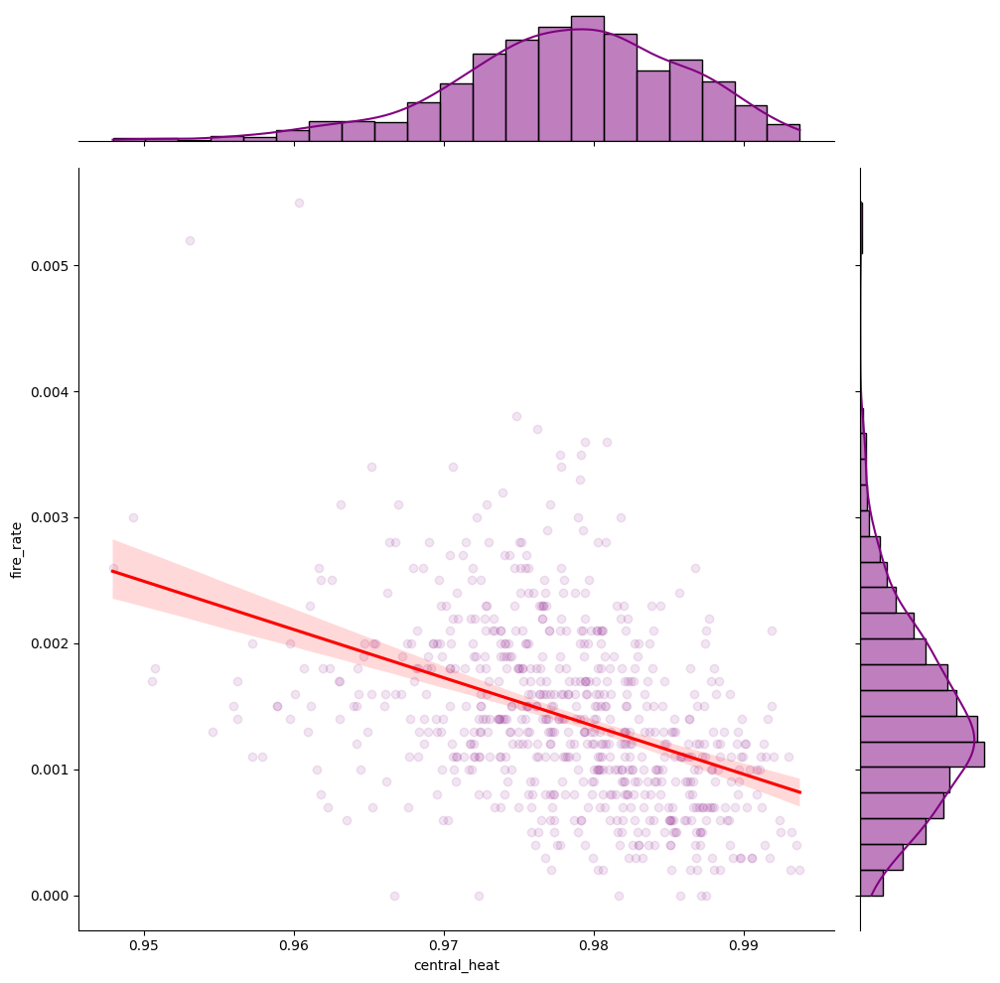

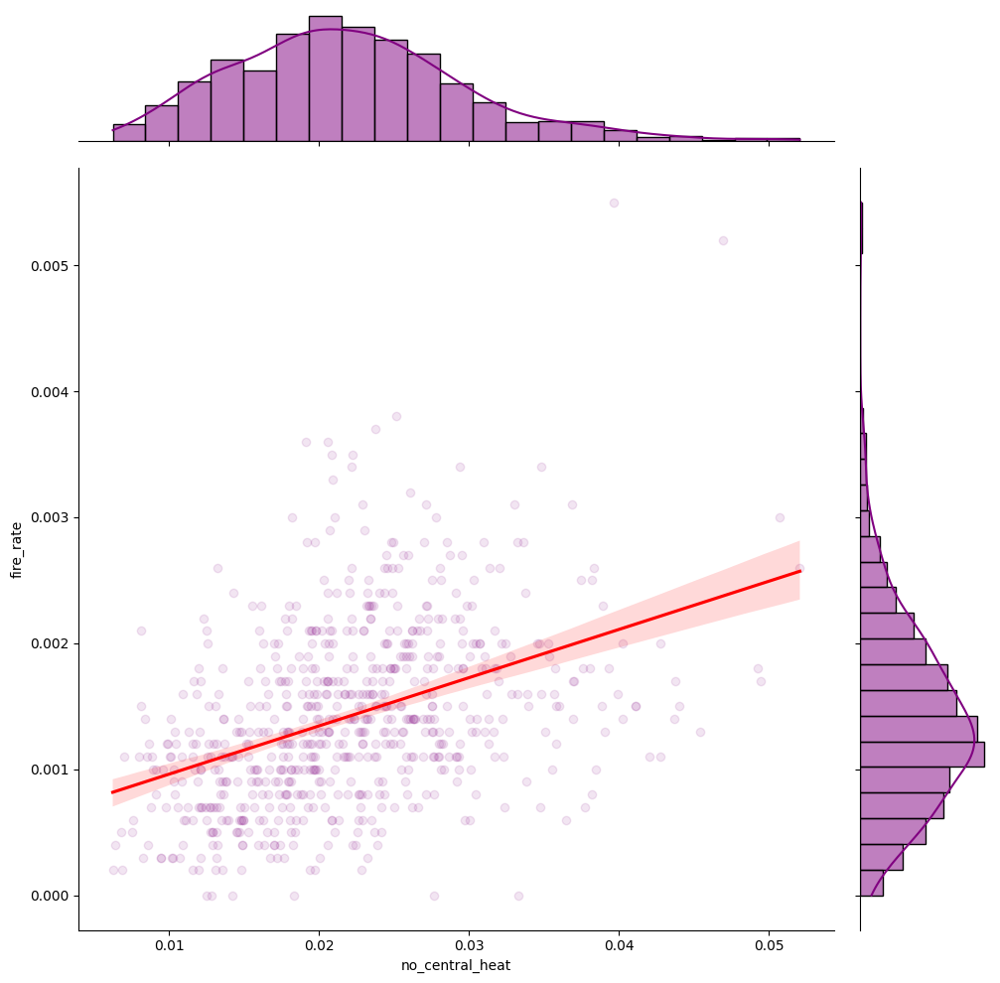

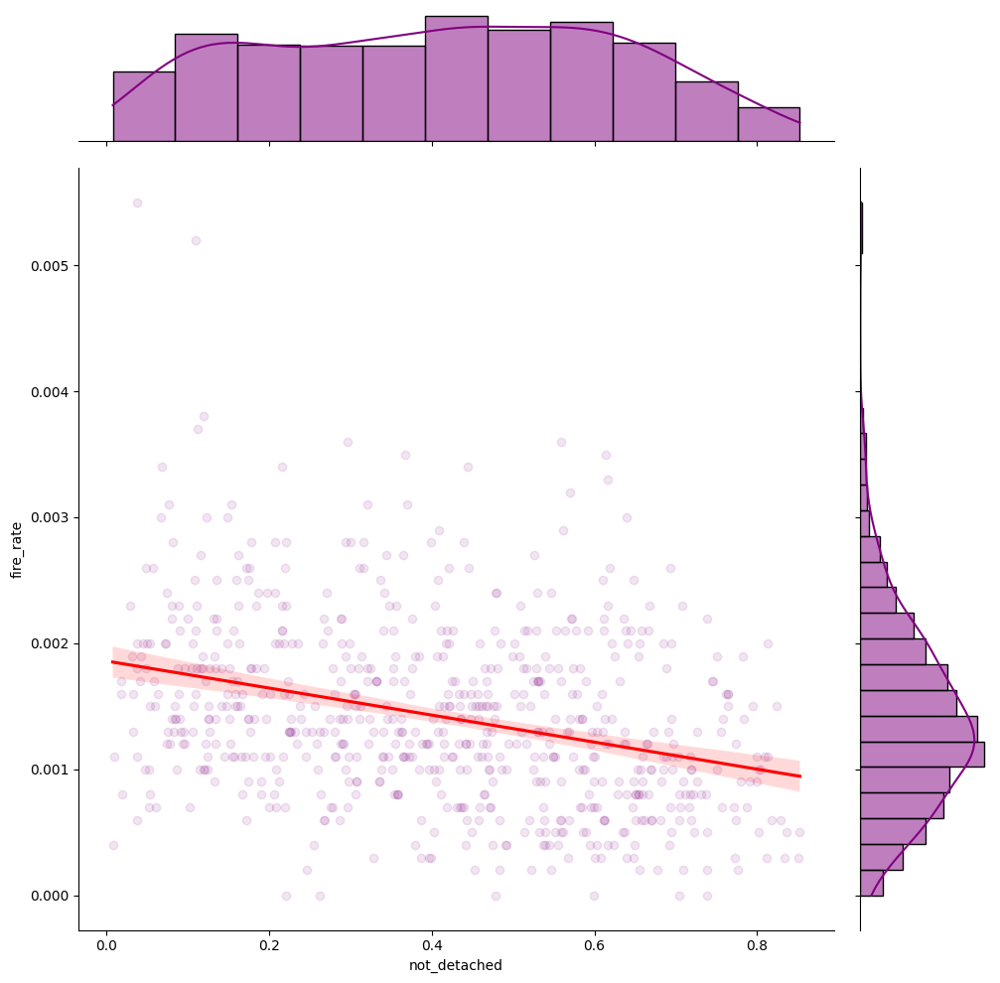

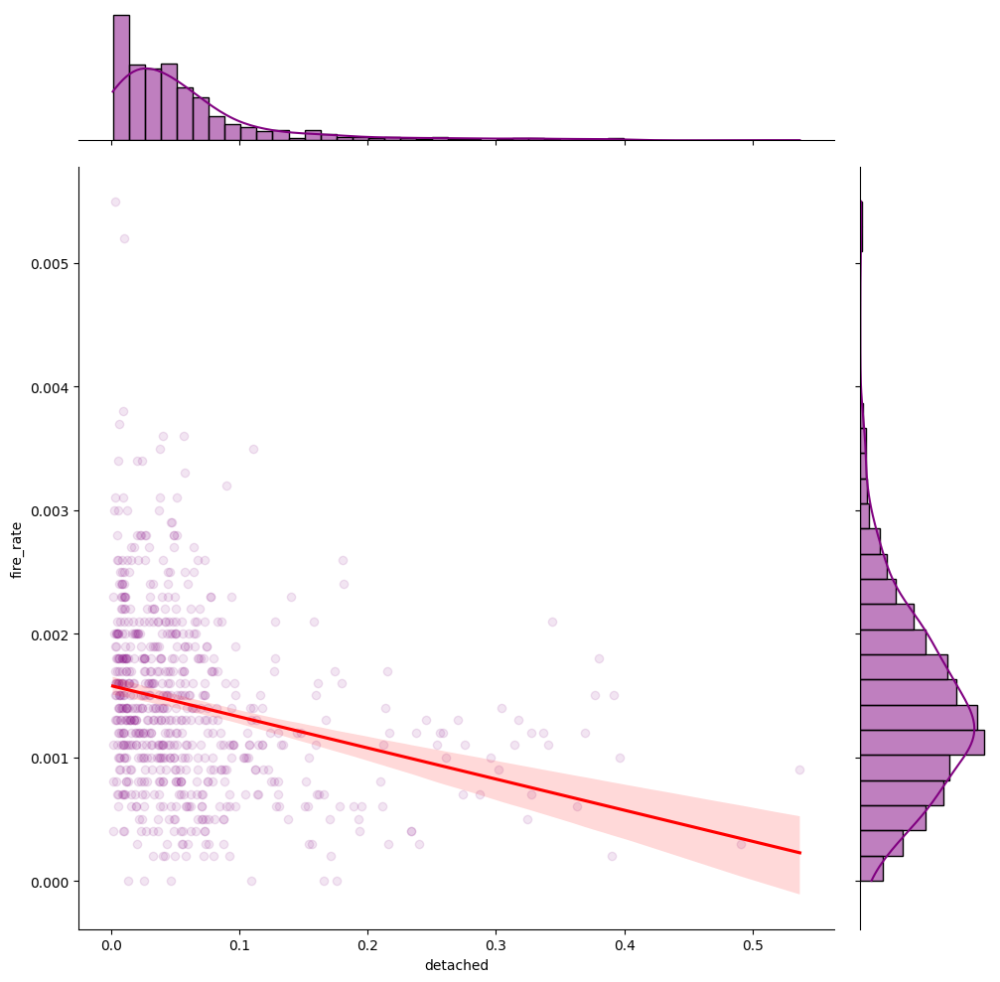

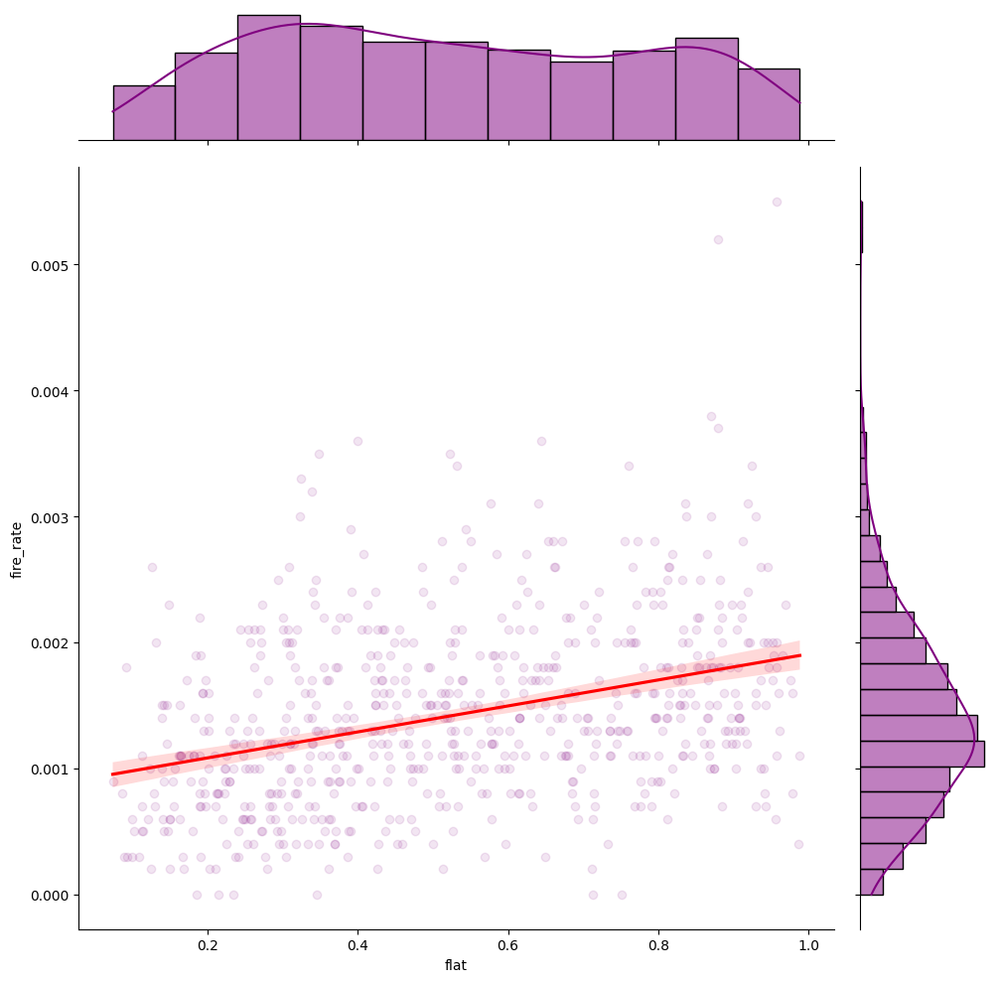

...

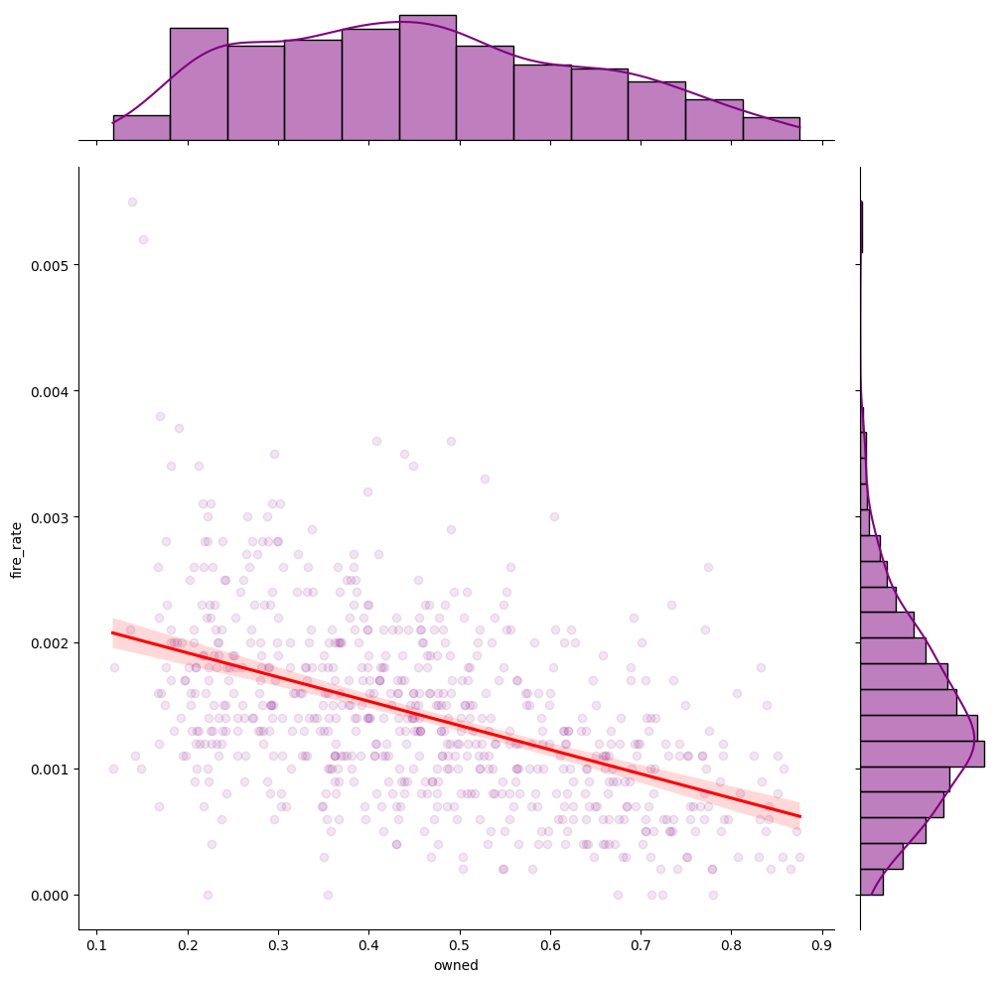

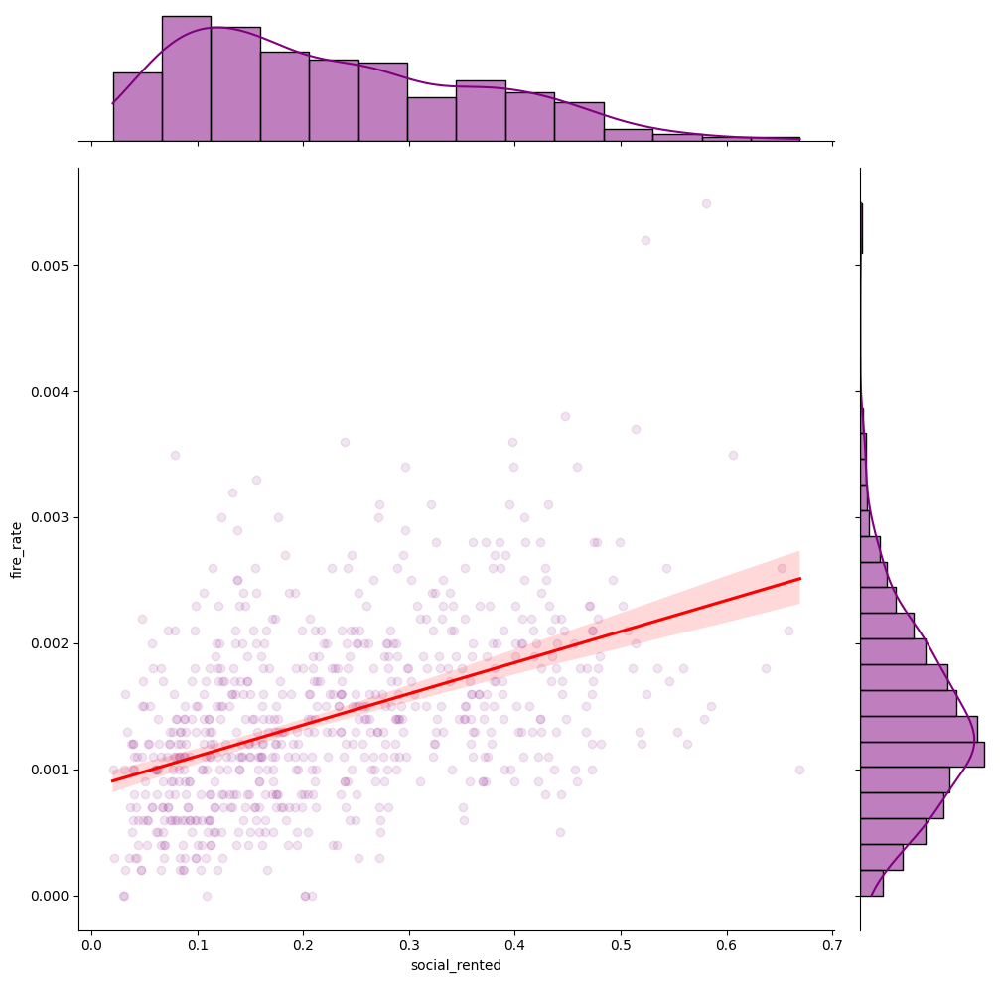

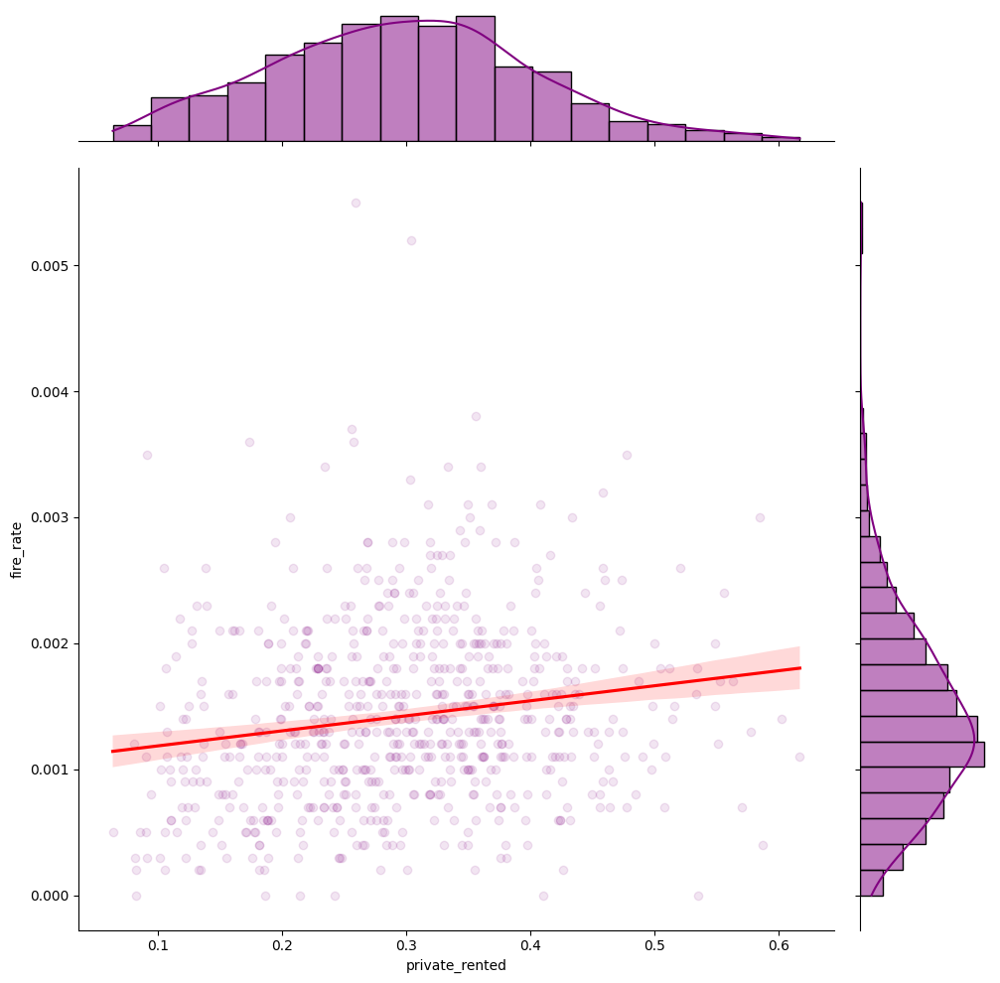

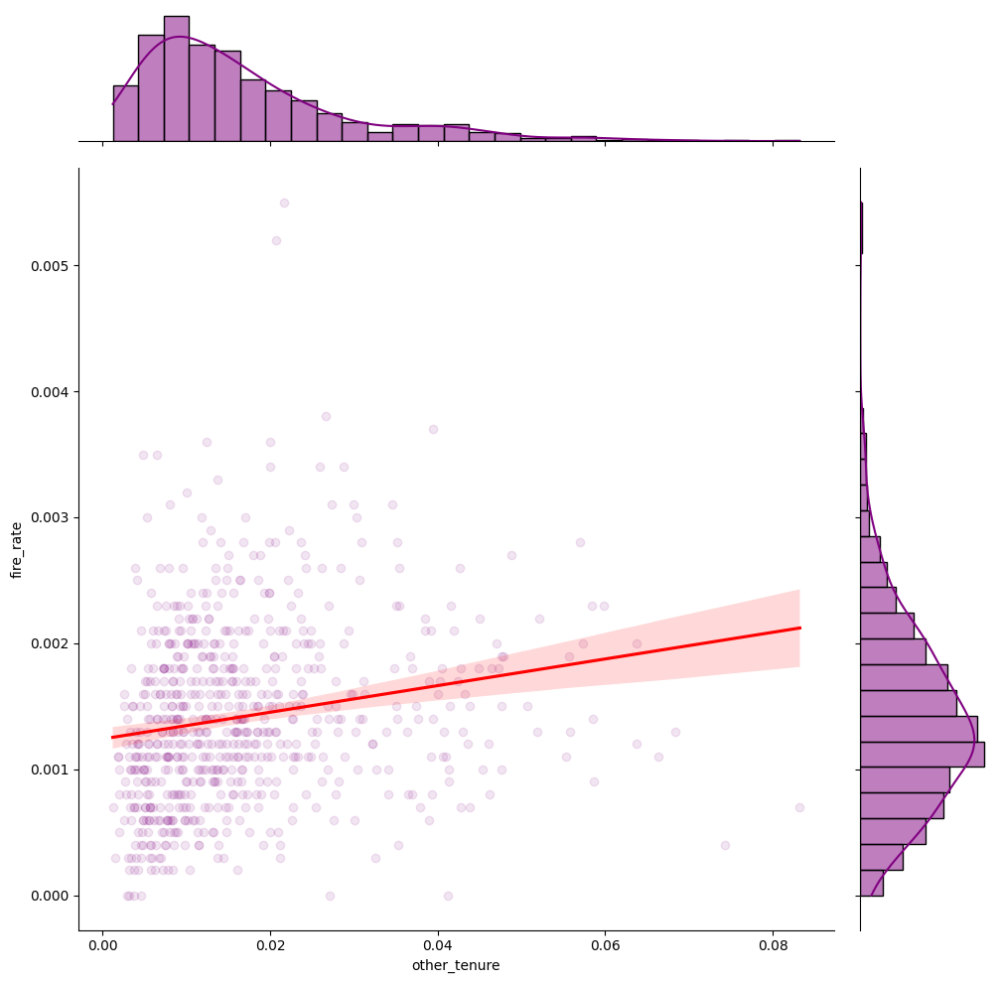

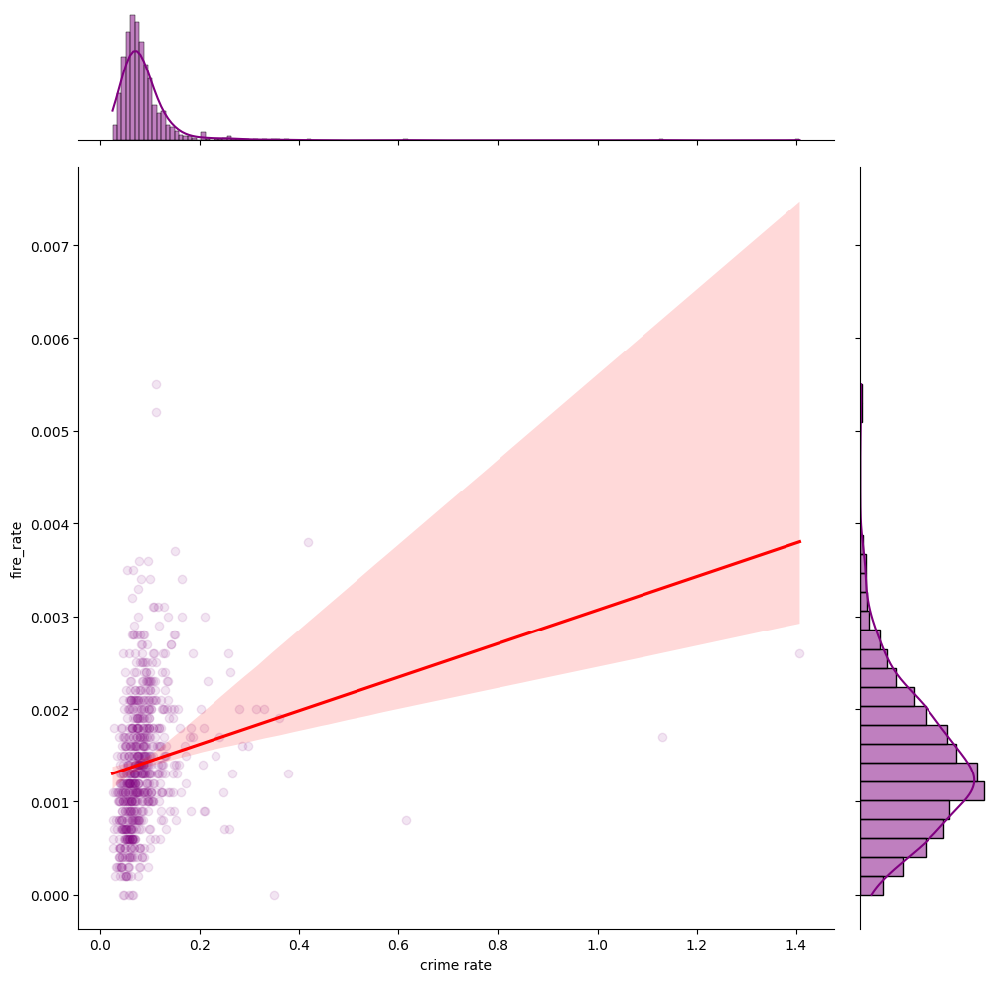

In [48]:
import seaborn as sns
y = 'fire_rate'
cols = full_incident_rate_2021.columns[12:]
for col in cols:
    sns.jointplot(data=full_incident_rate_2021, x=col, y=y, kind="reg",
                  scatter_kws=dict(alpha=0.1), line_kws=dict(color='red'), height=10, color = 'purple')
    plt.xlabel(col)
    plt.ylabel(y)